In [1]:
# ============================================================
# Cell 0 – Constants, helpers, and data-loading utilities
#
# Pipeline overview
# -----------------
#   Cell 0  : define constants, load archive index, define helper functions
#   Cell 1  : iterate over all mouse/week folders; load .dat spectra into a
#             4-D signal map (metabolite × x × y × scan); derive hindlimb
#             masks from anatomical PNG images
#   Cell 2  : compute baseline-normalised concentrations for each metabolite,
#             produce image grids and time-course plots per mouse
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
from scipy.io import loadmat
from glob import glob
import os
import re
import pandas as pd
from pathlib import Path
import tarfile, io


# ── Archive access ────────────────────────────────────────────────────────────
# All raw data live inside Data_Samia.tar.xz.  The archive has a nested layout
# (macOS artefact): actual data is at Data_Samia/Data_Samia/{week}/{mouseID}/.
# We open the archive once and build a name→TarInfo index for fast lookups.
TAR_PATH = "Data_Samia.tar.xz"
TAR_ROOT = "Data_Samia/Data_Samia"
_tar = tarfile.open(TAR_PATH, "r:xz")
_tar_members = {m.name: m for m in _tar.getmembers() if m.isfile() or m.isdir()}

# ── Study layout ─────────────────────────────────────────────────────────────
WEEKS = ["basal", "w3", "w6", "w9"]
mouse_IDs = [45, 47, 48, 53, 54, 55, 56]

# Maximum number of scans to consider per session
TARGET_SCANS = 14

# 0-based index of the first post-injection scan in the valid-scan sequence.
# Scans with index < FIRST_POST_INDEX are treated as baseline.
FIRST_POST_INDEX = 2 - 1   # = 1  (scan 0 is baseline, scan 1 onward is post-injection)

# Duration of a single scan acquisition
SCAN_DURATION_SEC = 4 * 60 + 40   # 280 s = 4 min 40 s

# ── Spectral axis correction ──────────────────────────────────────────────────
# The .dat files store the raw frequency axis.  Subtracting PPM_OFFSET shifts
# it to the standard chemical-shift scale used for peak integration.
# (Matches the MATLAB processing: ppm = dat(:,1) - ppm_offset)
PPM_OFFSET = -5.5   # ppm

# ── Metabolite spectral windows ───────────────────────────────────────────────
# Each entry: metabolite name → (ppm_min, ppm_max) integration window.
# Windows cover the main 2H resonance of each metabolite.
metabolites = {
    "Water":     (4.7, 4.9),   # HDO  ~4.8 ppm
    "Glucose":   (3.3, 3.9),   # D2-glucose  ~3.7 ppm
    "Glutamate": (2.0, 2.7),   # Glx  ~2.35 ppm
    "Lactate":   (1.1, 1.5),   # Lac  ~1.3 ppm
}

# ── MRI acquisition parameters (Bruker 9.4 T; Frontiers Immunol. 2023) ───────
flip_angle_deg = 60                          # nominal RF pulse flip angle (°)
flip_angle_rad = np.deg2rad(flip_angle_deg)
voxel_water_fraction = 0.75   # assumed water fraction of hindlimb muscle voxel

# Natural abundance HDO concentration in tissue water.
# [HDO] = 2 × (D/H ratio 156 ppm) × [H2O total ~55,500 mM] ≈ 17.3 mM
conc_HDO_natural = 17.16   # mM

TR = 350   # repetition time (ms)

# ── T1 relaxation times for 2H metabolites ────────────────────────────────────
# Values sourced from literature (measured primarily at 7 T; PMC11922071).
# NOTE: this scanner operates at 9.4 T (Bruker; Frontiers Immunol. 2023).
# 2H T1 times are field-strength dependent; ideally these should be measured
# or taken from published 9.4 T values.
T1_HDO = 350   # ms – HDO in tissue
T1_Glc = 60    # ms – D2-glucose
T1_Glx = 170   # ms – deuterated glutamate/glutamine (Glx)
T1_Lac = 300   # ms – deuterated lactate

# ── Saturation factor (Ernst equation for steady-state spoiled GRE) ───────────
# SF = sin(FA) × (1 − E1) / (1 − E1 × cos(FA)),   E1 = exp(−TR / T1)
#
# SF quantifies how much the signal is attenuated relative to a fully
# relaxed acquisition.  Because concentrations are derived as a RATIO
# SF_HDO / SF_Met, the sin(FA) factor cancels when both species are
# measured with the same flip angle—so the result is independent of FA.
#
# (PMC11922071 defines SF without the sin(FA) prefactor; including it here
# is numerically equivalent for all ratio-based calculations.)
def saturation_factor(T1, flip_angle_rad, TR):
    E1 = np.exp(-TR / T1)
    return (1 - E1) * np.sin(flip_angle_rad) / (1 - E1 * np.cos(flip_angle_rad))

SF_HDO = saturation_factor(T1_HDO, flip_angle_rad, TR)
SF_Glc = saturation_factor(T1_Glc, flip_angle_rad, TR)
SF_Glx = saturation_factor(T1_Glx, flip_angle_rad, TR)
SF_Lac = saturation_factor(T1_Lac, flip_angle_rad, TR)
hash_SF = {
    "Water":     SF_HDO,
    "Glucose":   SF_Glc,
    "Glutamate": SF_Glx,
    "Lactate":   SF_Lac,
}

# ── Concentration transform factors ──────────────────────────────────────────
# The full Δ-concentration formula (applied in Cell 2) is:
#
#   Δ[Met](x,y,t) = (S_met(x,y,t) − S_met_baseline(x,y))
#                   ─────────────────────────────────────  ×  F_met
#                         S_HDO_baseline(x,y)
#
# where F_met = (SF_HDO / SF_met) × (conc_HDO_natural / N_D) × voxel_water_fraction
#       N_D   = number of chemically equivalent deuterons per molecule
#               (1 for HDO, 2 for Glc/Lac, 4/3 ≈ 1.33 for Glx)
#
# This yields the CHANGE in metabolite concentration from the pre-injection
# baseline, isolating the administered labelled compound's contribution by
# removing the natural-abundance background (S_met_baseline).
# Compare with the absolute-concentration formula in PMC11922071, which uses
# S_met directly without baseline subtraction.
#
# N_D values follow PMC11922071 (de Graaf et al.).
hash_conc_transform_factor = {
    # usage: Δ[Met] = (S_met − S_met_baseline) / S_HDO_baseline × factor
    "Water":     conc_HDO_natural * voxel_water_fraction,                            # N_D = 1
    "Glucose":   SF_HDO / SF_Glc * conc_HDO_natural / 2.0    * voxel_water_fraction, # N_D = 2
    "Glutamate": SF_HDO / SF_Glx * conc_HDO_natural / 1.3333 * voxel_water_fraction, # N_D = 4/3
    "Lactate":   SF_HDO / SF_Lac * conc_HDO_natural / 2.0    * voxel_water_fraction, # N_D = 2
}


# ── Filename parser ───────────────────────────────────────────────────────────
def parse_filename(fname):
    """Extract (week, group, subjectID, scan, x, y) from a .dat filename.

    Expected pattern:
      ..._<week>_<group>_<subjectID>_<...>_<scan>_x<X>_y<Y>.dat
    Returns None if the pattern does not match.
    """
    m = re.search(r"_(\w+)_(\w+)_(\d+)_\d+_\d+_(\d+)_x(\d+)_y(\d+)", fname)
    if m is None:
        return None
    wweek     = m.group(1)
    ggroup    = m.group(2)
    subjectID = int(m.group(3))
    scan      = int(m.group(4))
    x         = int(m.group(5))
    y         = int(m.group(6))
    return wweek, ggroup, subjectID, scan, x, y


# ── Spectrum loader ───────────────────────────────────────────────────────────
def load_spectrum(path):
    """Read a two-column (ppm, signal) .dat spectrum from inside the tar archive.

    Parameters
    ----------
    path : str or Path
        Archive-internal path, e.g. 'Data_Samia/Data_Samia/w6/48/filename.dat'.

    Returns
    -------
    ppm, signal : np.ndarray
        Empty arrays if the file is not found or contains no valid data.
    """
    ppm    = []
    signal = []

    member = _tar_members.get(str(path).replace("\\", "/"))
    if member is None:
        return np.array([]), np.array([])
    raw = _tar.extractfile(member).read().decode("utf-8", errors="replace")
    for line in raw.splitlines():
        line = line.strip()
        if not line:
            continue
        parts = line.split()
        if len(parts) != 2:
            continue
        try:
            x = float(parts[0])
            y = float(parts[1])
        except ValueError:
            continue   # skip header lines
        ppm.append(x)
        signal.append(y)

    return np.array(ppm), np.array(signal)


import collections

# ── 4-D signal map builder ────────────────────────────────────────────────────
def build_mouse_maps(files, metabolites, ppm_offset: float = 0.0):
    """Build a 4-D signal map for one mouse/week folder.

    For each .dat file: load spectrum, apply ppm offset, smooth with
    Savitzky-Golay, integrate within each metabolite window, and store
    the mean signal in signal_map[metabolite, x, y, scan].

    Parameters
    ----------
    files : list of str
        Archive-internal paths of .dat files belonging to one mouse/week.
    metabolites : dict
        {name: (ppm_min, ppm_max)} integration windows.
    ppm_offset : float
        Subtracted from the raw frequency axis before integration.

    Returns
    -------
    signal_map : ndarray, shape (n_met, nx, ny, n_scan), or None on failure
    scan_idx   : ndarray of 0-based contiguous scan indices
    subjects   : ndarray of subject IDs
    groups     : list of group labels
    """
    groups   = []
    subjects = []
    scans    = []
    coords   = []
    spectra  = []

    for f0 in files:
        f = Path(f0)
        parsed = parse_filename(f.name)
        if parsed is None:
            continue
        wweek, ggroup, subjectID, scan, x0, y0 = parsed
        ppm0, sig = load_spectrum(f)
        if ppm0.size == 0 or sig.size == 0:
            continue

        ppm  = ppm0 - ppm_offset
        x, y = x0 - 1, y0 - 1   # 1-based file coords → 0-based array indices

        # Savitzky-Golay smoothing (window 11, polynomial order 3).
        # Window is reduced for short spectra to avoid scipy errors.
        win = 11
        if sig.size < win:
            win = max(3, sig.size if sig.size % 2 == 1 else sig.size - 1)
        if win >= 3 and win <= sig.size:
            sig = savgol_filter(sig, win, 3)

        groups.append(ggroup)
        subjects.append(subjectID)
        scans.append(scan)
        coords.append((x, y))
        spectra.append((ppm, sig))

    if not spectra:
        return None, None, None, None

    subjects = np.array(subjects)
    scans    = np.array(scans)
    xs = np.array([c[0] for c in coords])
    ys = np.array([c[1] for c in coords])

    # Make scan indices 0-based and contiguous (raw scan numbers may start at >0)
    scan_offset = int(np.nanmin(scans))
    scan_idx    = scans - scan_offset

    nx    = int(xs.max() + 1)
    ny    = int(ys.max() + 1)
    nscan = int(scan_idx.max() + 1)
    nmet  = len(metabolites)

    signal_map = np.full((nmet, nx, ny, nscan), np.nan)

    for (ppm, sig), s_idx, x, y in zip(spectra, scan_idx, xs, ys):
        s_idx = int(s_idx)
        if s_idx < 0 or s_idx >= nscan:
            continue
        for m_idx, (mname, (pmin, pmax)) in enumerate(metabolites.items()):
            mask = (ppm >= pmin) & (ppm <= pmax)
            if not np.any(mask):
                continue
            # Integrate (sum) over spectral points in the window.
            # np.sum is correct here because spectral spacing is uniform:
            # sum ∝ peak area, independent of window width.  Using np.mean
            # would divide by the number of points, introducing a spurious
            # factor proportional to window width into every S_met/S_HDO ratio.
            signal_map[m_idx, x, y, s_idx] = np.sum(sig[mask])

    return signal_map, scan_idx, subjects, groups


def group_mean_maps(maps):
    """Average a list of 4-D signal maps, cropping to the smallest common shape.

    Used when multiple acquisitions exist for the same mouse/week.
    """
    min_x = min(m.shape[1] for m in maps)
    min_y = min(m.shape[2] for m in maps)
    min_s = min(m.shape[3] for m in maps)
    cropped = [m[:, :min_x, :min_y, :min_s] for m in maps]
    return np.nanmean(cropped, axis=0)


def fmt_mmss(t_sec: float) -> str:
    """Format a duration in seconds as the string 'MM:SS'."""
    minutes = int(t_sec // 60)
    seconds = int(round(t_sec - 60 * minutes))
    if seconds == 60:
        minutes += 1
        seconds = 0
    return f"{minutes:02d}:{seconds:02d}"


def local_time_label(
    s: int,
    first_post_index: int,
    scan_duration_sec: float,
    allow_negative_times: bool = False,
) -> str:
    """Return a human-readable time label for scan index s (0-based).

    Scans with index < first_post_index are labelled 'Baseline'.
    Scans at or after first_post_index are labelled 't = MM:SS' where
    t = 0 corresponds to the injection time (= first_post_index).

    Parameters
    ----------
    s : int
        0-based sequential scan index within the valid-scan sequence.
    first_post_index : int
        0-based index of the first post-injection scan (= FIRST_POST_INDEX).
    scan_duration_sec : float
        Duration of one scan in seconds.
    allow_negative_times : bool
        If True, pre-injection scans get a negative time label instead of
        'Baseline'.
    """
    offs  = s - first_post_index
    t_sec = offs * scan_duration_sec

    if offs < 0:
        if allow_negative_times:
            return f"t = -{fmt_mmss(abs(t_sec))}"
        return "Baseline"

    return f"t = {fmt_mmss(t_sec)}"


# ── ROI masks (tissue regions of interest) ────────────────────────────────────
from lib_roi_masks import f_get_roi_masks
roi_masks = f_get_roi_masks()   # hand annotated points for muscle ROIs


/tmp/ipykernel_37606/1047917711.py:302: RuntimeWarning: Mean of empty slice
  return np.nanmean(cropped, axis=0)


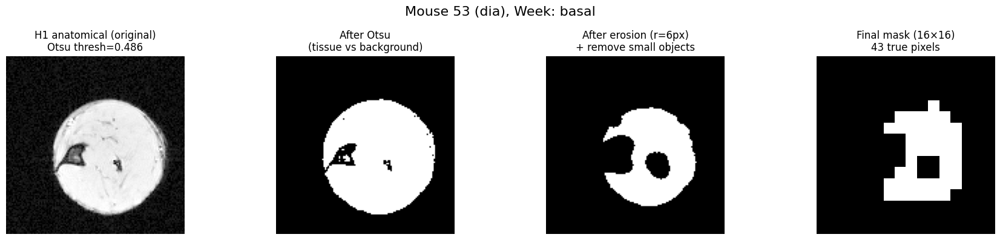

/tmp/ipykernel_37606/1047917711.py:302: RuntimeWarning: Mean of empty slice
  return np.nanmean(cropped, axis=0)


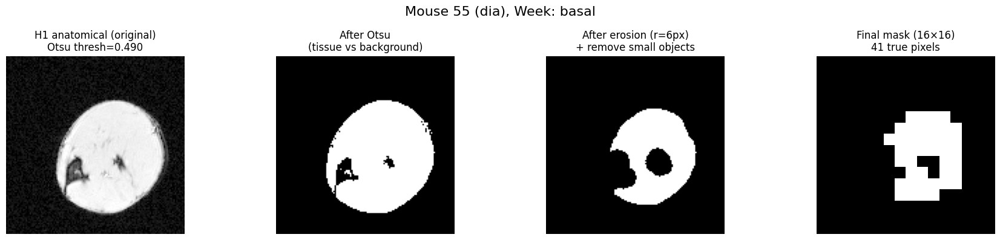

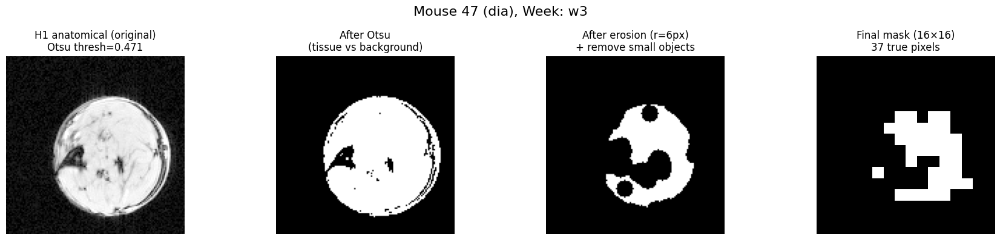

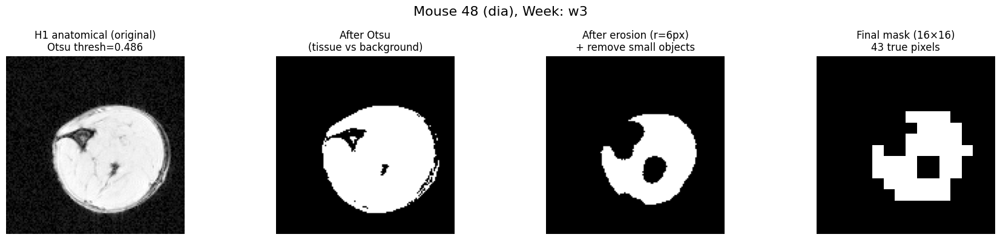

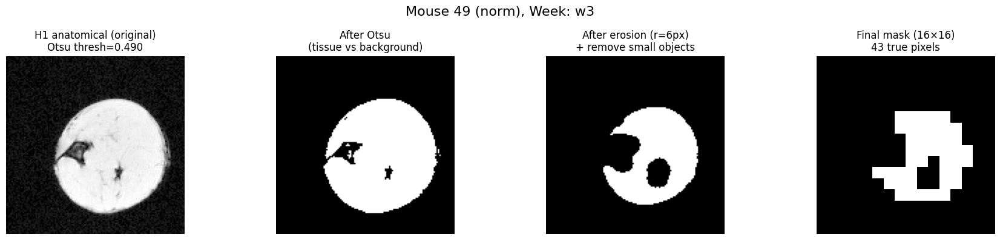

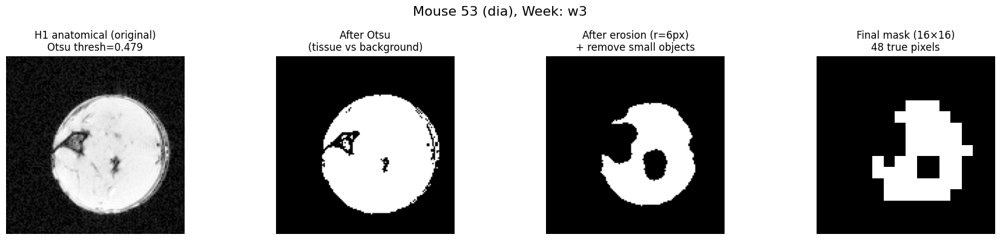

...

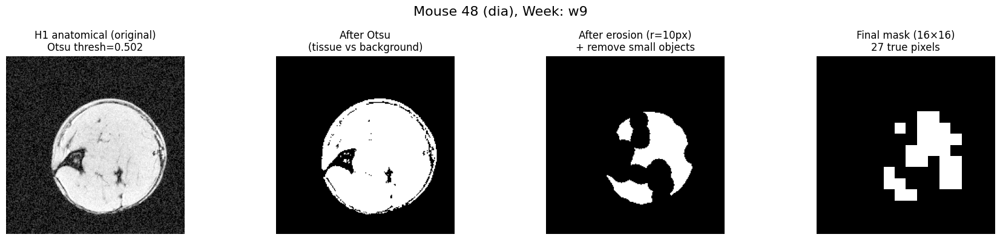

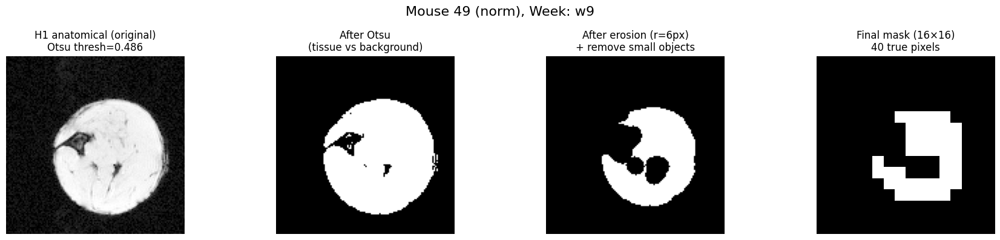

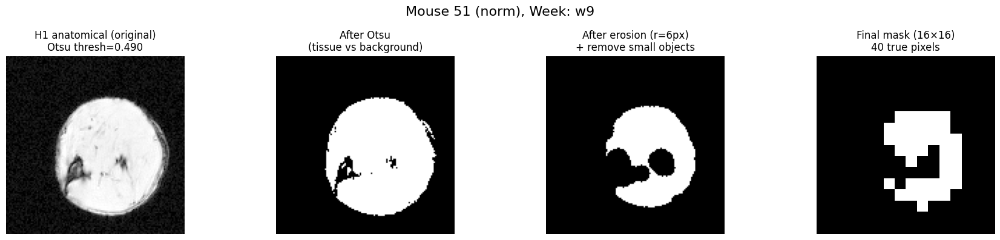

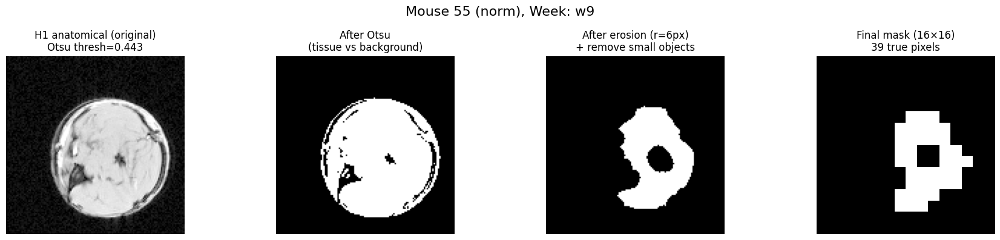

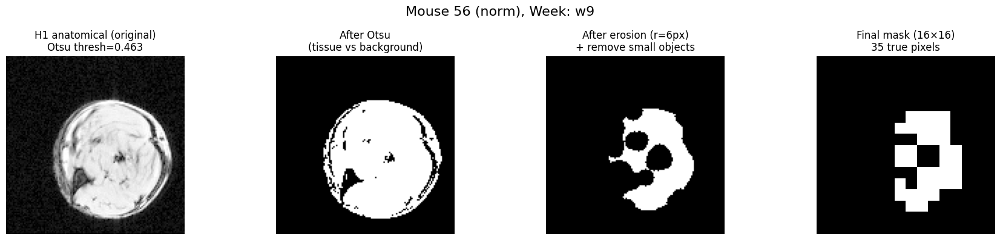

In [2]:
# ============================================================
# Cell 1 – Load all spectra and derive hindlimb masks
#
# For each (week, mouse) folder in the archive:
#   1. Collect all .dat spectral files (filenames without spaces only).
#   2. Build a 4-D signal map via build_mouse_maps().
#   3. If a PNG anatomical image is present, derive a muscle-only mask:
#        a. Convert to greyscale (full resolution).
#        b. Single Otsu threshold → tissue vs background (no fill_holes,
#           so bone cortex rings remain as holes isolating bone marrow).
#        c. Erode by ~5% of image height to strip the subcutaneous fat rim.
#        d. Remove small surviving fragments (bone marrow islands, noise).
#        e. Downscale the cleaned mask to 16×16 (= DMI grid resolution).
#
# Results are stored in:
#   hash_mouseID2week2mouseMap     – {mouseID: {week: 4-D signal map}}
#   hash_mouseID2week2maskMap      – {mouseID: {week: 16×16 bool mask}}
#   hash_mouseID2week2H1anatomical – {mouseID: {week: grayscale image array}}
# ============================================================
import collections
hash_mouseID2week2mouseMap     = collections.defaultdict(dict)
hash_mouseID2week2maskMap      = collections.defaultdict(dict)
hash_mouseID2week2H1anatomical = collections.defaultdict(dict)
hash_mouseID2group = {}

# obtain the non bone marrow hand annotated masks
hash_mouseID2week2maskMap_handDrawn = collections.defaultdict(dict)
for tissue in ['TibialisAnt', 'Gastrocnemius', 'Soleus']: # ignore 'Knochenmark'
    for week in roi_masks[tissue].keys():
        for mouseID in roi_masks[tissue][week]:
            mask = roi_masks[tissue][week][mouseID]
            if mouseID not in hash_mouseID2week2maskMap_handDrawn or week not in hash_mouseID2week2maskMap_handDrawn[mouseID]:
                hash_mouseID2week2maskMap_handDrawn[mouseID][week] = mask
            else:
                hash_mouseID2week2maskMap_handDrawn[mouseID][week] = np.logical_or(hash_mouseID2week2maskMap_handDrawn[mouseID][week], mask)

for week in WEEKS:
    # ── Discover mouse sub-folders for this week ──────────────────────────
    week_prefix = f"{TAR_ROOT}/{week}/"
    mouse_folder_names = set()
    for name in _tar_members:
        if name.startswith(week_prefix):
            rest = name[len(week_prefix):]
            if "/" in rest:
                mouse_folder_names.add(rest.split("/")[0])

    for mouse_folder_name in sorted(mouse_folder_names):
        try:
            mouseID = int(mouse_folder_name)
        except ValueError:
            continue   # skip non-numeric sub-folders (e.g. .DS_Store remnants)

        folder_prefix = f"{TAR_ROOT}/{week}/{mouse_folder_name}/"

        # ── Collect .dat spectra (skip filenames that contain spaces) ─────
        files_0 = [n for n in _tar_members if n.startswith(folder_prefix) and n.endswith(".dat")]
        files   = [x for x in files_0 if " " not in x]

        # ── Locate anatomical PNG (prefer {mouseID}.png if it exists) ─────
        files_png_0_a = [n for n in _tar_members if n.startswith(folder_prefix) and n.endswith(".png")]
        files_png_0_b = [n for n in files_png_0_a if n.split("/")[-1] == f"{mouseID}.png"]
        files_png_a   = [x for x in files_png_0_a if " " not in x]
        files_png_b   = [x for x in files_png_0_b if " " not in x]
        file_png = None
        if files_png_b:
            file_png = files_png_b[0]
        elif files_png_a:
            file_png = files_png_a[0]

        if not files:
            continue

        # ── Build 4-D signal map ──────────────────────────────────────────
        m_map, scans, subjects, groups = build_mouse_maps(files, metabolites, ppm_offset=PPM_OFFSET)
        if len(set(subjects)) > 1:
            print(f"Warning: multiple subjects in week {week}, folder {mouse_folder_name}")

        for s, subjectID, group in zip(scans, subjects, groups):
            if subjectID not in hash_mouseID2group:
                hash_mouseID2group[int(subjectID)] = group

        if m_map is not None:
            if mouseID not in hash_mouseID2week2mouseMap or week not in hash_mouseID2week2mouseMap[mouseID]:
                hash_mouseID2week2mouseMap[mouseID][week] = group_mean_maps([m_map])
            else:
                print(f"Warning: multiple valid maps for week {week}, folder {mouse_folder_name}")
        else:
            print(f"Warning: no valid data in week {week}, folder {mouse_folder_name}")

        # ── Derive muscle-only mask from anatomical PNG ───────────────────
        # Goal: exclude background, subcutaneous fat (skin rim), and isolated
        # bone marrow islands — keeping the main muscle compartment.
        #
        # Image character: these H1 images are bimodal (background ≈ 0, all
        # tissue ≈ 0.9).  Muscle and fat have similar brightness so they cannot
        # be separated by intensity alone.  Strategy (all steps at full
        # resolution, then downscale to the 16×16 DMI grid):
        #   1. Single Otsu to separate background from tissue.
        #      Do NOT fill holes — bone cortex rings (dark) remain as holes,
        #      keeping isolated bone marrow islands disconnected from muscle.
        #   2. Erode with radius ~5% of image height to strip the subcutaneous
        #      fat / skin rim and to shrink small bone marrow islands.
        #   3. Remove small surviving fragments (isolated bone marrow that
        #      was not already excluded by the cortex holes).
        #   4. Downscale to 16×16.
        if file_png is not None:
            from skimage.filters import threshold_otsu
            from skimage.morphology import erosion, remove_small_objects, disk
            from skimage.transform import resize

            img_member = _tar_members.get(file_png)
            img = plt.imread(io.BytesIO(_tar.extractfile(img_member).read()))  # (H, W[, C])

            # Convert to greyscale
            if img.ndim == 3:
                img_gray = np.mean(img[..., :3], axis=-1)
            else:
                img_gray = img.copy()

            h, w = img_gray.shape[:2]

            # Step 1: single Otsu — tissue vs background
            thresh = threshold_otsu(img_gray)
            mask_tissue = img_gray > thresh
            # (No binary_fill_holes: keep bone cortex holes so marrow stays isolated)

            # Step 2: erode to remove skin/fat rim and shrink bone marrow islands.
            # ~5% of image height (6 px at 128 px) is enough to strip a typical
            # subcutaneous fat layer while still leaving large muscle regions intact.
            erosion_radius = max(2, int(h * 0.05))
            mask_eroded = erosion(mask_tissue, footprint=disk(erosion_radius))

            # Step 3: remove small fragments (bone marrow islands, noise).
            # Threshold: 0.3% of image area (≈ 50 px at 128×128).
            min_obj_px = max(50, int(h * w * 0.003))
            mask_muscle_full = remove_small_objects(mask_eroded, max_size=min_obj_px)

            # Step 4: downscale to the 16×16 DMI grid
            img_16        = resize(img_gray,                        (16, 16), anti_aliasing=True)
            mask_hindlimb = resize(mask_muscle_full.astype(float),  (16, 16), anti_aliasing=True) > 0.5

            mask_hindlimb_handDrawn = hash_mouseID2week2maskMap_handDrawn[mouseID][week] if mouseID in hash_mouseID2week2maskMap_handDrawn and week in hash_mouseID2week2maskMap_handDrawn[mouseID] else np.zeros((16, 16), dtype=bool)
            mask_hindlimb = np.logical_or(mask_hindlimb, mask_hindlimb_handDrawn)

            hash_mouseID2week2maskMap[mouseID][week]      = mask_hindlimb
            hash_mouseID2week2H1anatomical[mouseID][week] = img_gray

            # ── Diagnostic plot ───────────────────────────────────────────
            fig, axes = plt.subplots(1, 4, figsize=(18, 4))
            axes[0].imshow(img_gray,        cmap="gray",  origin="lower")
            axes[0].set_title(f"H1 anatomical (original)\nOtsu thresh={thresh:.3f}")
            axes[1].imshow(mask_tissue,     cmap="gray",  origin="lower")
            axes[1].set_title("After Otsu\n(tissue vs background)")
            axes[2].imshow(mask_muscle_full, cmap="gray", origin="lower")
            axes[2].set_title(f"After erosion (r={erosion_radius}px)\n+ remove small objects")
            axes[3].imshow(mask_hindlimb,   cmap="gray",  origin="lower")
            axes[3].set_title(f"Final mask (16×16)\n{mask_hindlimb.sum()} true pixels")
            for ax in axes:
                ax.axis("off")
            plt.suptitle(f"Mouse {mouseID} ({group}), Week: {week}", fontsize=16)
            plt.tight_layout()
            plt.show()


<Figure size 640x480 with 0 Axes>

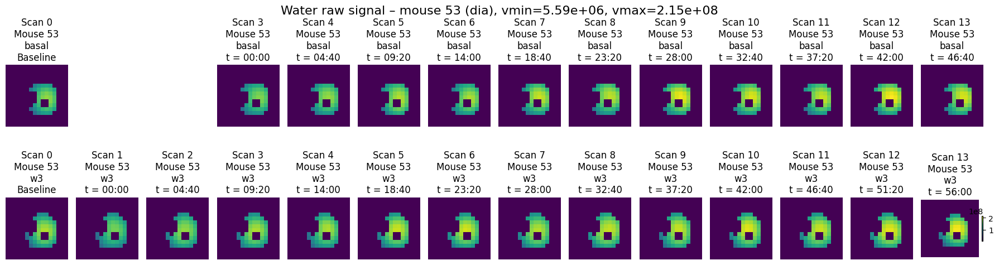

<Figure size 640x480 with 0 Axes>

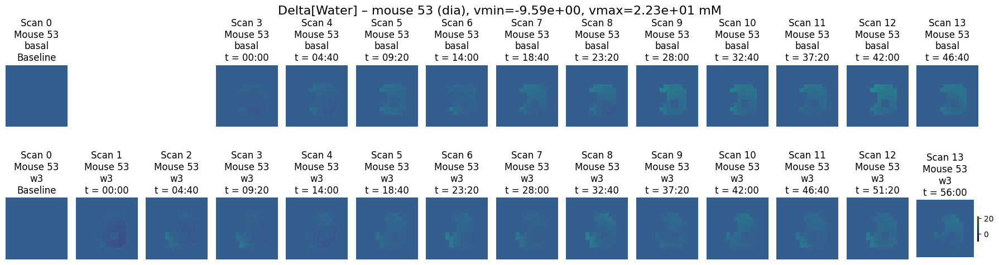

<Figure size 640x480 with 0 Axes>

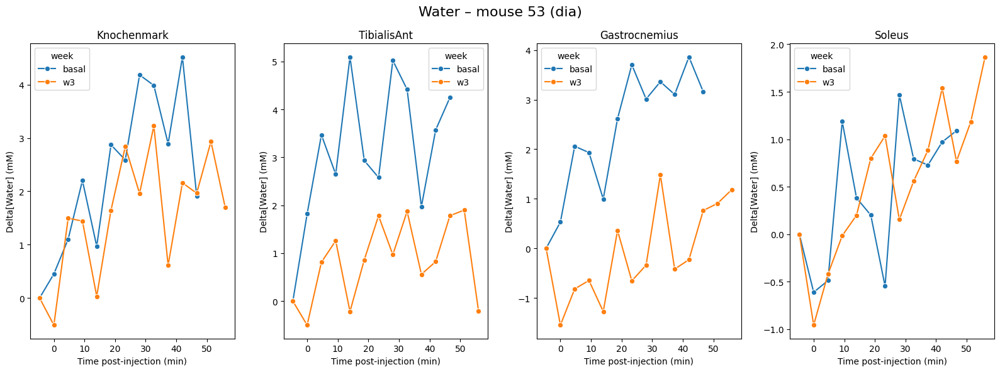

<Figure size 640x480 with 0 Axes>

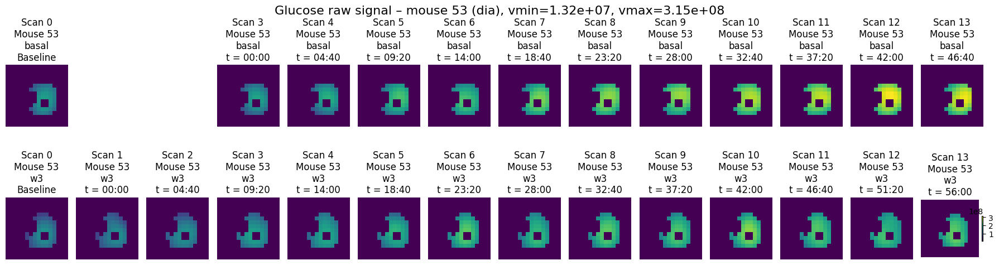

<Figure size 640x480 with 0 Axes>

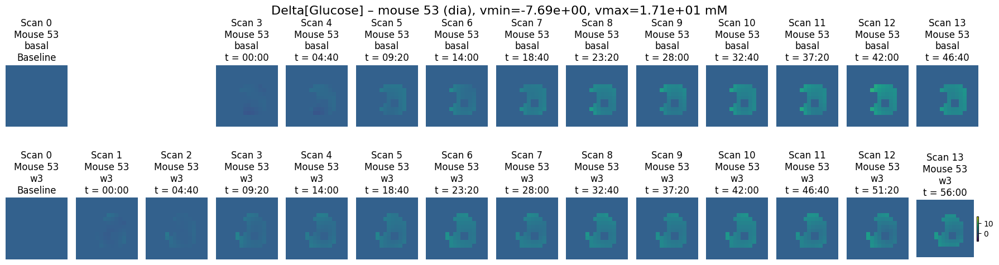

<Figure size 640x480 with 0 Axes>

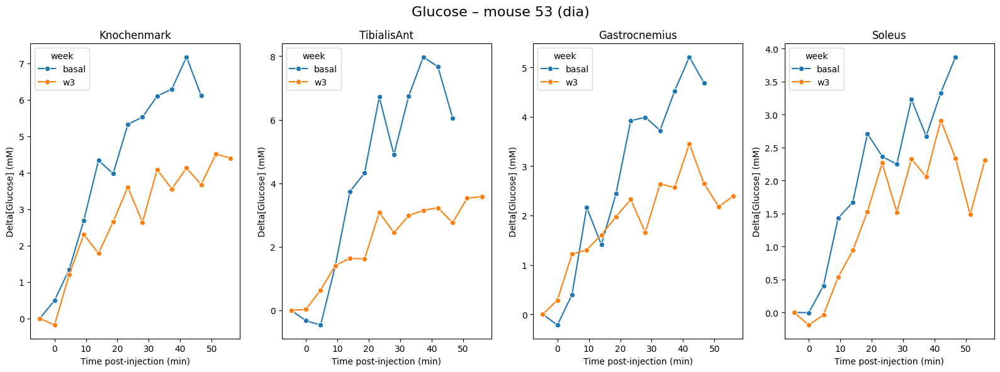

<Figure size 640x480 with 0 Axes>

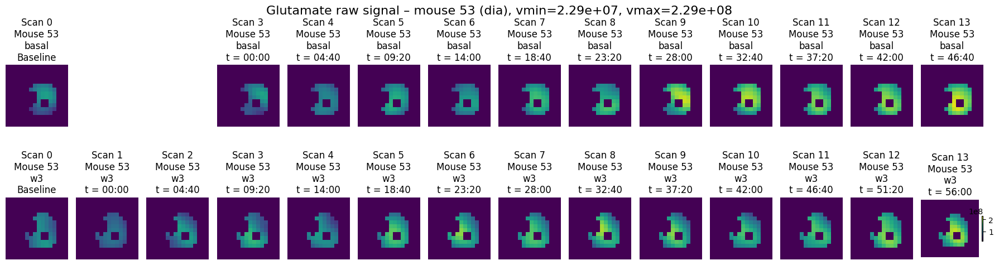

<Figure size 640x480 with 0 Axes>

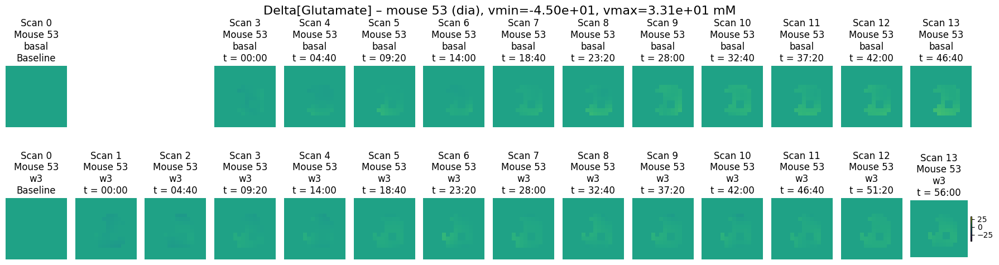

<Figure size 640x480 with 0 Axes>

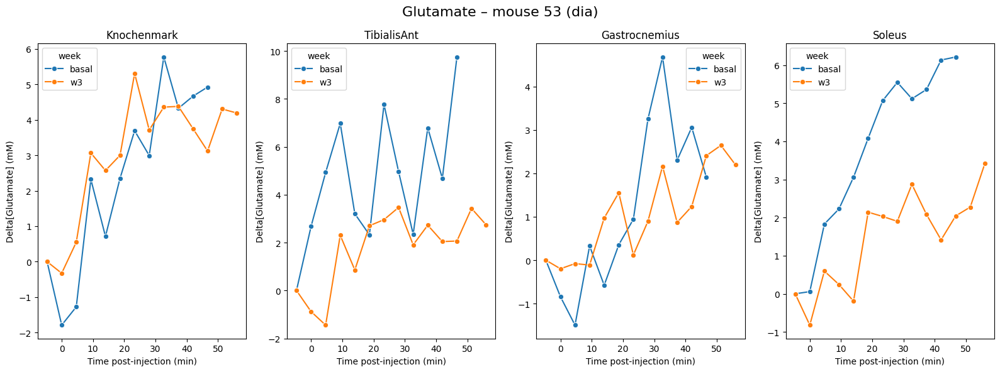

<Figure size 640x480 with 0 Axes>

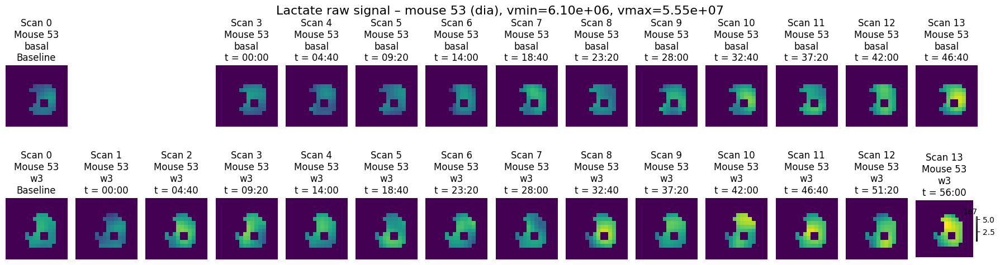

<Figure size 640x480 with 0 Axes>

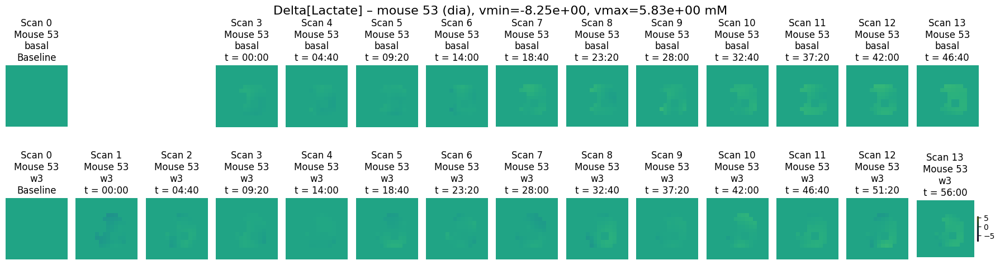

<Figure size 640x480 with 0 Axes>

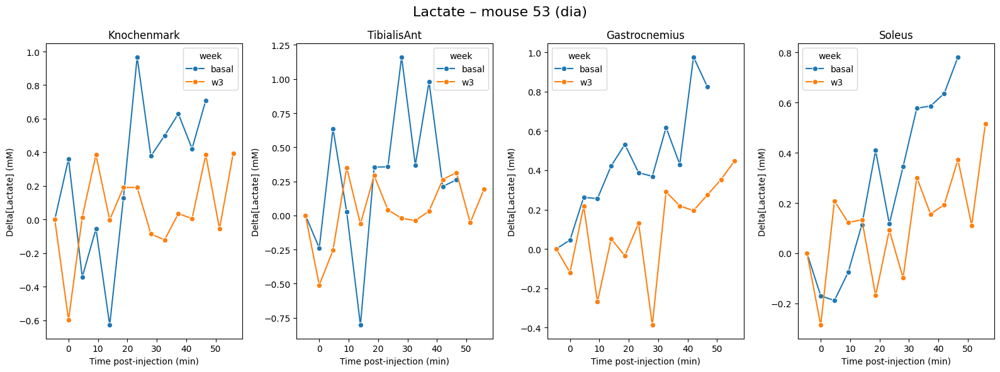

<Figure size 640x480 with 0 Axes>

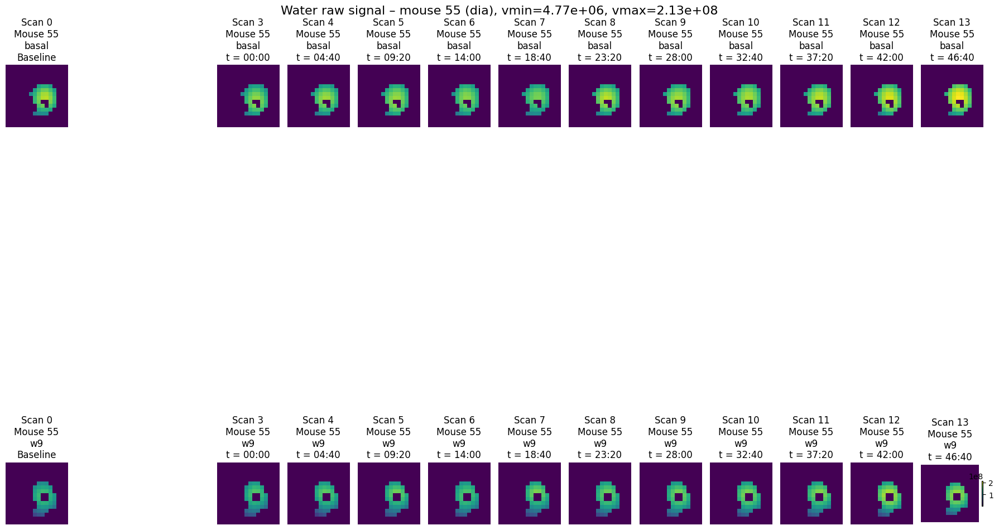

<Figure size 640x480 with 0 Axes>

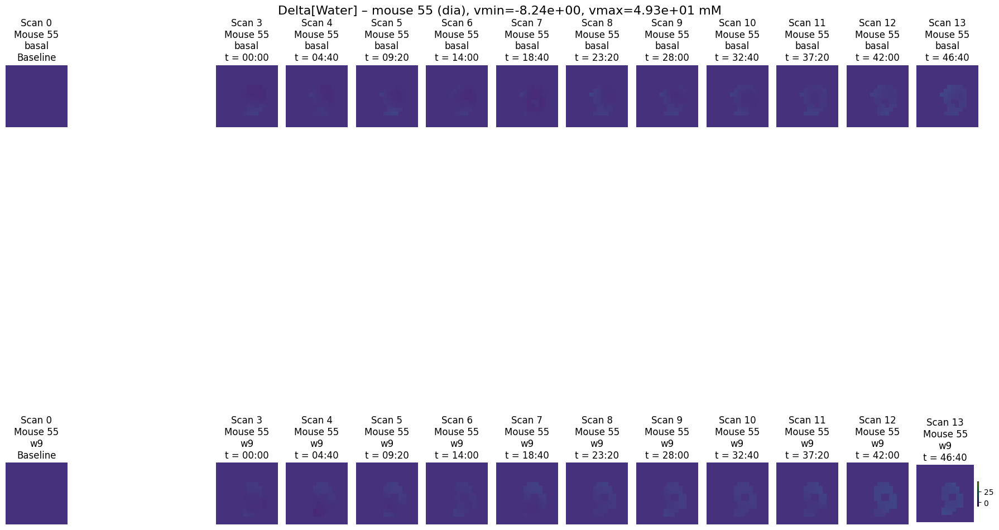

<Figure size 640x480 with 0 Axes>

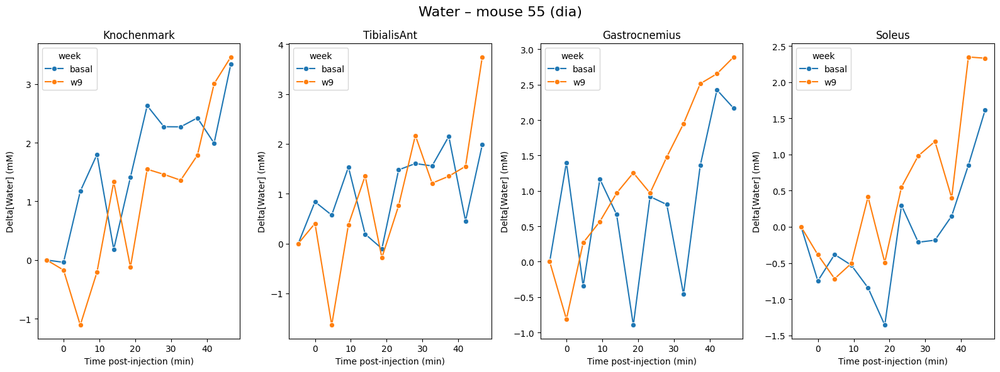

<Figure size 640x480 with 0 Axes>

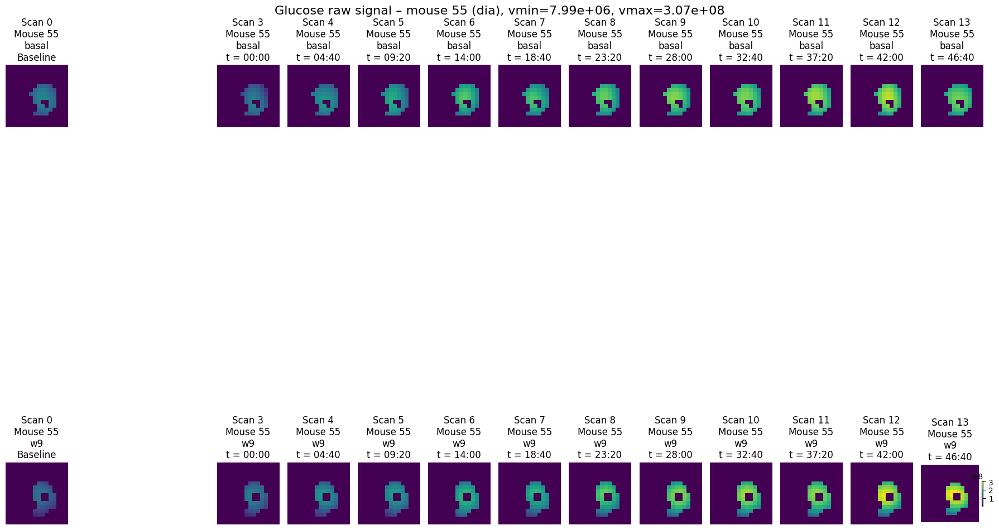

<Figure size 640x480 with 0 Axes>

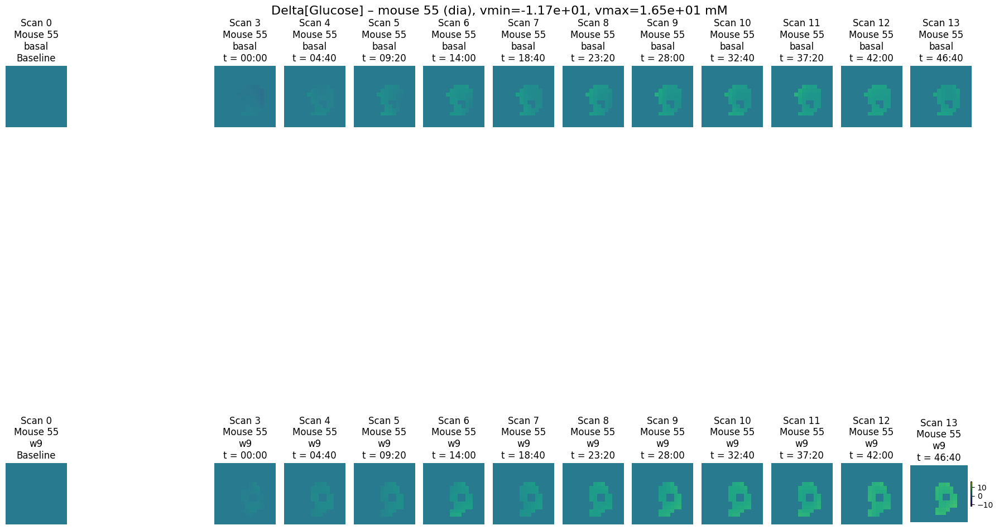

<Figure size 640x480 with 0 Axes>

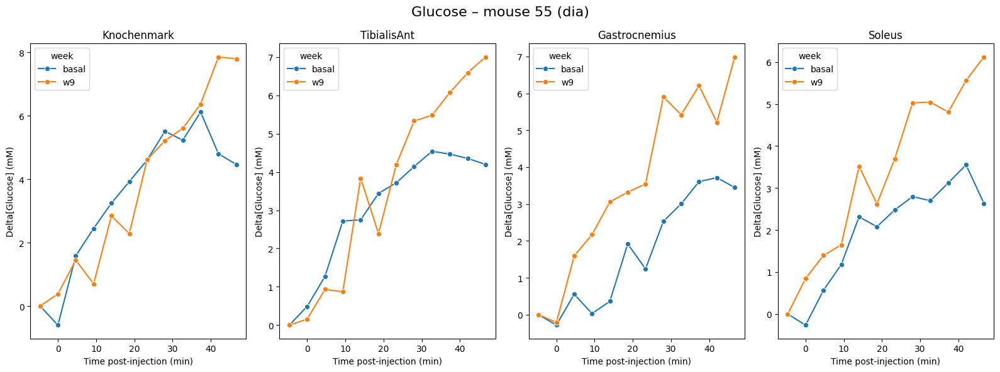

<Figure size 640x480 with 0 Axes>

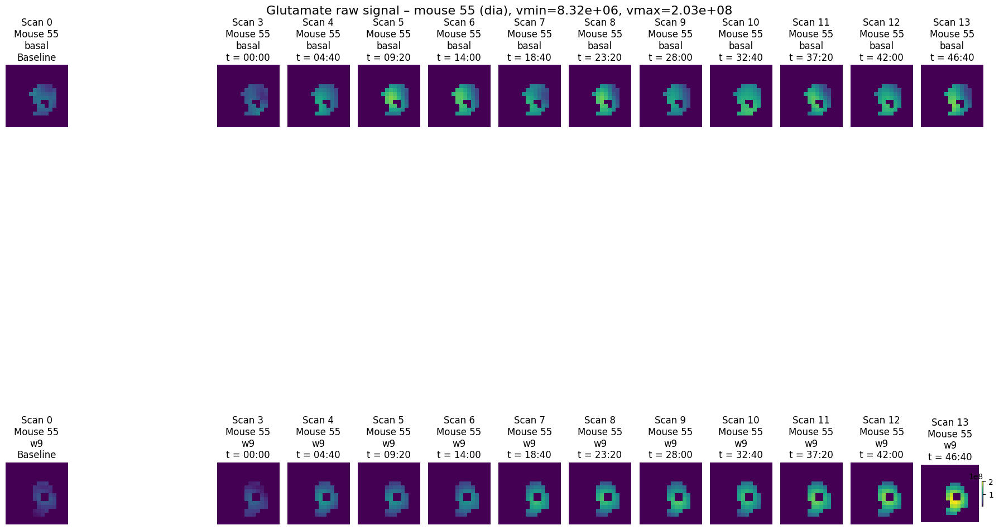

<Figure size 640x480 with 0 Axes>

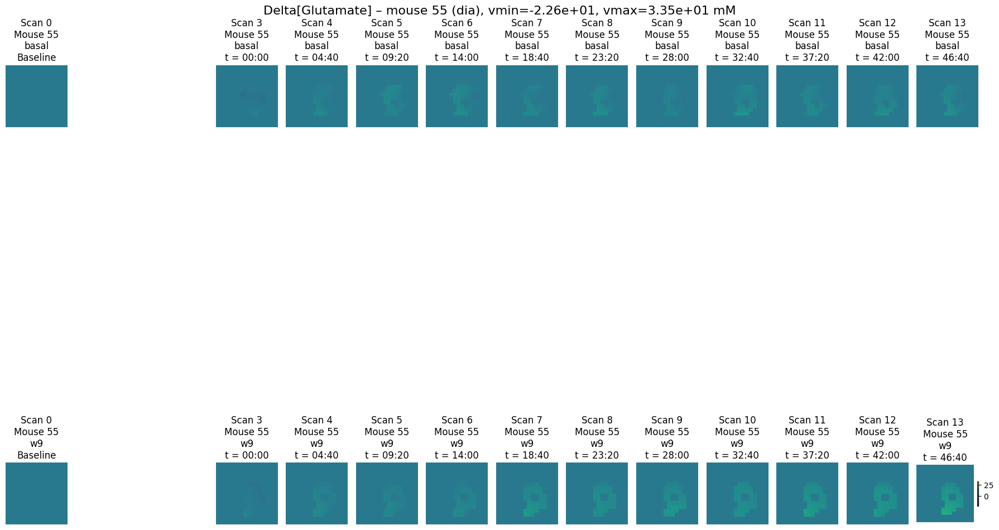

<Figure size 640x480 with 0 Axes>

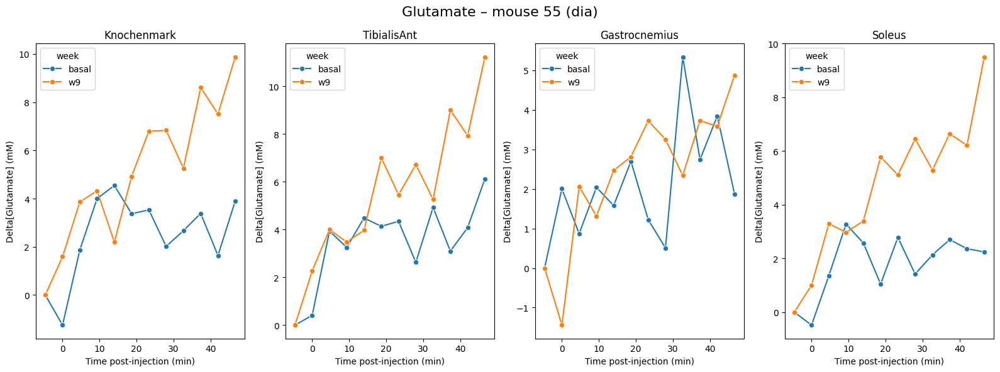

<Figure size 640x480 with 0 Axes>

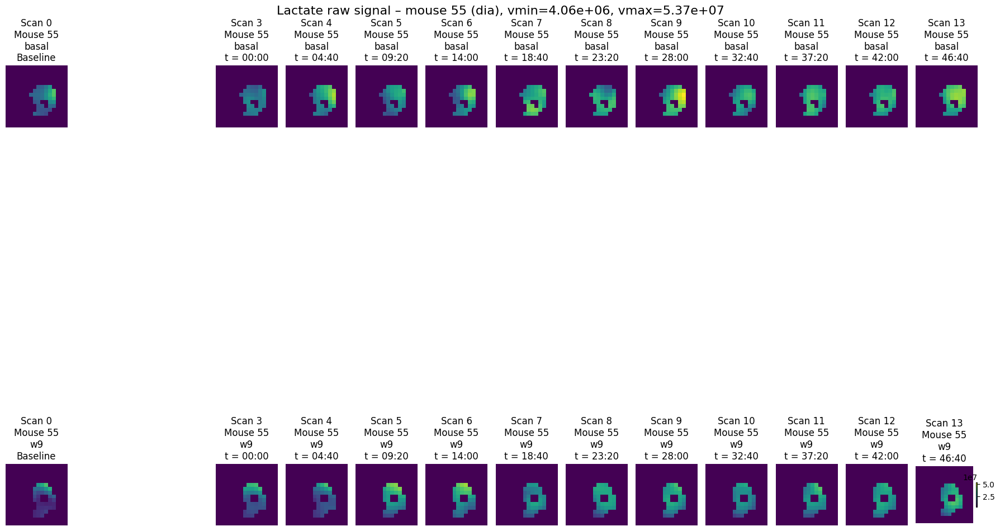

<Figure size 640x480 with 0 Axes>

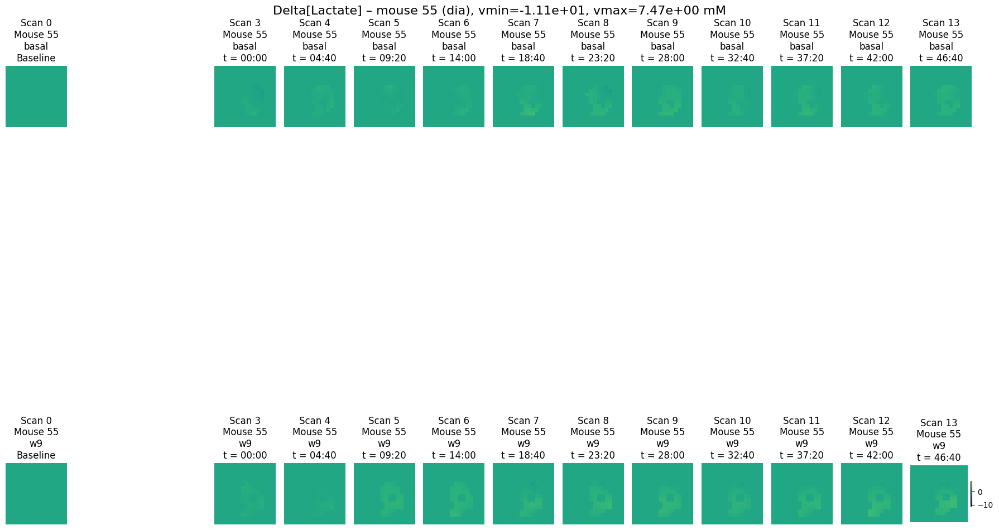

<Figure size 640x480 with 0 Axes>

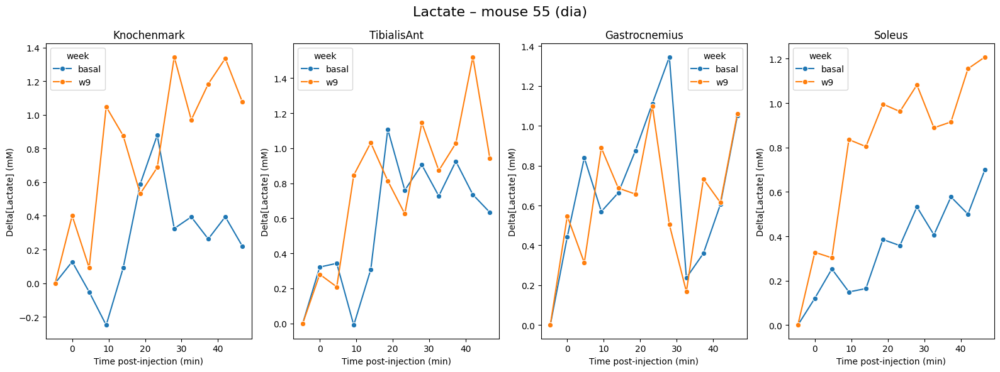

<Figure size 640x480 with 0 Axes>

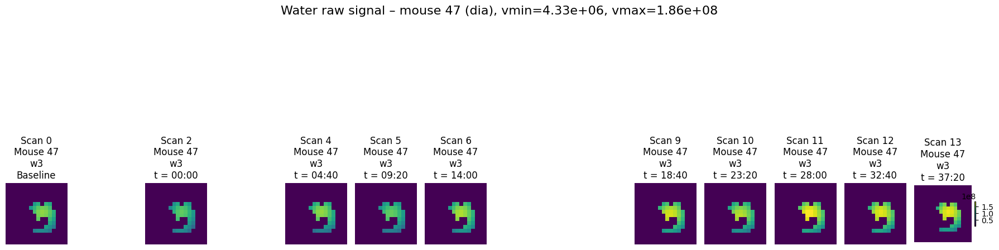

<Figure size 640x480 with 0 Axes>

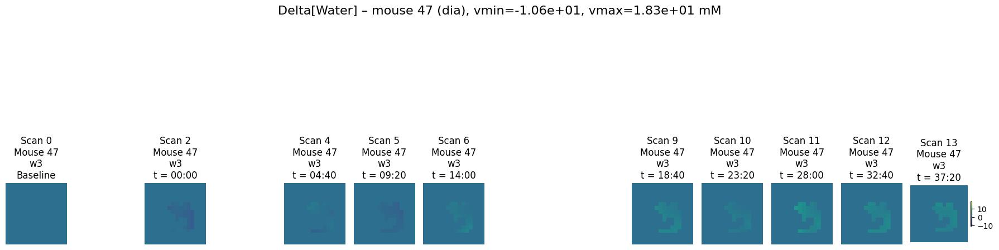

<Figure size 640x480 with 0 Axes>

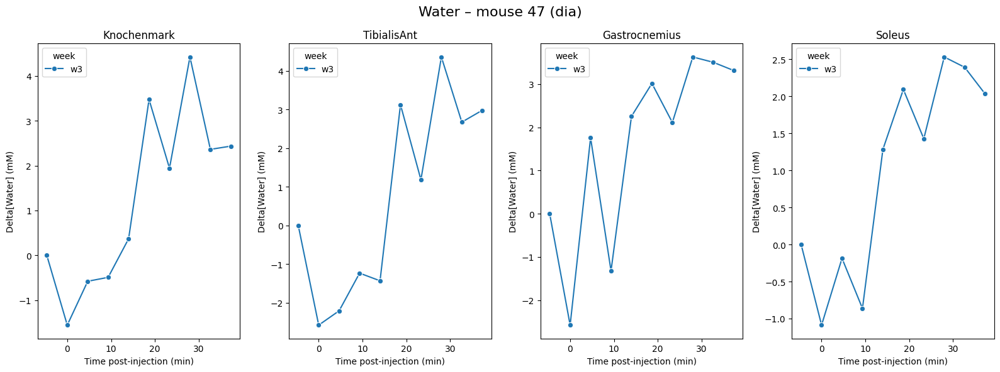

<Figure size 640x480 with 0 Axes>

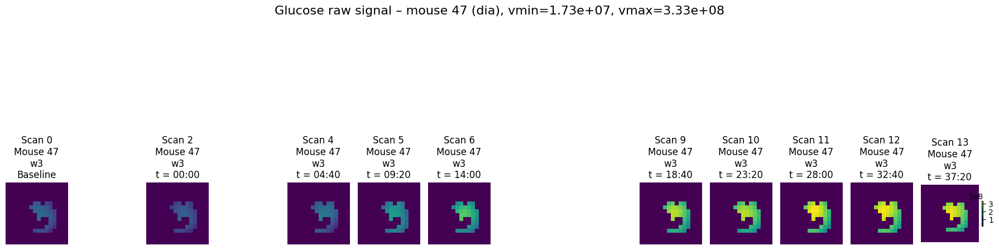

<Figure size 640x480 with 0 Axes>

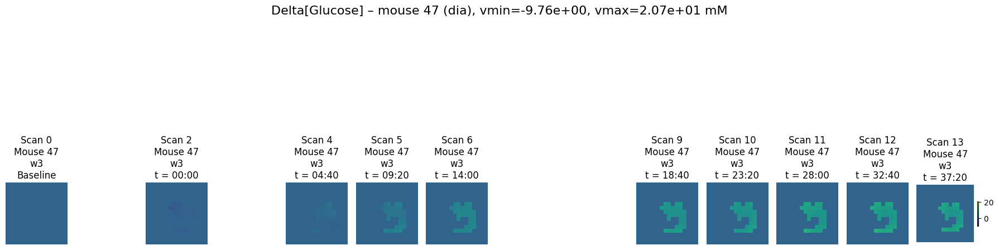

<Figure size 640x480 with 0 Axes>

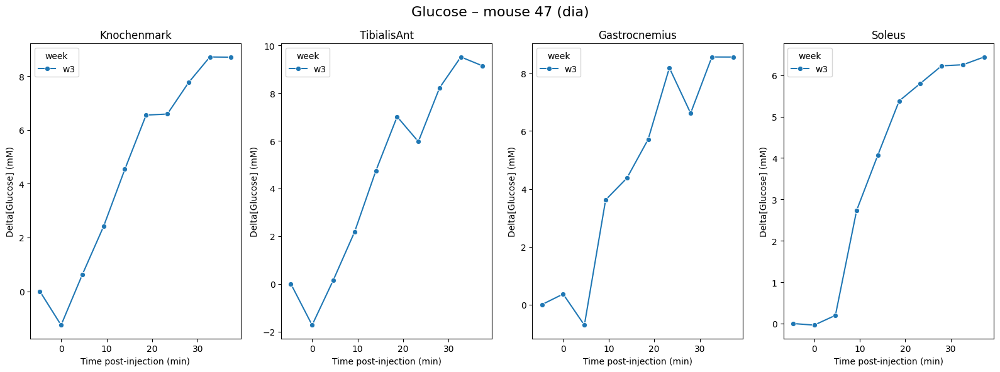

<Figure size 640x480 with 0 Axes>

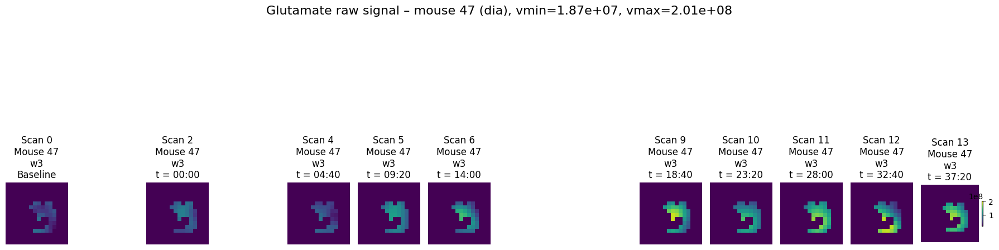

<Figure size 640x480 with 0 Axes>

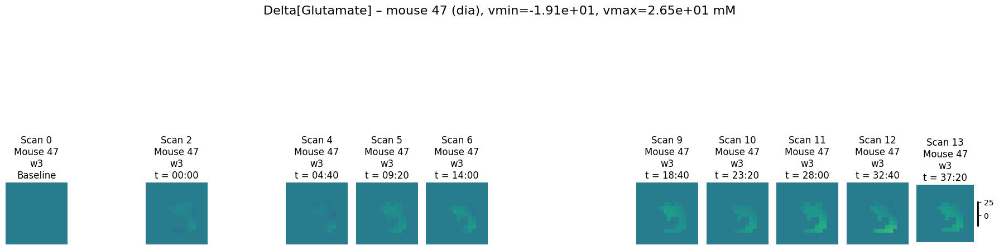

<Figure size 640x480 with 0 Axes>

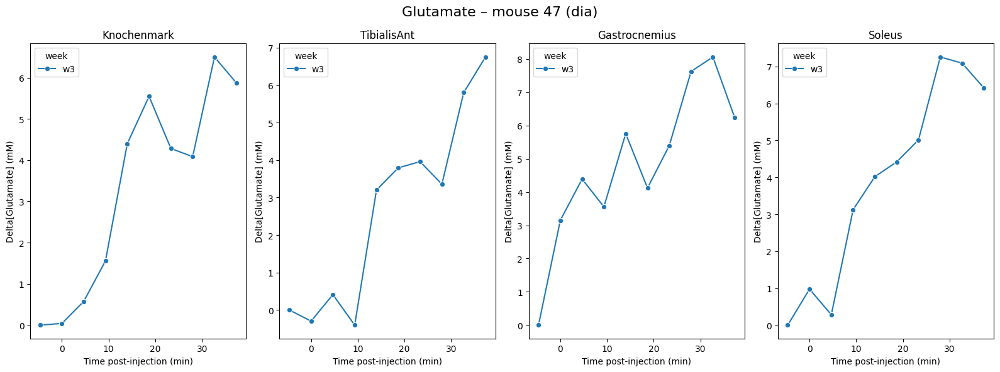

<Figure size 640x480 with 0 Axes>

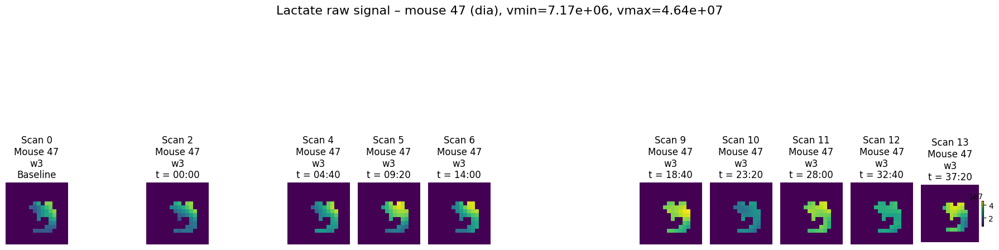

<Figure size 640x480 with 0 Axes>

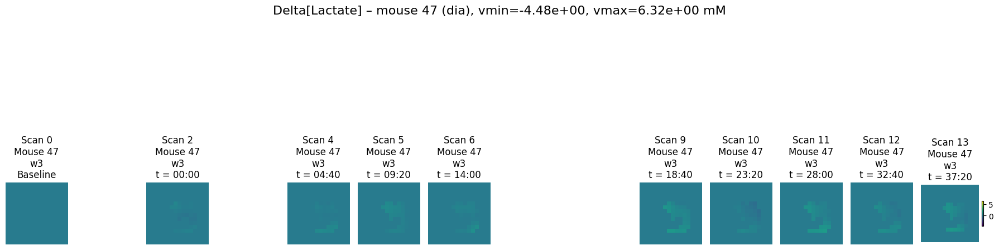

<Figure size 640x480 with 0 Axes>

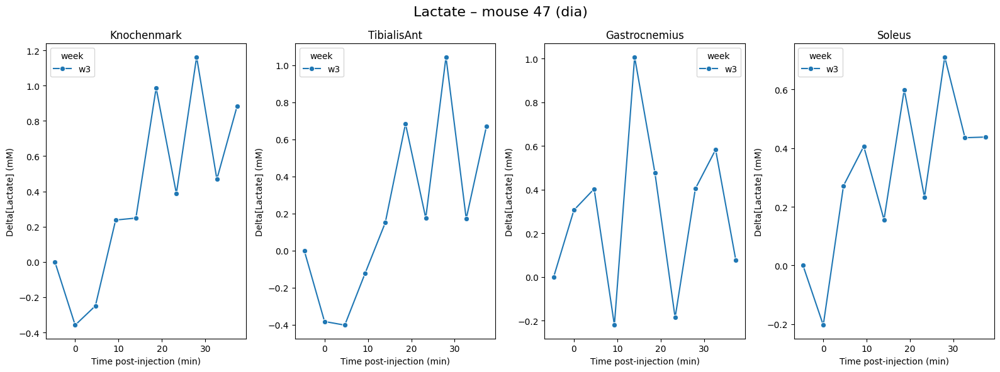

<Figure size 640x480 with 0 Axes>

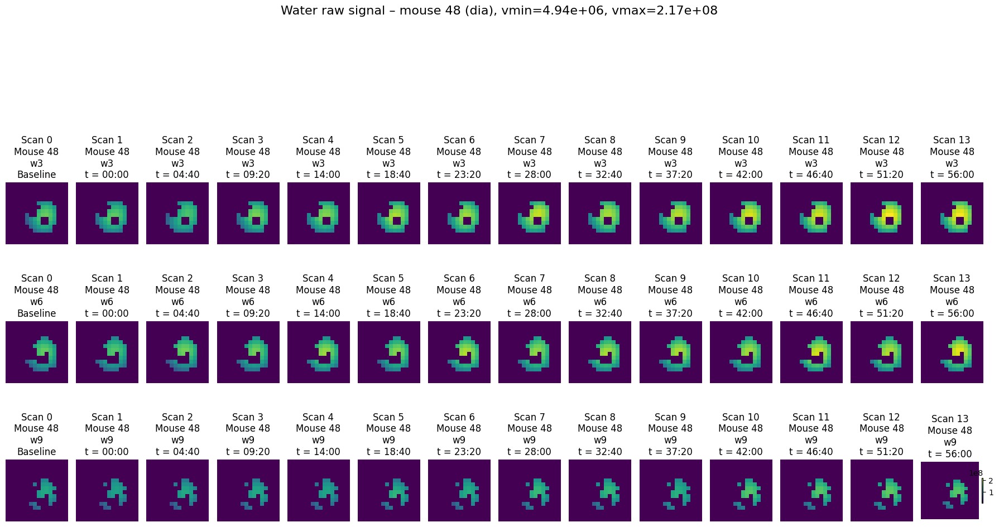

<Figure size 640x480 with 0 Axes>

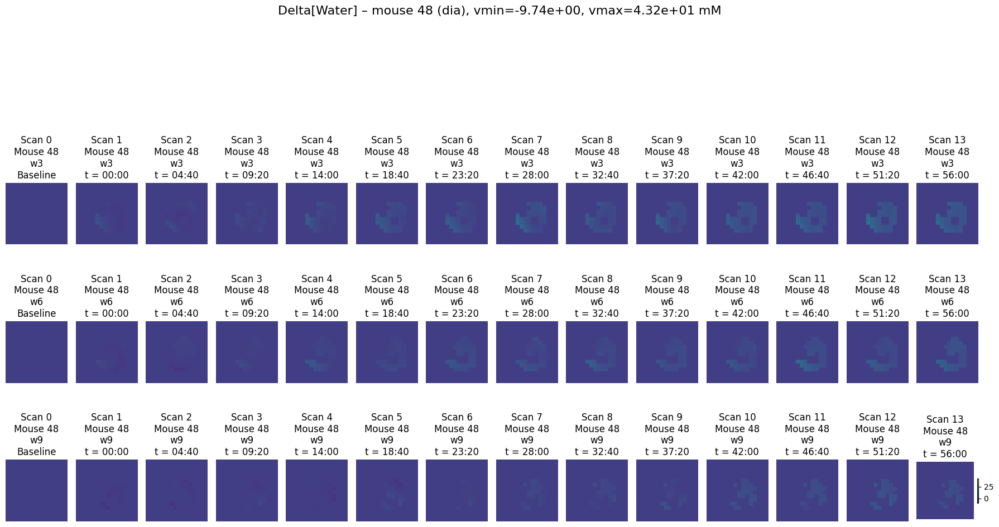

<Figure size 640x480 with 0 Axes>

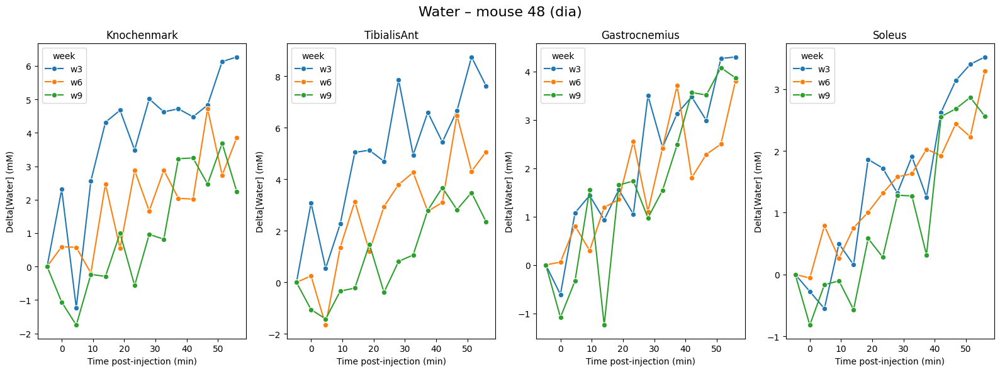

<Figure size 640x480 with 0 Axes>

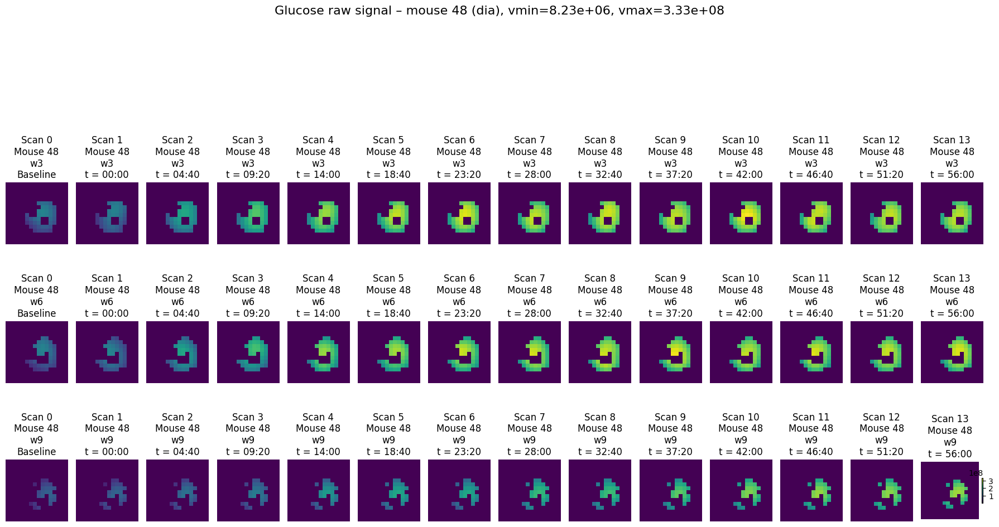

<Figure size 640x480 with 0 Axes>

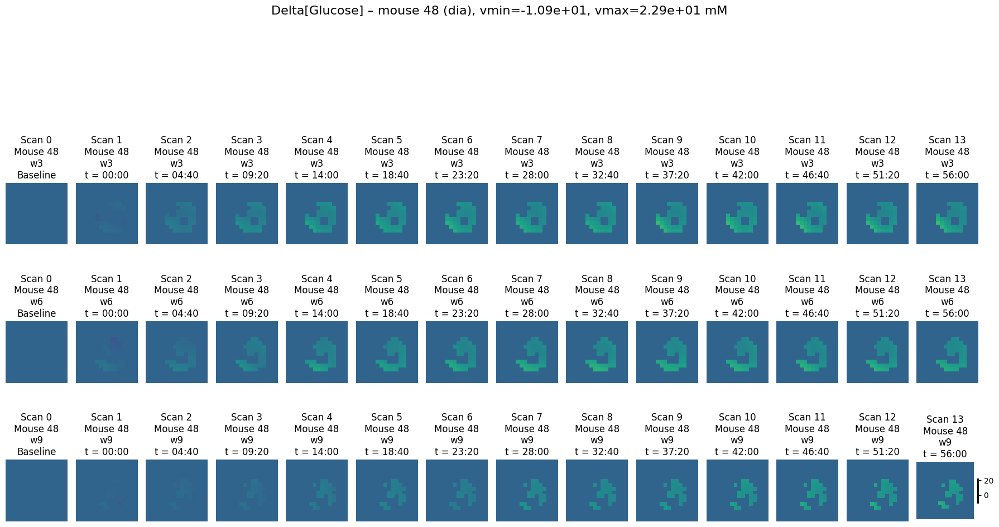

<Figure size 640x480 with 0 Axes>

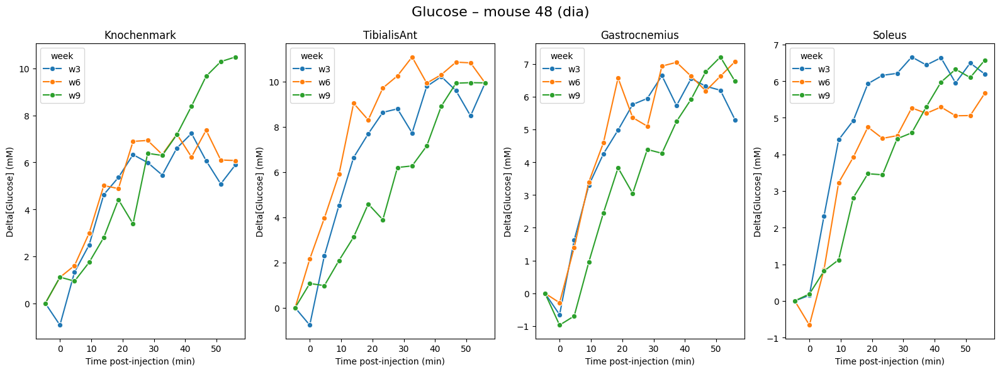

<Figure size 640x480 with 0 Axes>

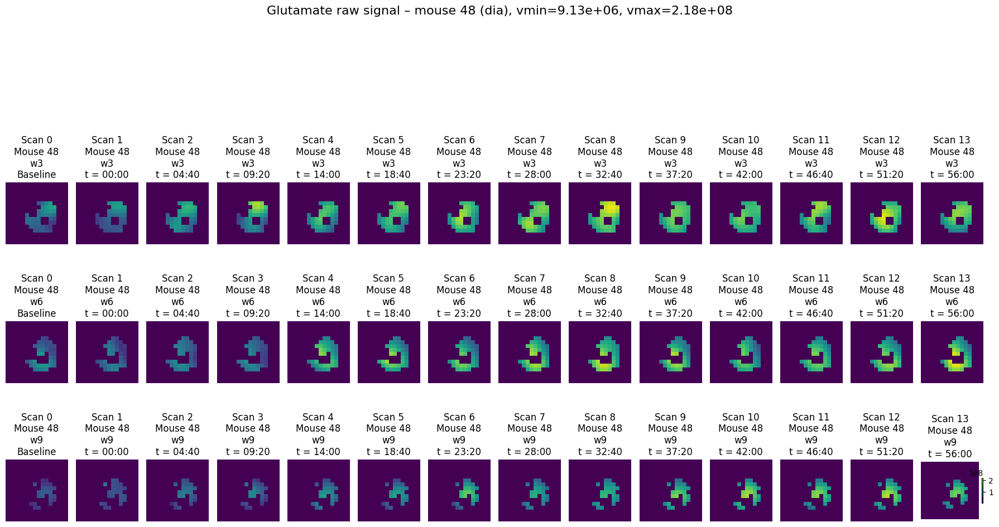

<Figure size 640x480 with 0 Axes>

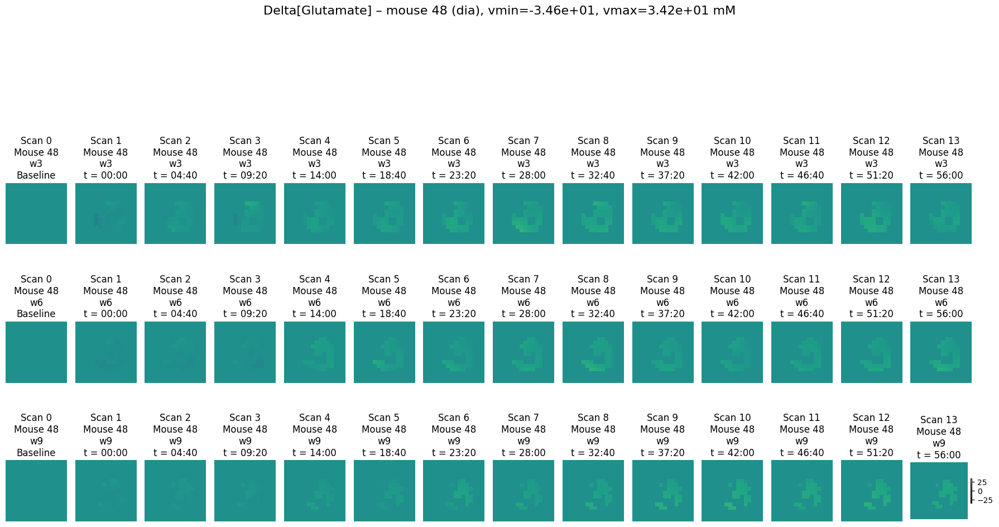

<Figure size 640x480 with 0 Axes>

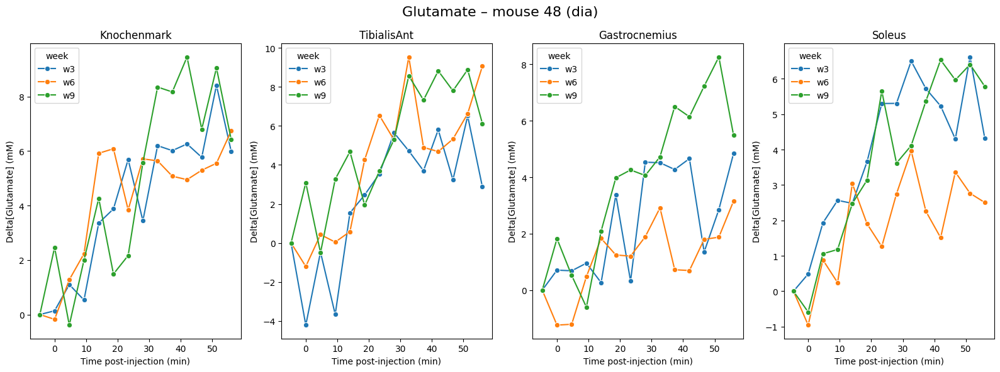

<Figure size 640x480 with 0 Axes>

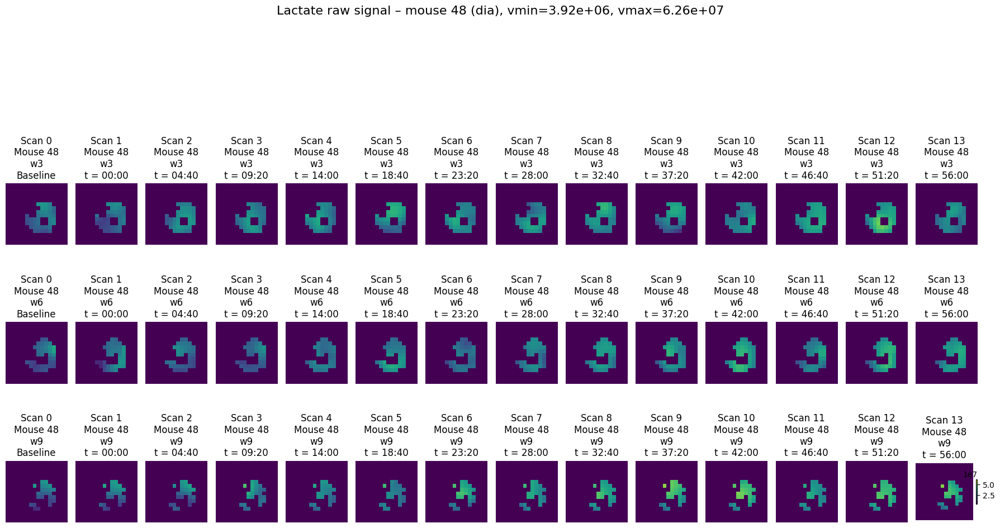

<Figure size 640x480 with 0 Axes>

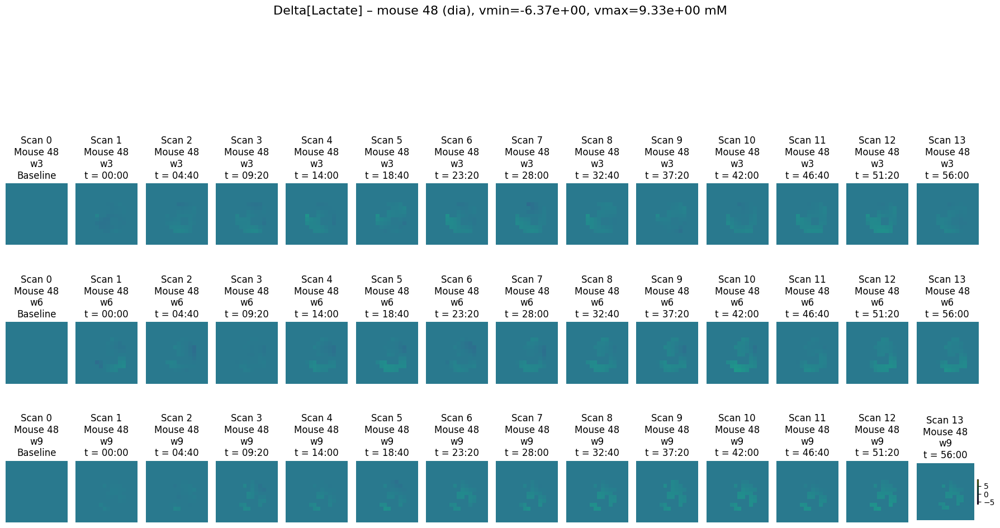

<Figure size 640x480 with 0 Axes>

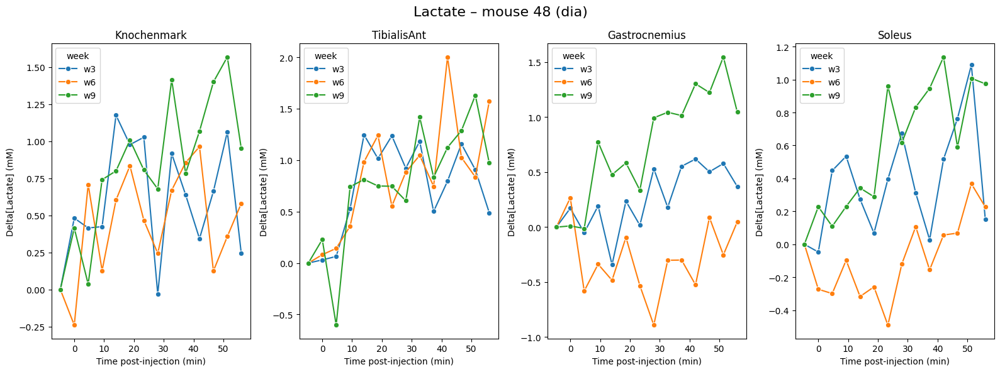

<Figure size 640x480 with 0 Axes>

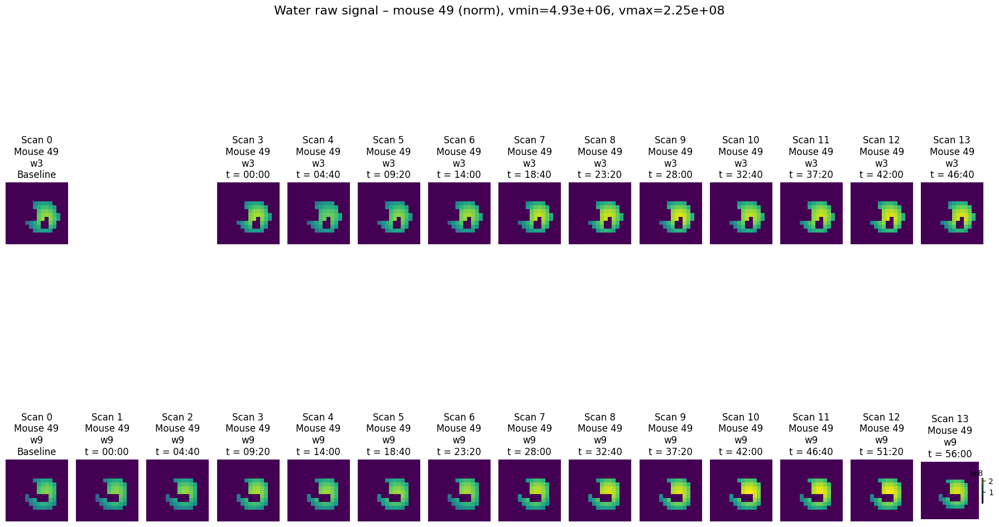

<Figure size 640x480 with 0 Axes>

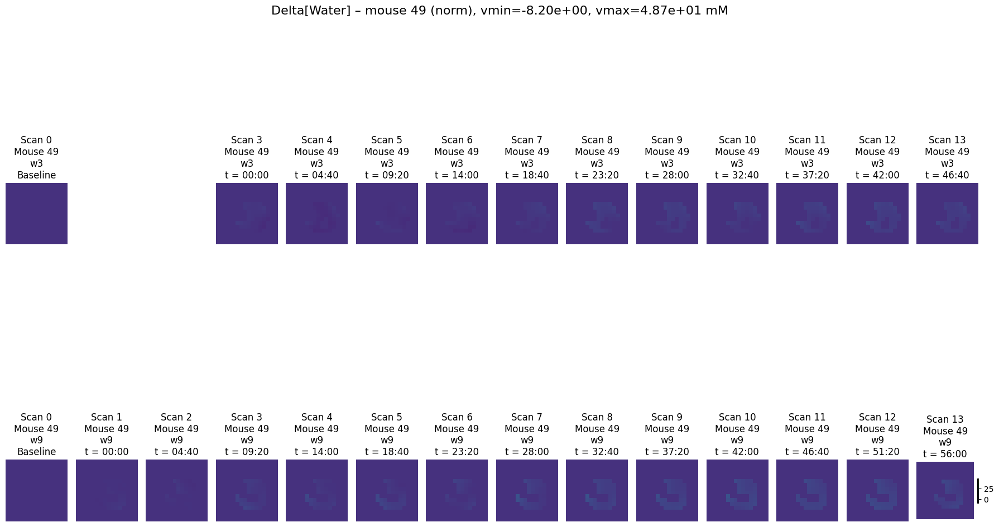

<Figure size 640x480 with 0 Axes>

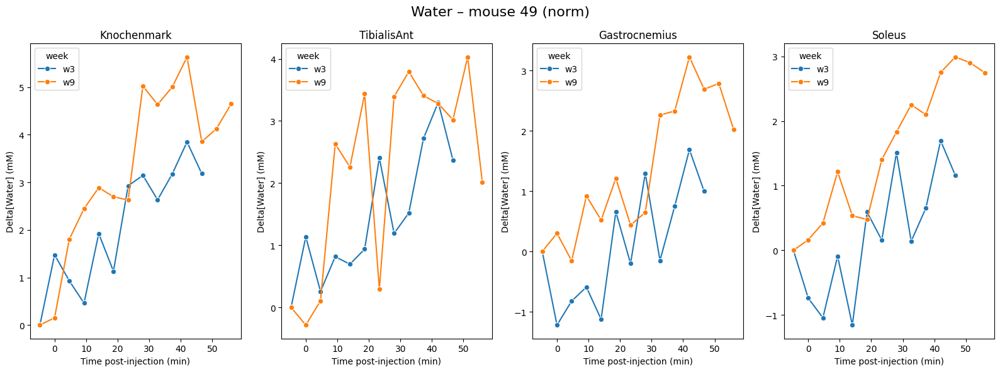

<Figure size 640x480 with 0 Axes>

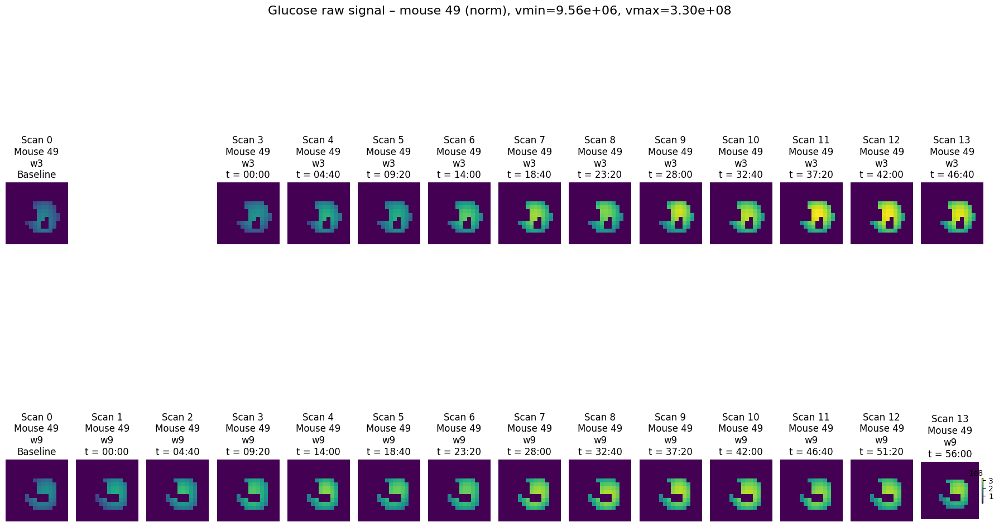

<Figure size 640x480 with 0 Axes>

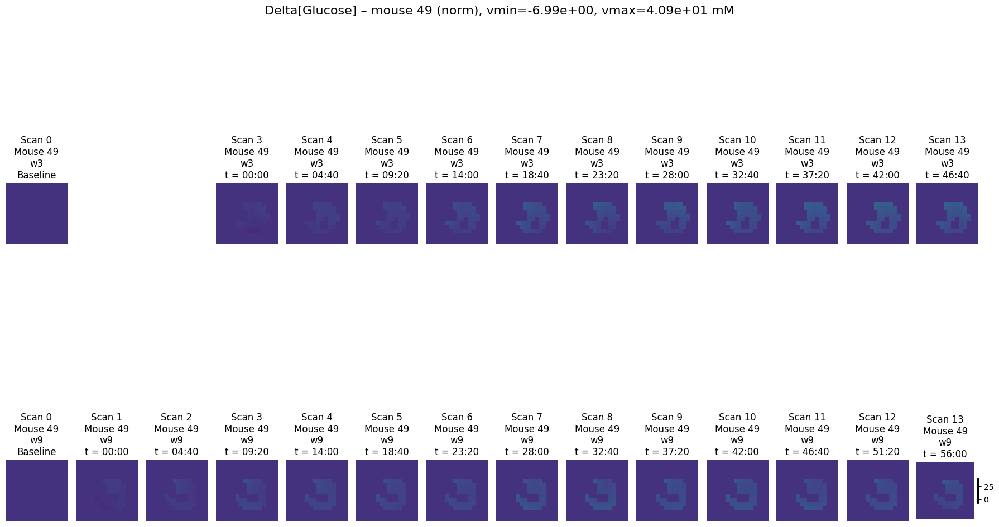

<Figure size 640x480 with 0 Axes>

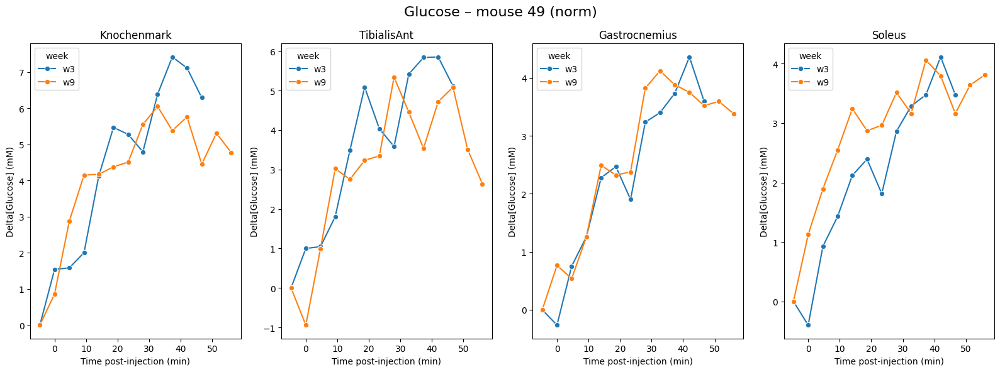

<Figure size 640x480 with 0 Axes>

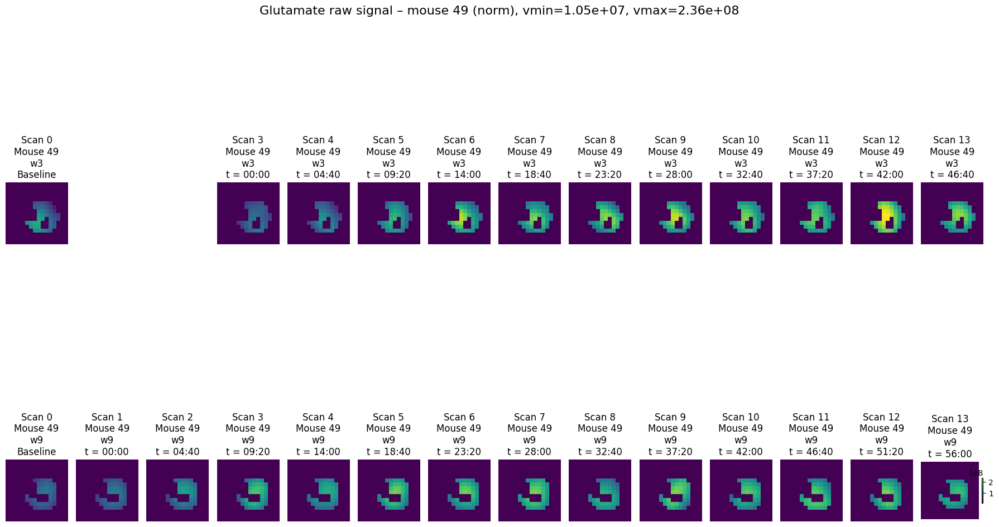

<Figure size 640x480 with 0 Axes>

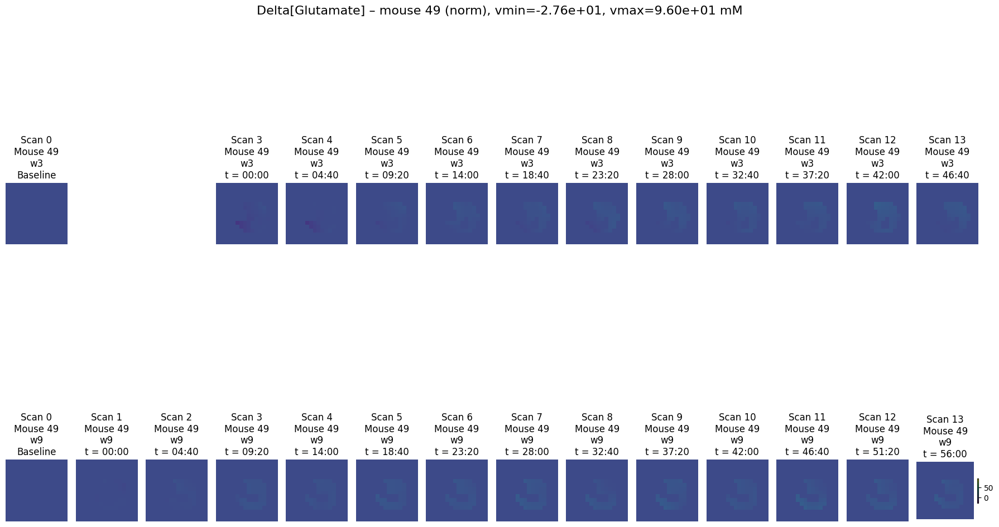

<Figure size 640x480 with 0 Axes>

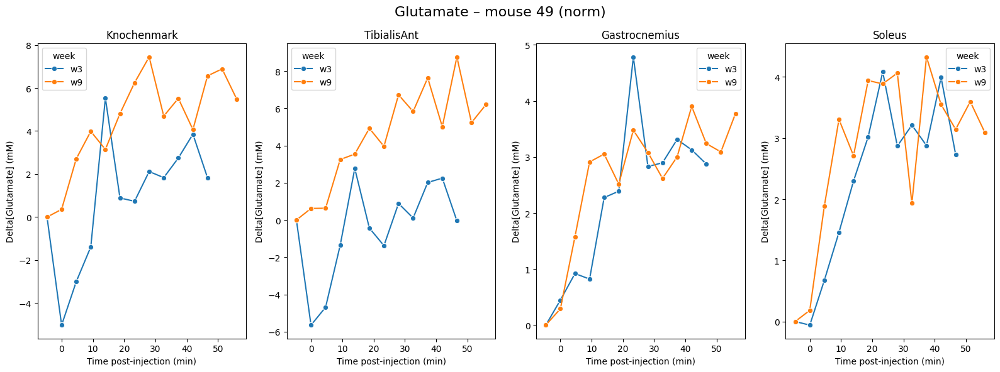

<Figure size 640x480 with 0 Axes>

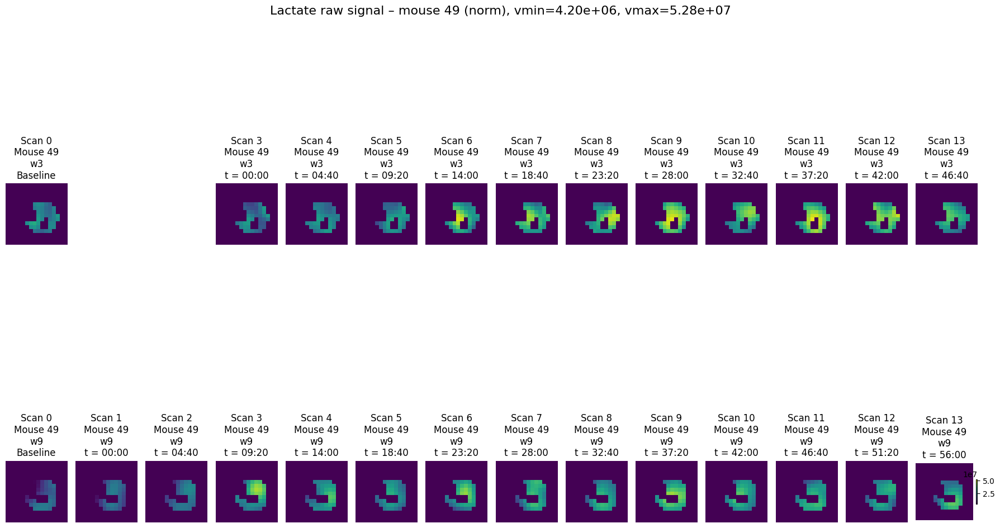

<Figure size 640x480 with 0 Axes>

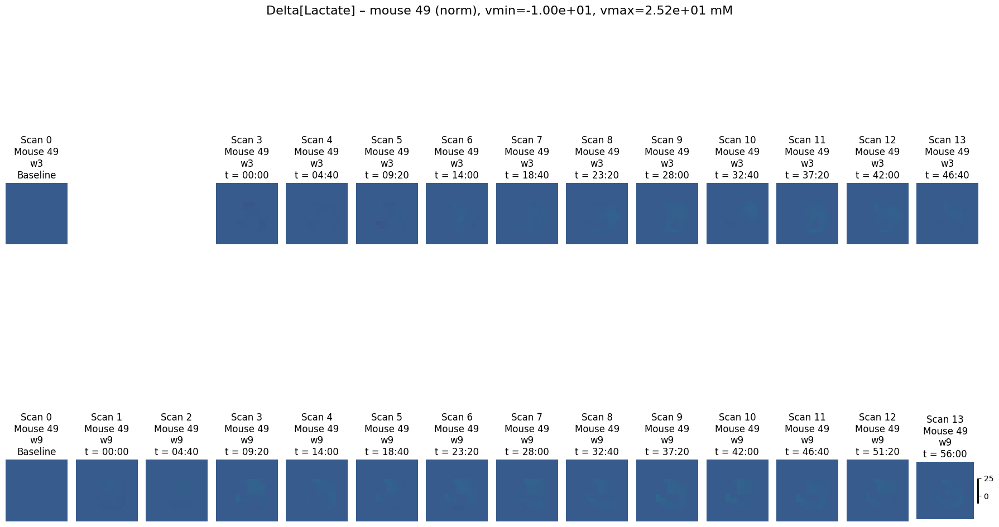

<Figure size 640x480 with 0 Axes>

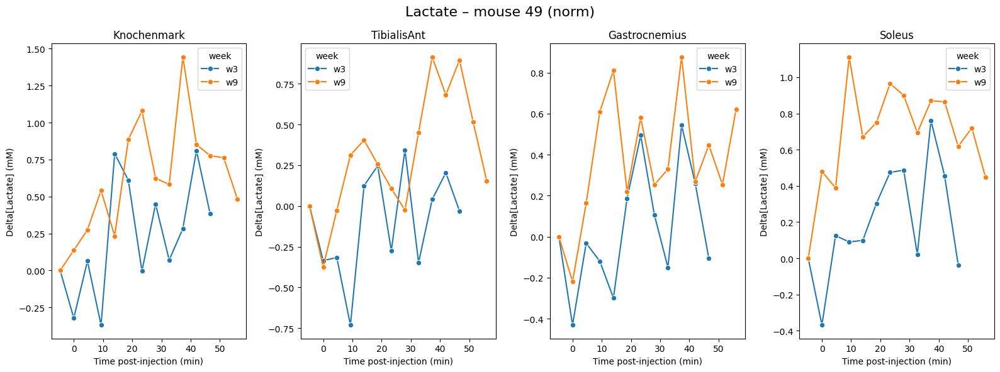

<Figure size 640x480 with 0 Axes>

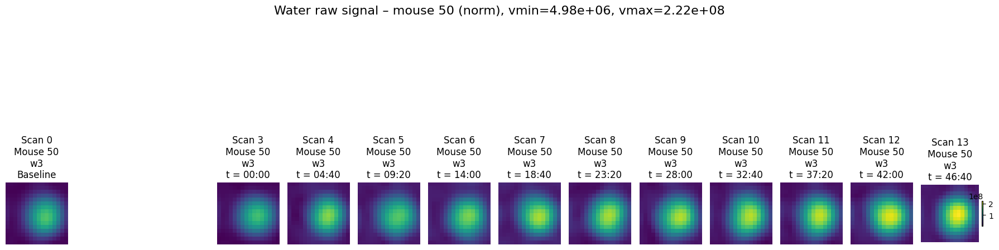

<Figure size 640x480 with 0 Axes>

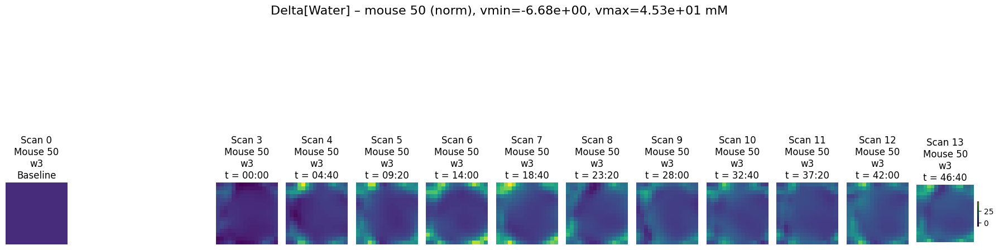

<Figure size 640x480 with 0 Axes>

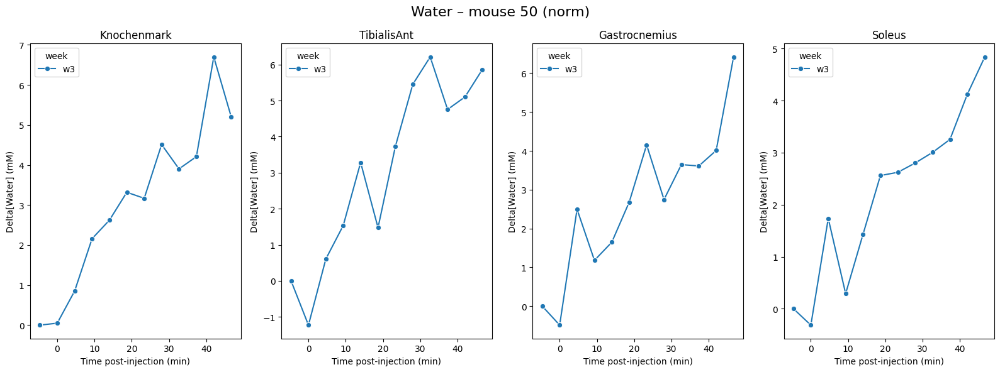

<Figure size 640x480 with 0 Axes>

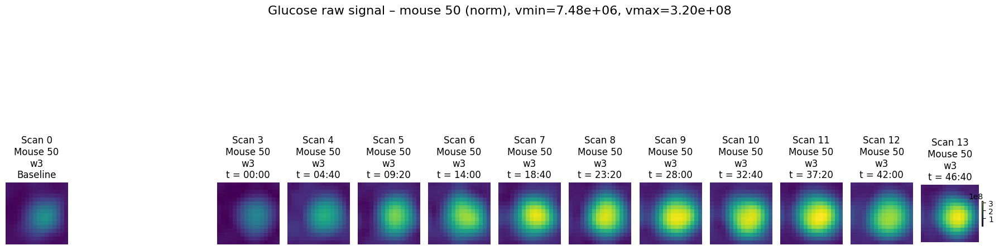

<Figure size 640x480 with 0 Axes>

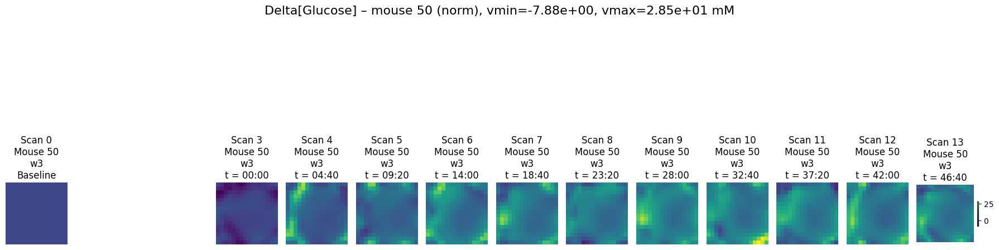

<Figure size 640x480 with 0 Axes>

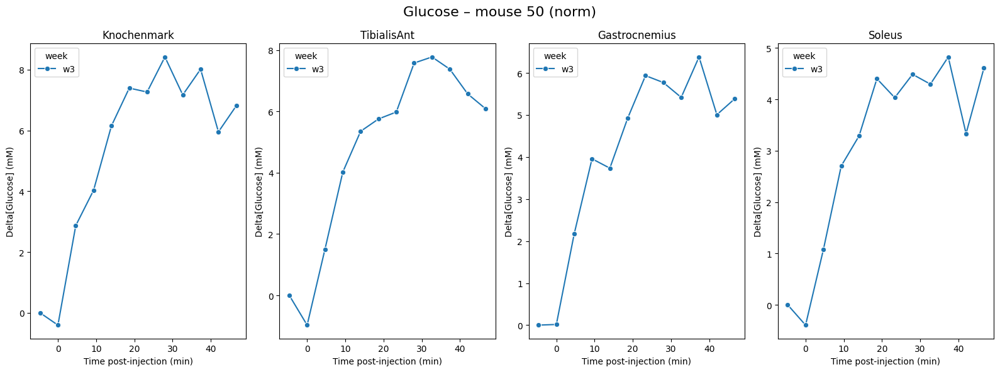

<Figure size 640x480 with 0 Axes>

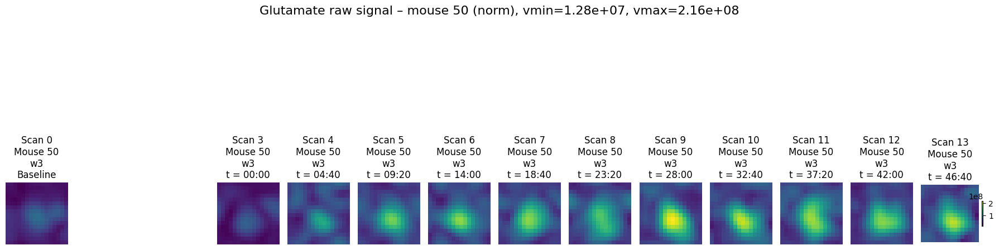

<Figure size 640x480 with 0 Axes>

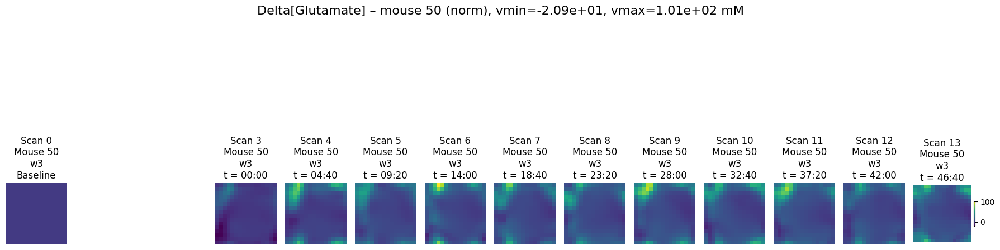

<Figure size 640x480 with 0 Axes>

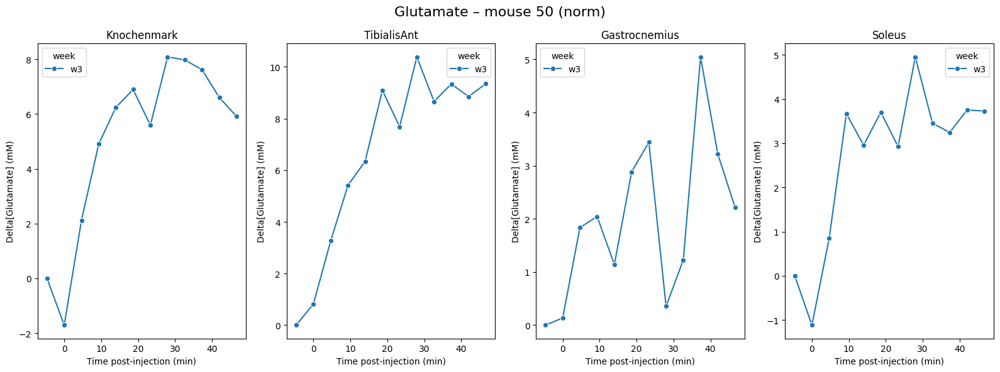

<Figure size 640x480 with 0 Axes>

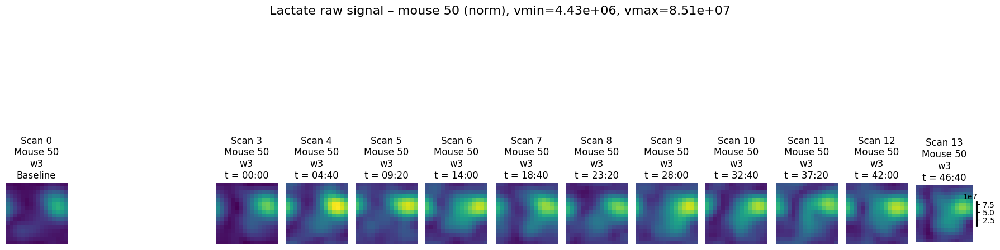

<Figure size 640x480 with 0 Axes>

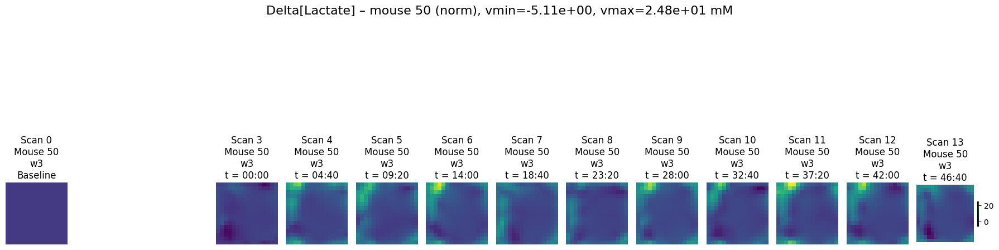

<Figure size 640x480 with 0 Axes>

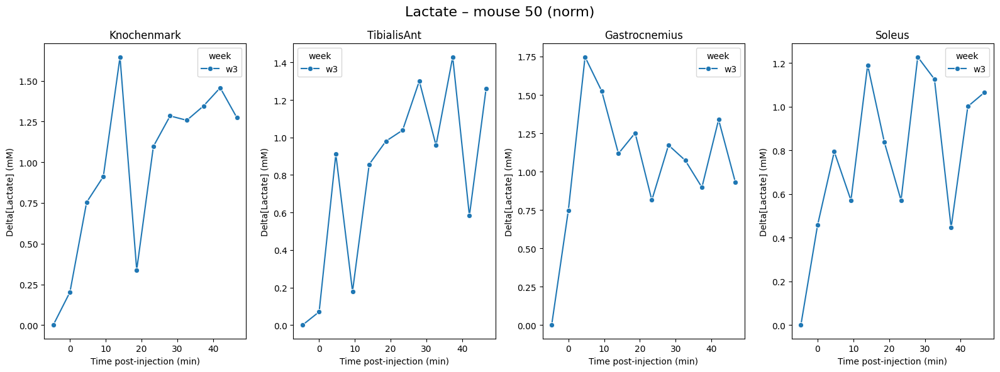

<Figure size 640x480 with 0 Axes>

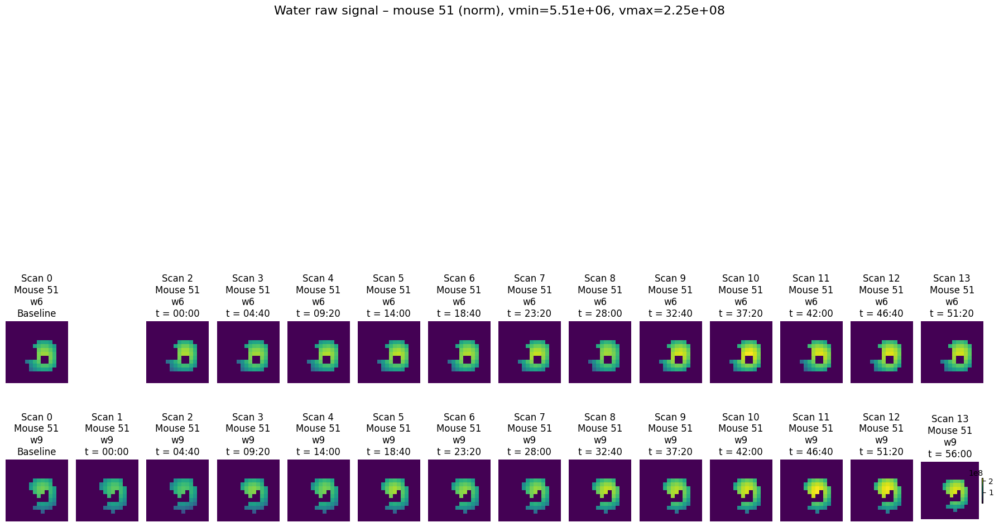

<Figure size 640x480 with 0 Axes>

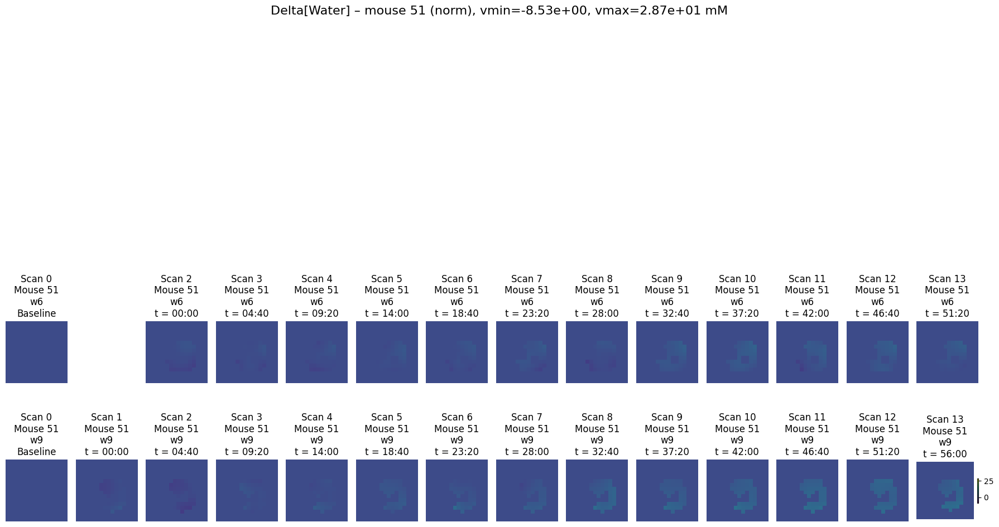

<Figure size 640x480 with 0 Axes>

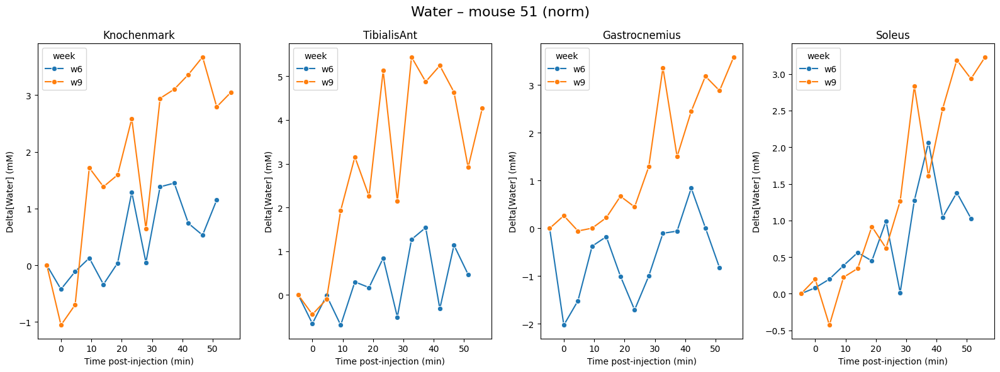

<Figure size 640x480 with 0 Axes>

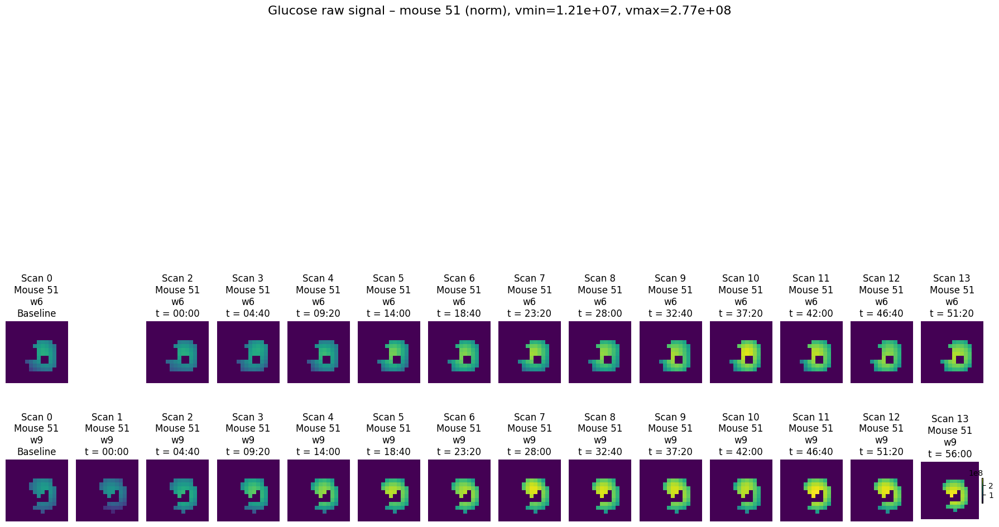

<Figure size 640x480 with 0 Axes>

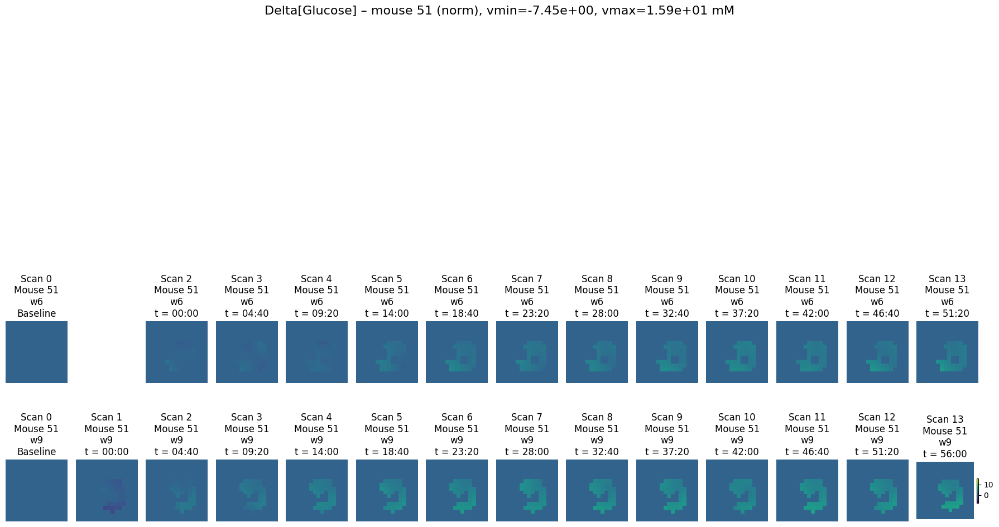

<Figure size 640x480 with 0 Axes>

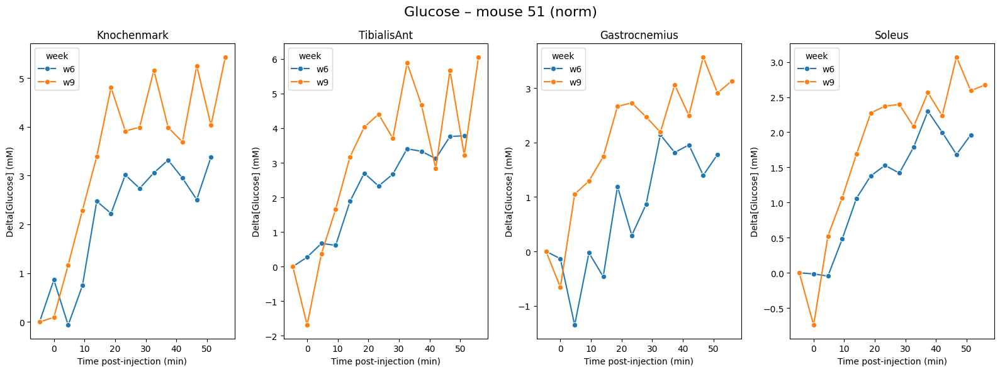

<Figure size 640x480 with 0 Axes>

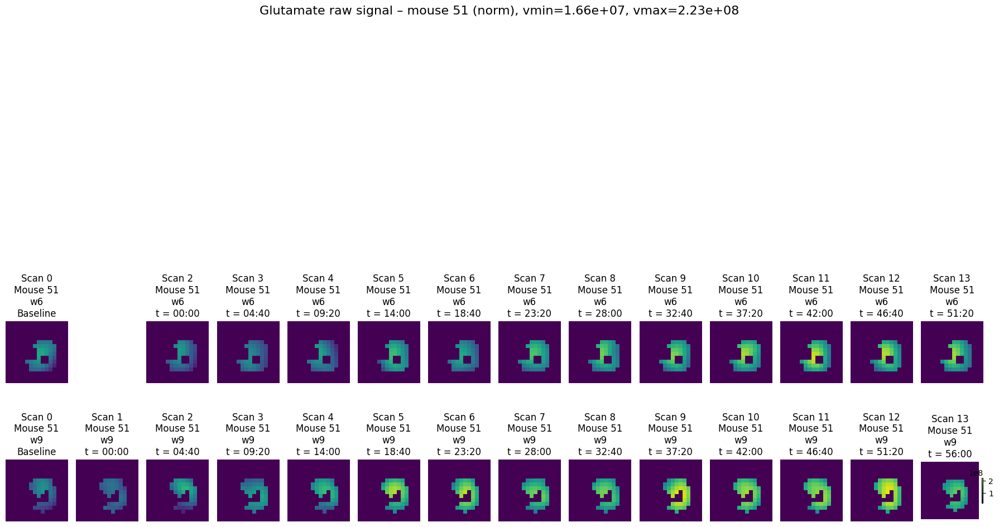

<Figure size 640x480 with 0 Axes>

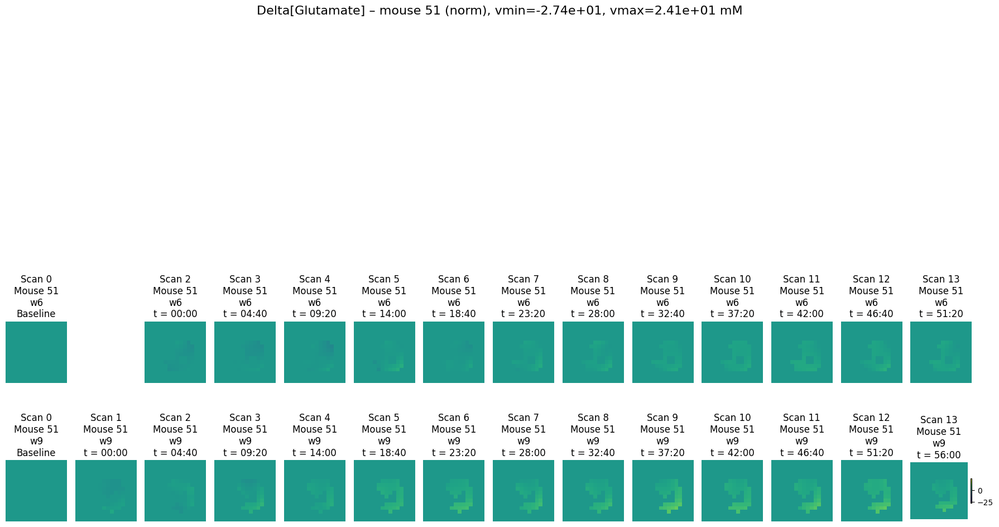

<Figure size 640x480 with 0 Axes>

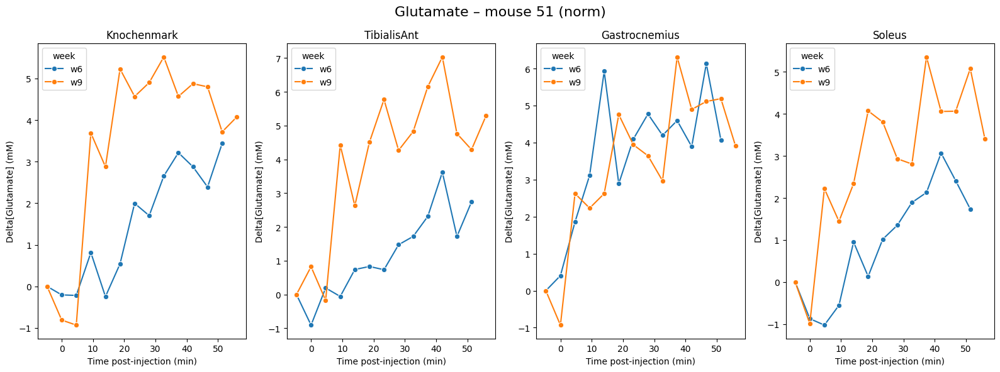

<Figure size 640x480 with 0 Axes>

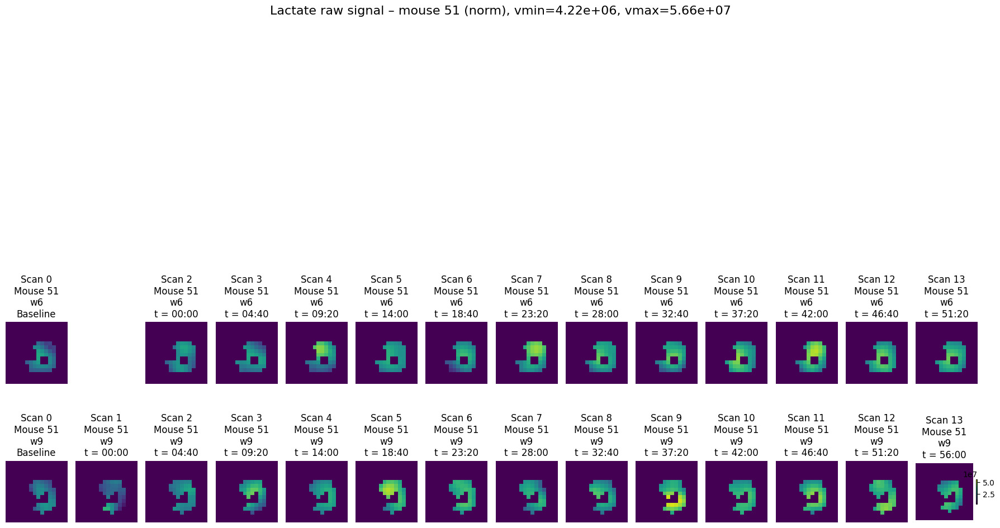

<Figure size 640x480 with 0 Axes>

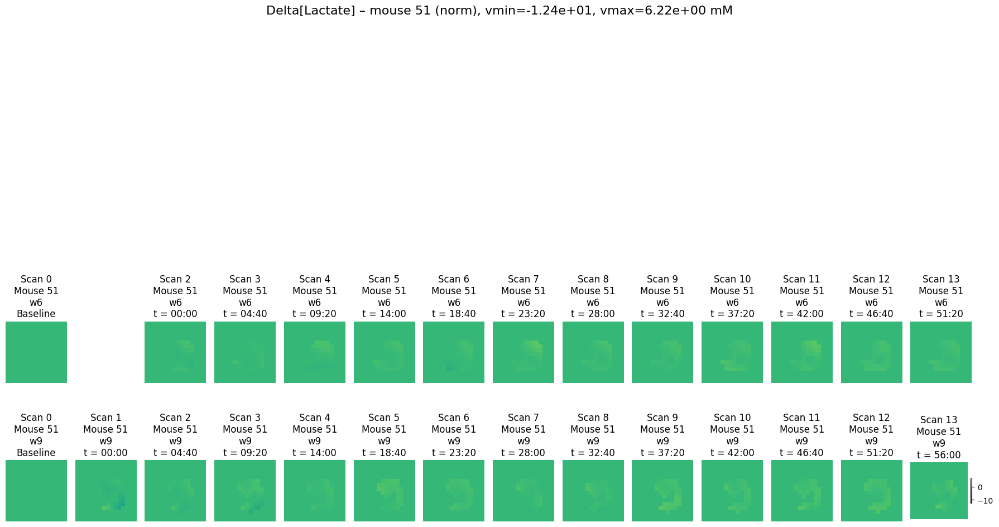

<Figure size 640x480 with 0 Axes>

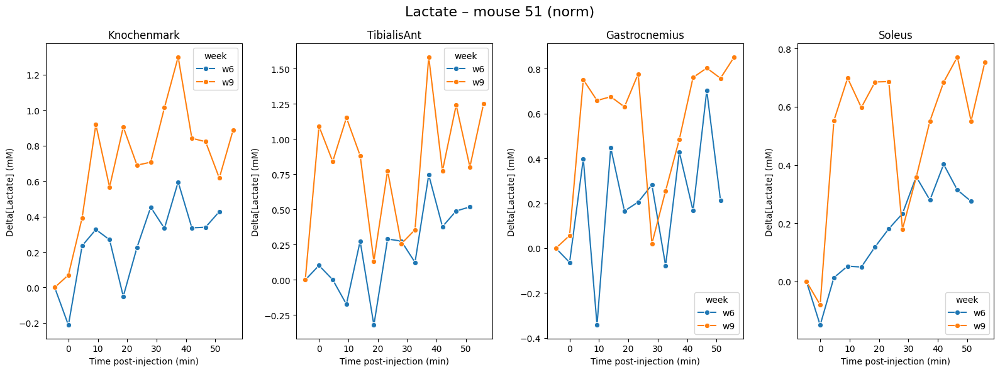

<Figure size 640x480 with 0 Axes>

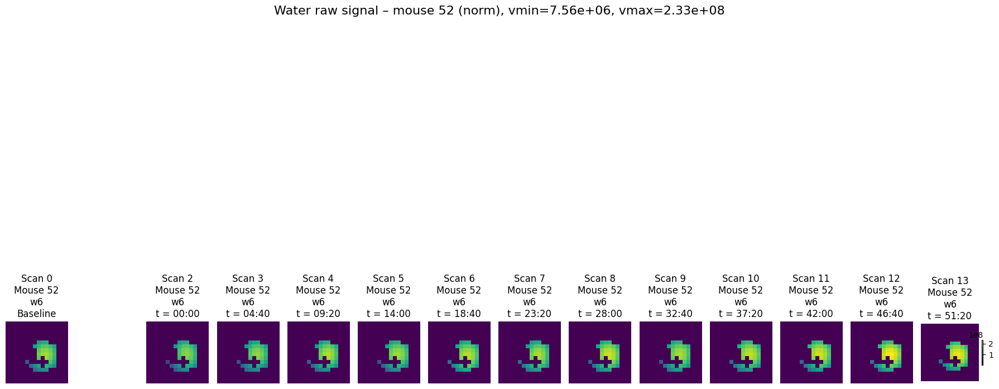

<Figure size 640x480 with 0 Axes>

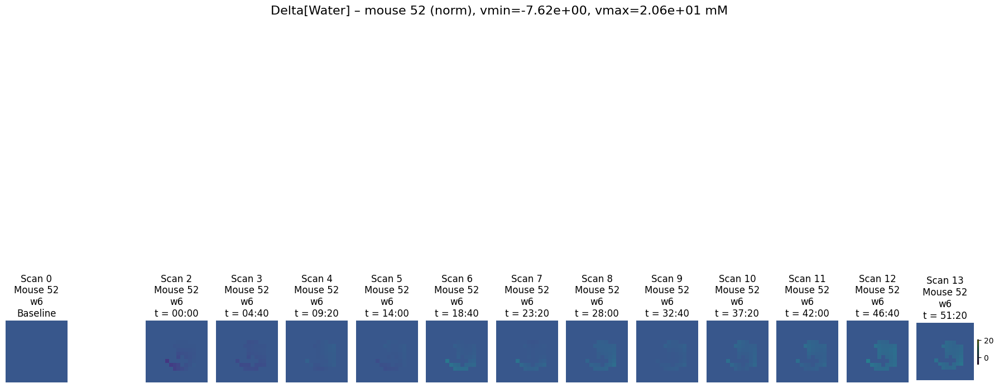

<Figure size 640x480 with 0 Axes>

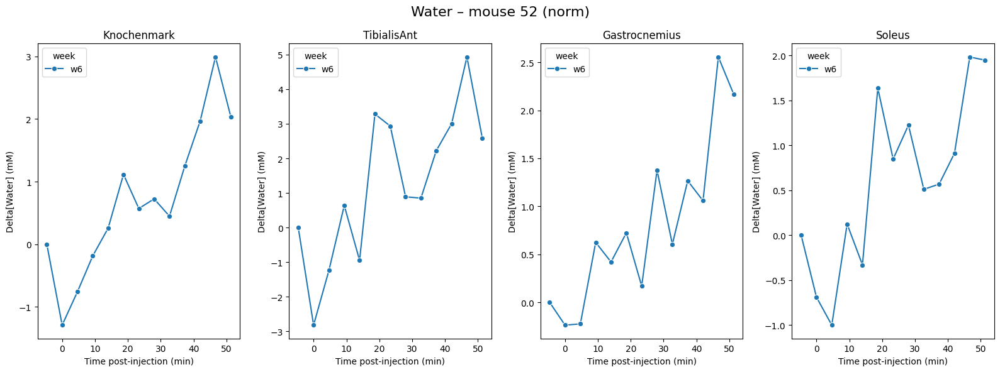

<Figure size 640x480 with 0 Axes>

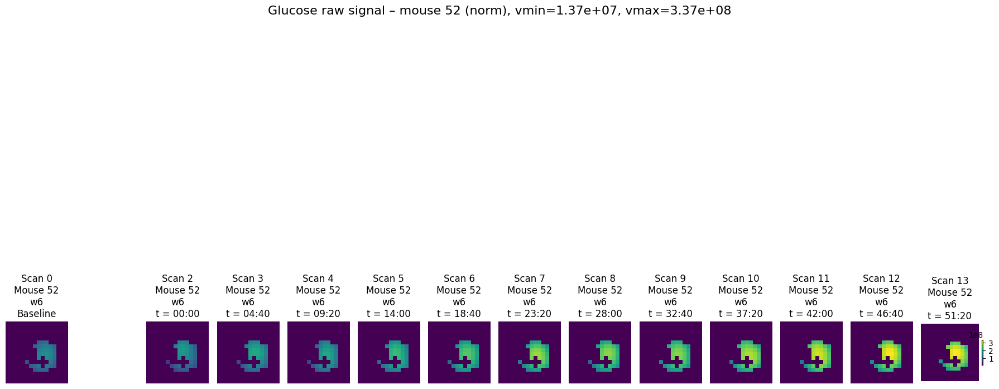

<Figure size 640x480 with 0 Axes>

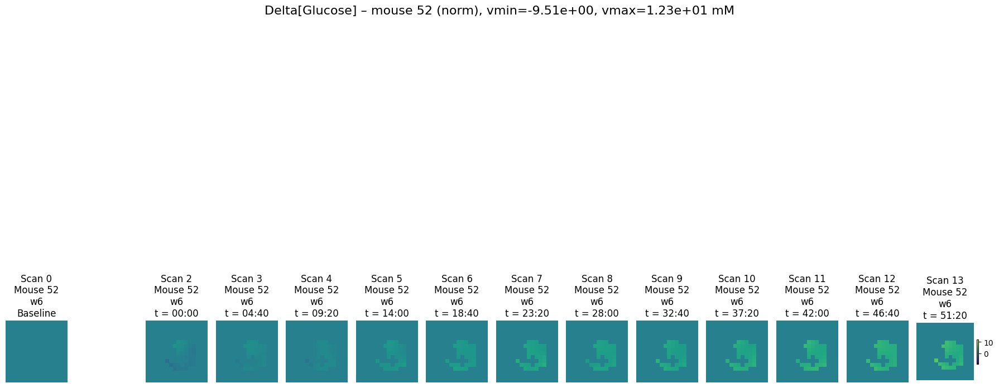

<Figure size 640x480 with 0 Axes>

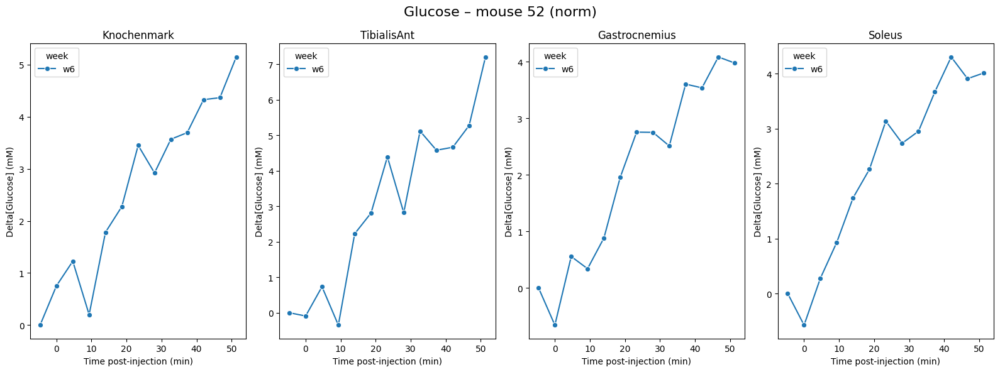

<Figure size 640x480 with 0 Axes>

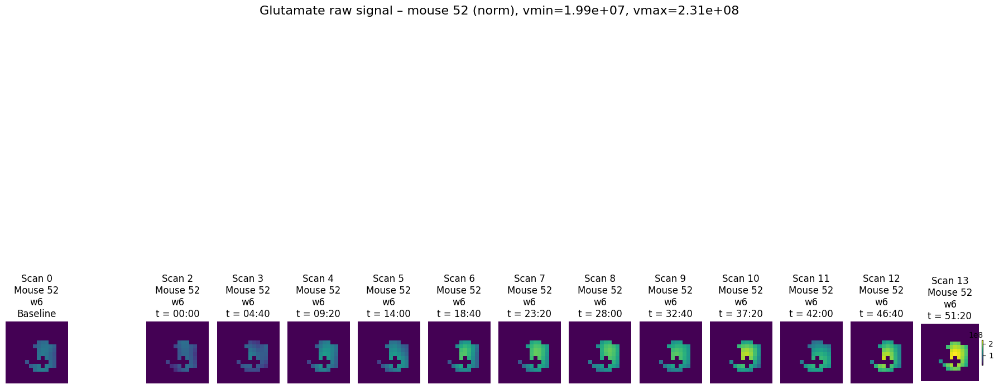

<Figure size 640x480 with 0 Axes>

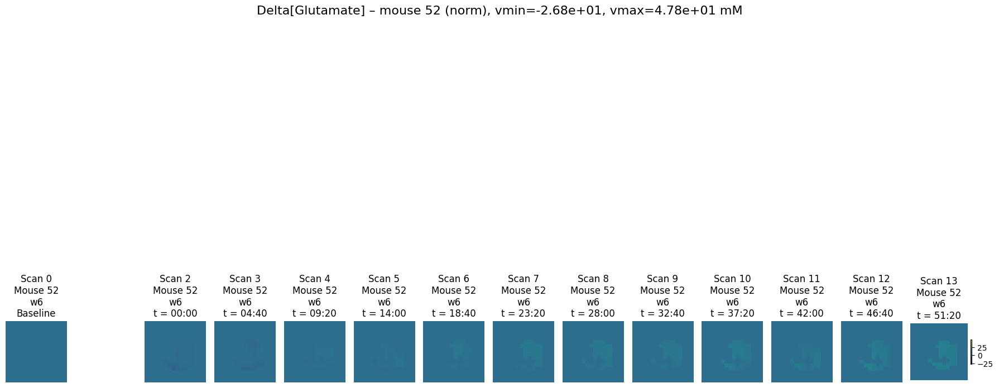

<Figure size 640x480 with 0 Axes>

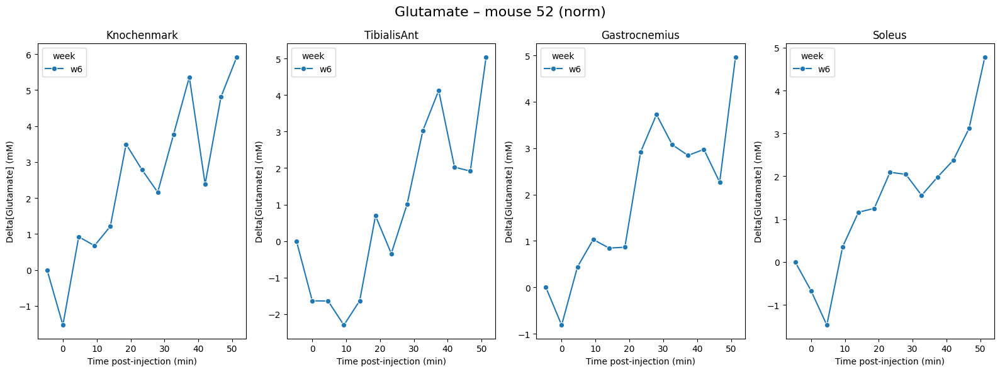

<Figure size 640x480 with 0 Axes>

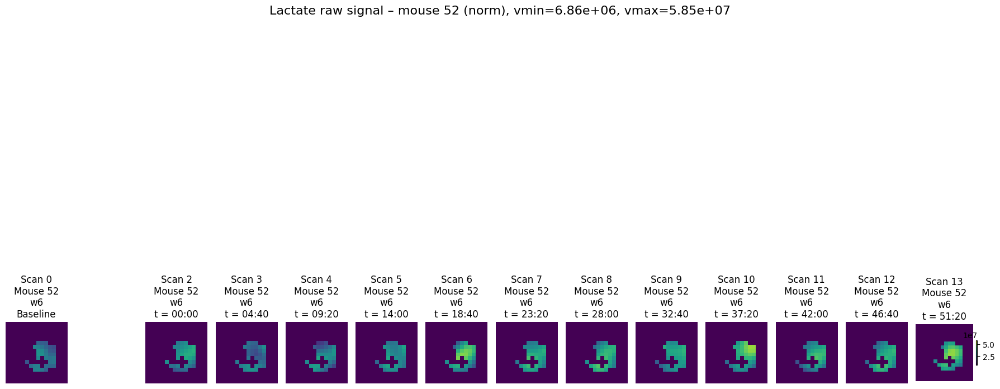

<Figure size 640x480 with 0 Axes>

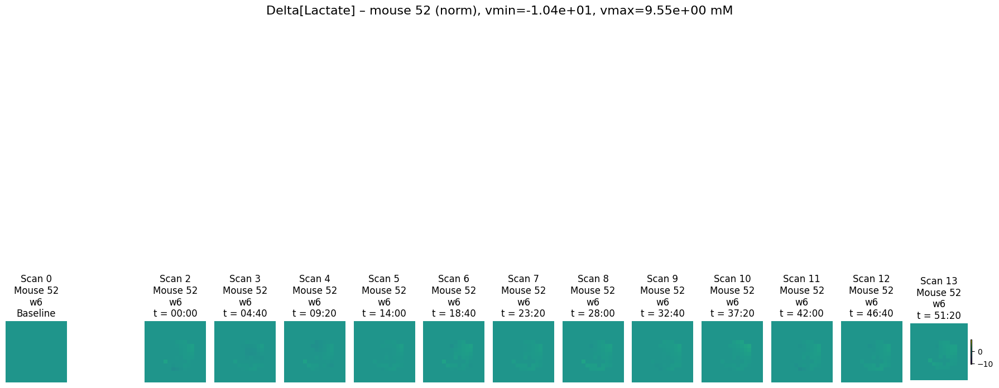

<Figure size 640x480 with 0 Axes>

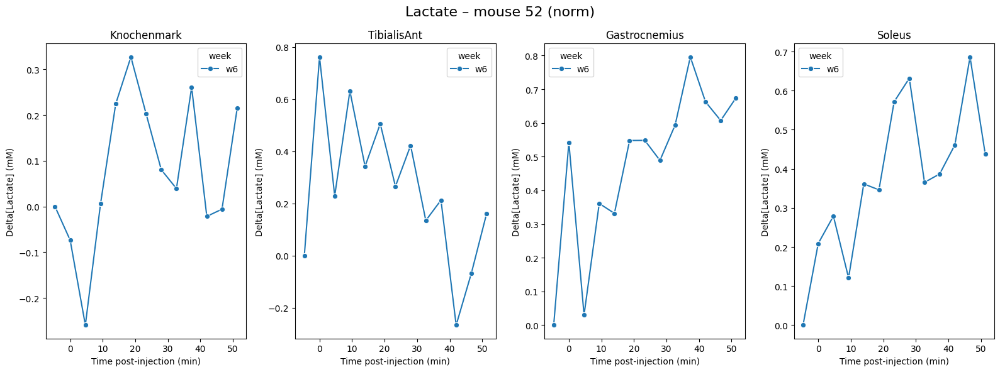

<Figure size 640x480 with 0 Axes>

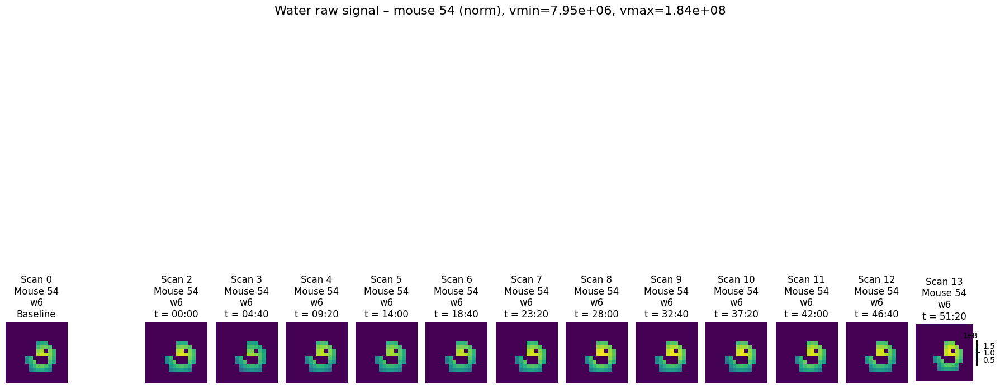

<Figure size 640x480 with 0 Axes>

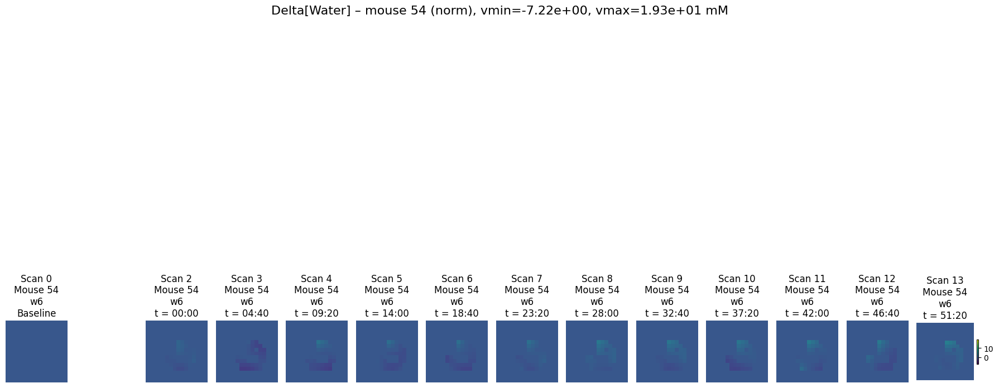

<Figure size 640x480 with 0 Axes>

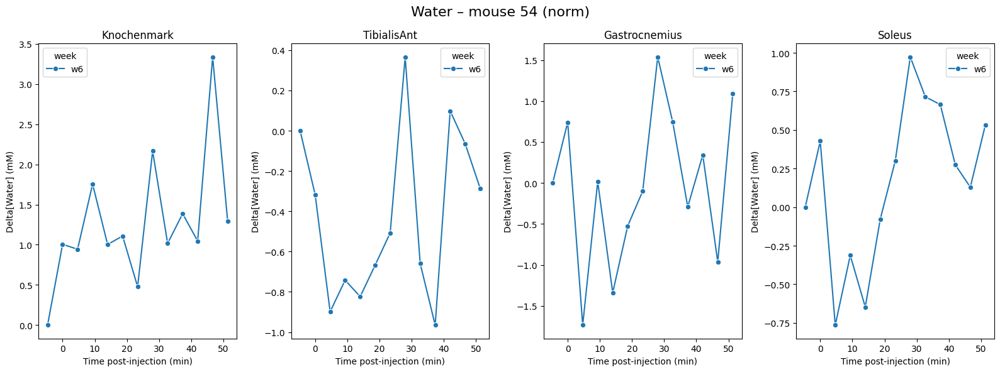

<Figure size 640x480 with 0 Axes>

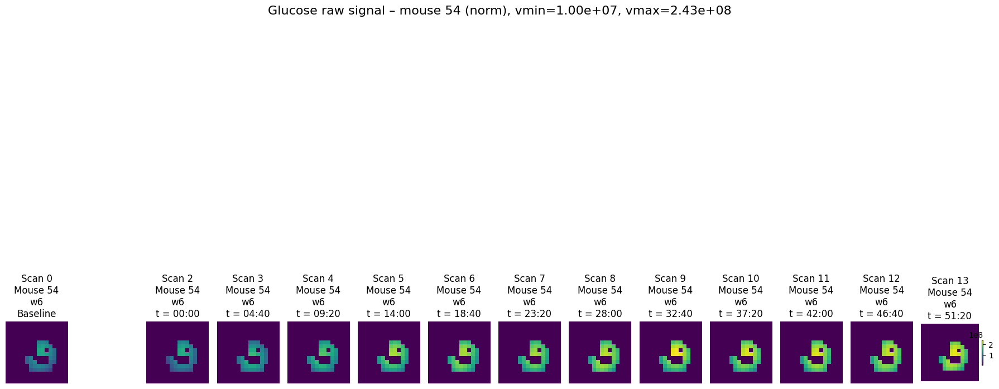

<Figure size 640x480 with 0 Axes>

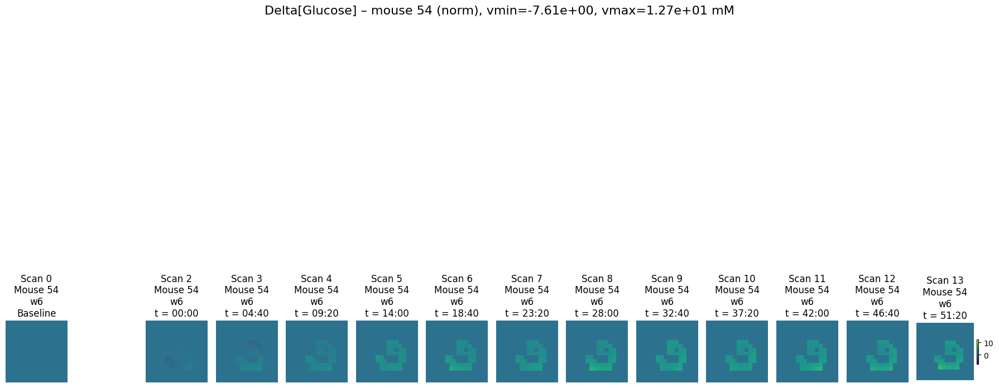

<Figure size 640x480 with 0 Axes>

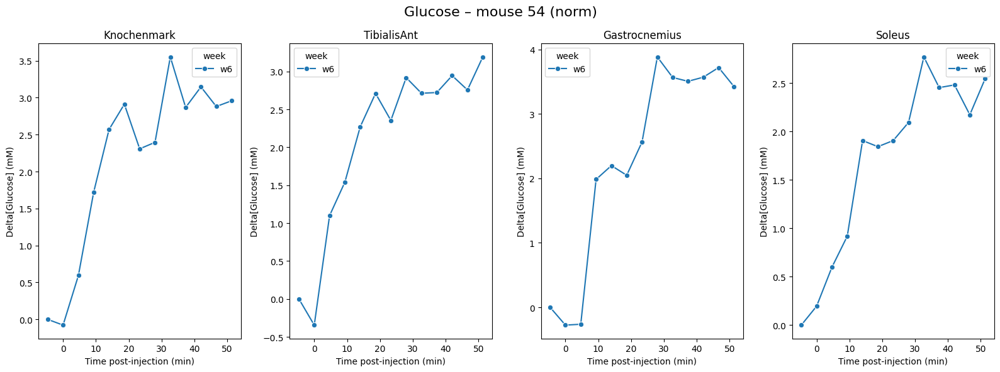

<Figure size 640x480 with 0 Axes>

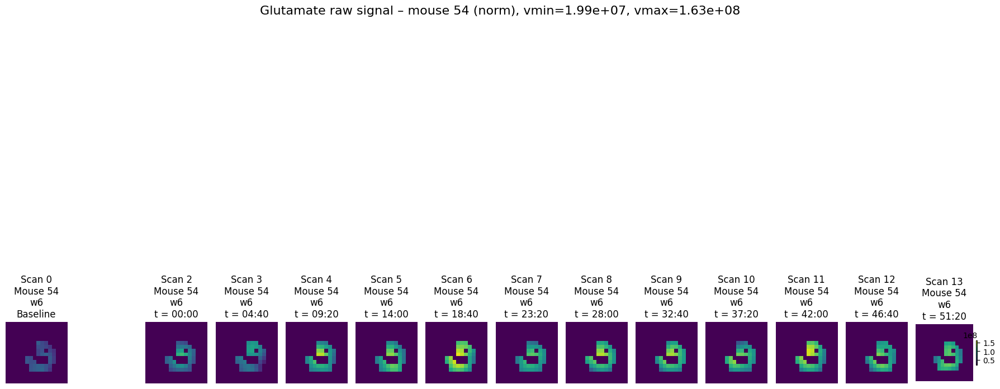

<Figure size 640x480 with 0 Axes>

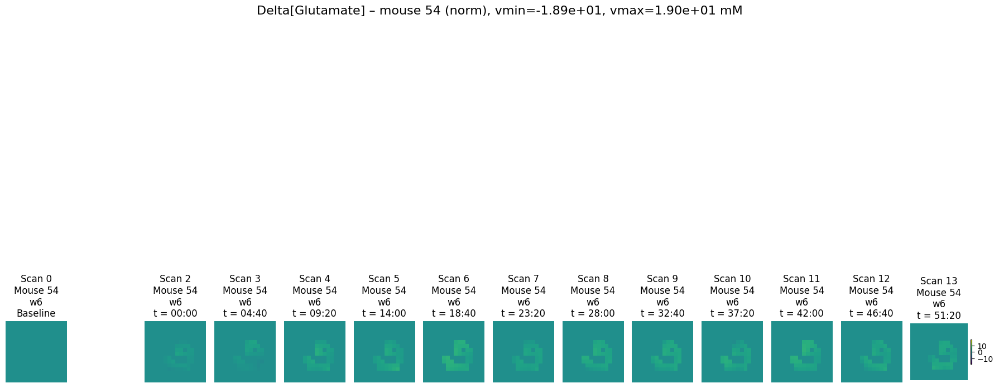

<Figure size 640x480 with 0 Axes>

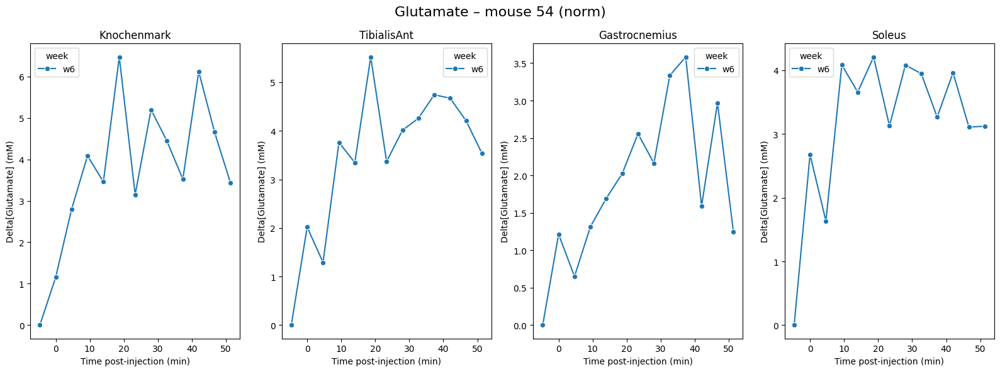

<Figure size 640x480 with 0 Axes>

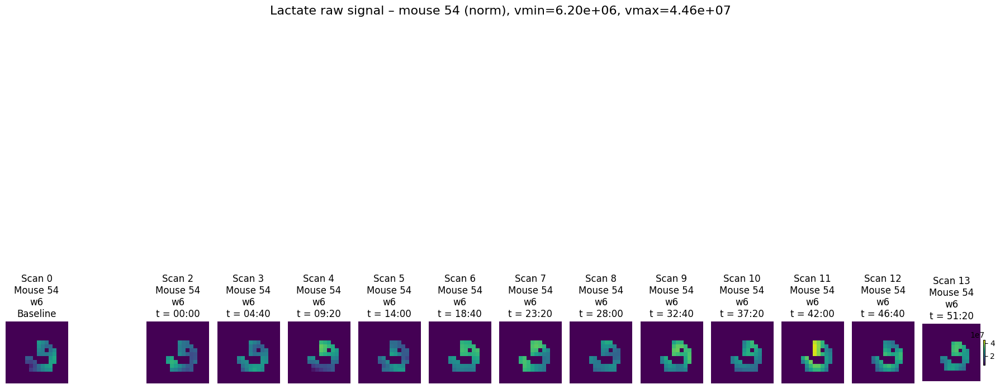

<Figure size 640x480 with 0 Axes>

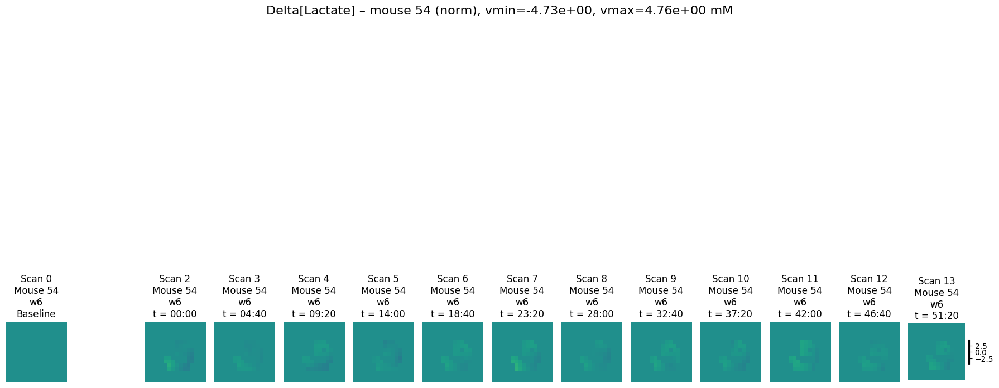

<Figure size 640x480 with 0 Axes>

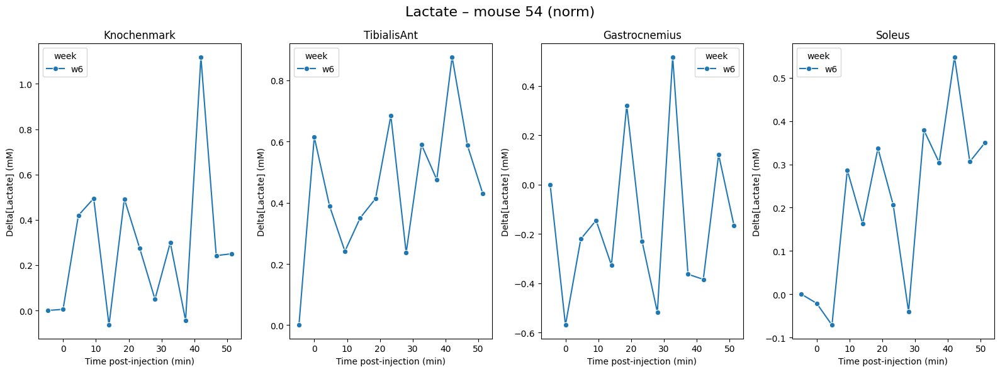

<Figure size 640x480 with 0 Axes>

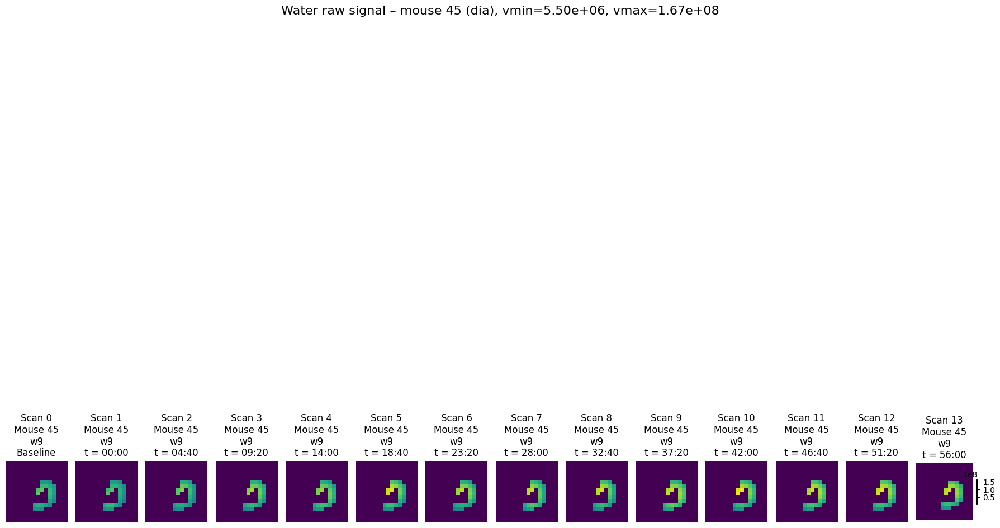

<Figure size 640x480 with 0 Axes>

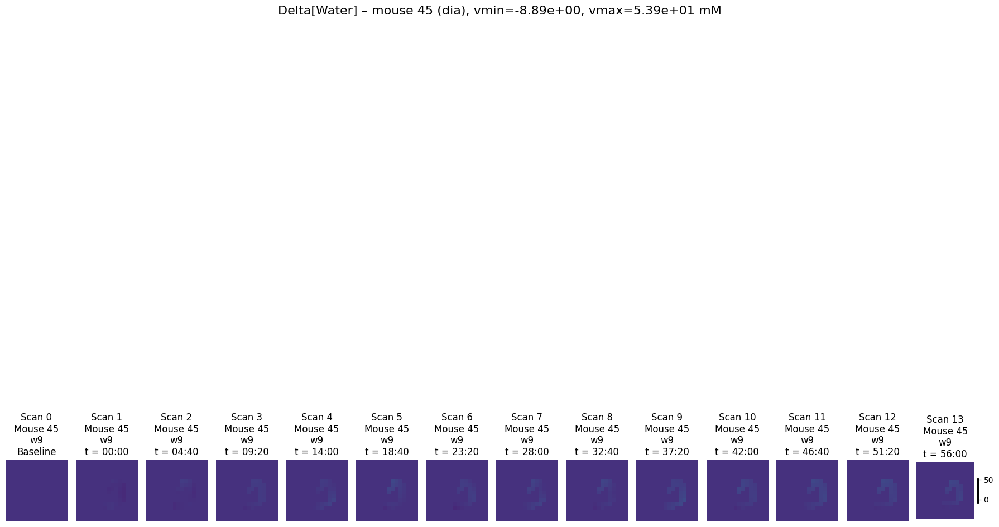

<Figure size 640x480 with 0 Axes>

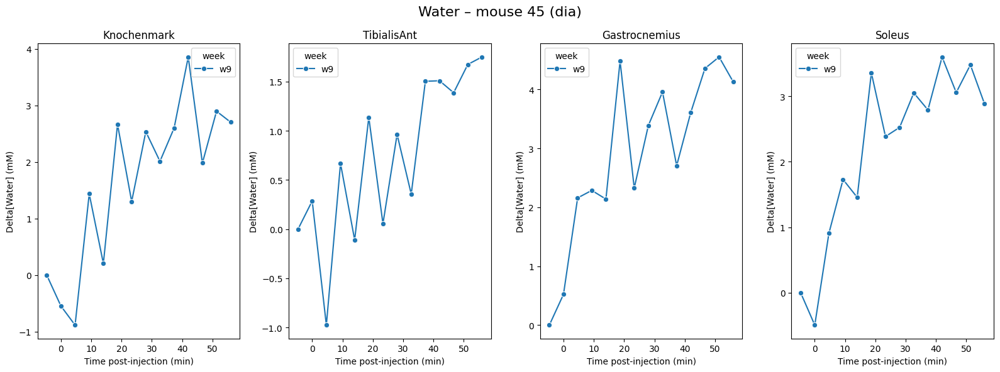

<Figure size 640x480 with 0 Axes>

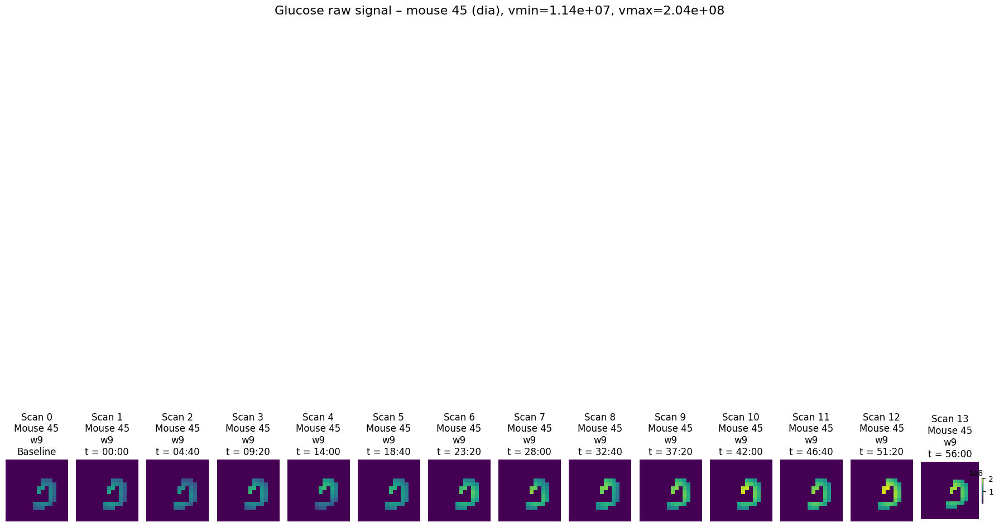

<Figure size 640x480 with 0 Axes>

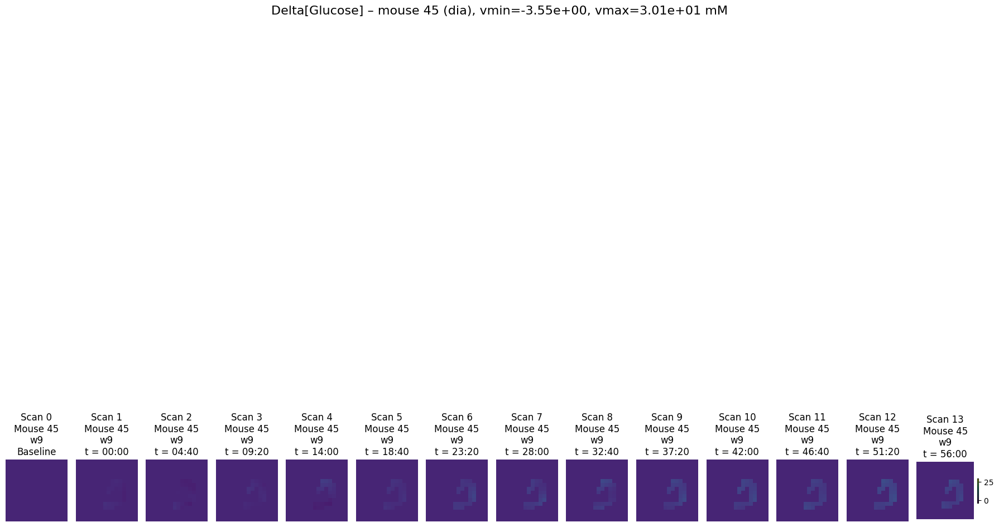

<Figure size 640x480 with 0 Axes>

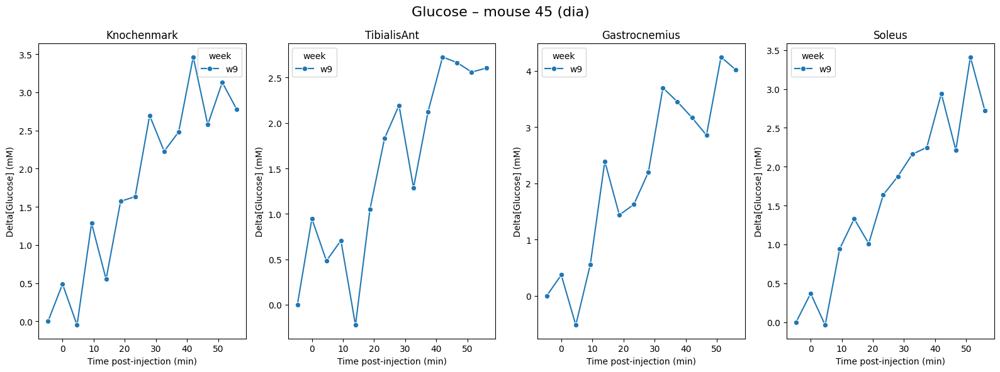

<Figure size 640x480 with 0 Axes>

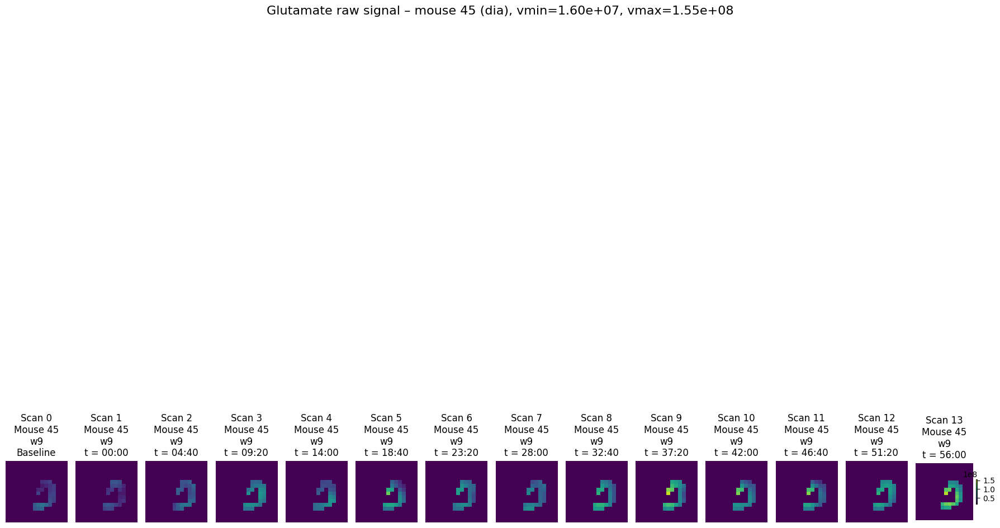

<Figure size 640x480 with 0 Axes>

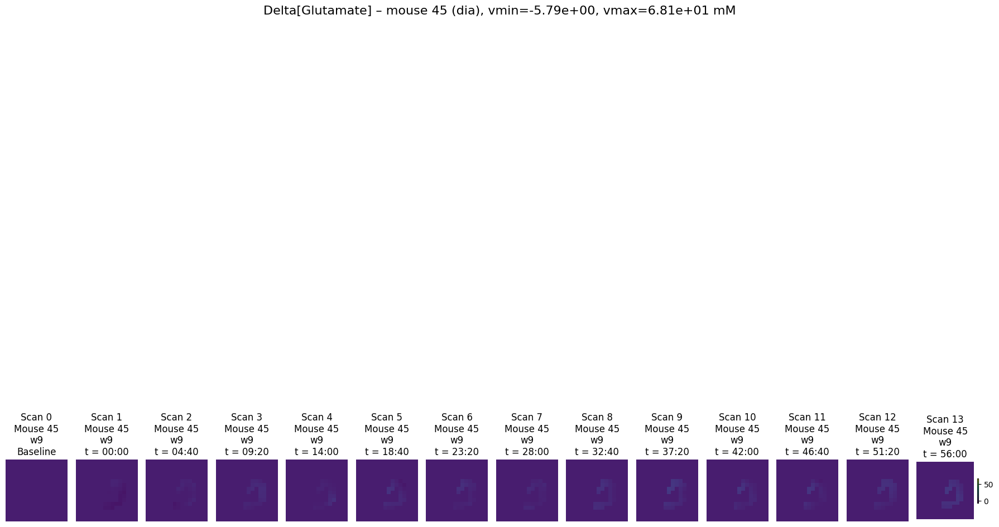

<Figure size 640x480 with 0 Axes>

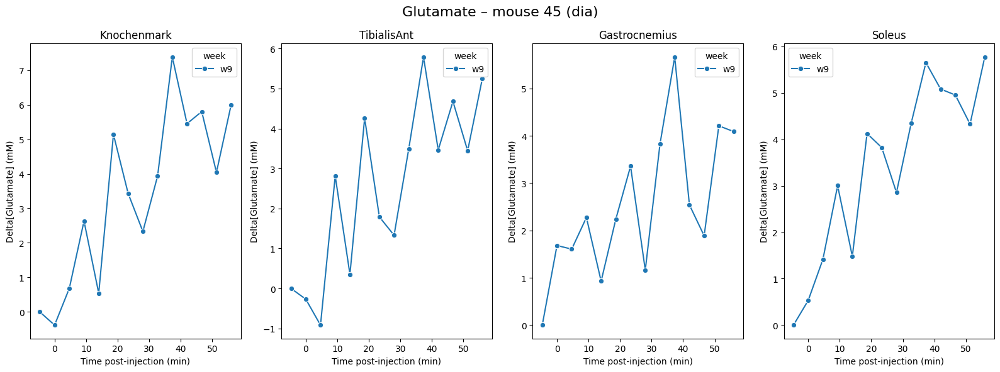

<Figure size 640x480 with 0 Axes>

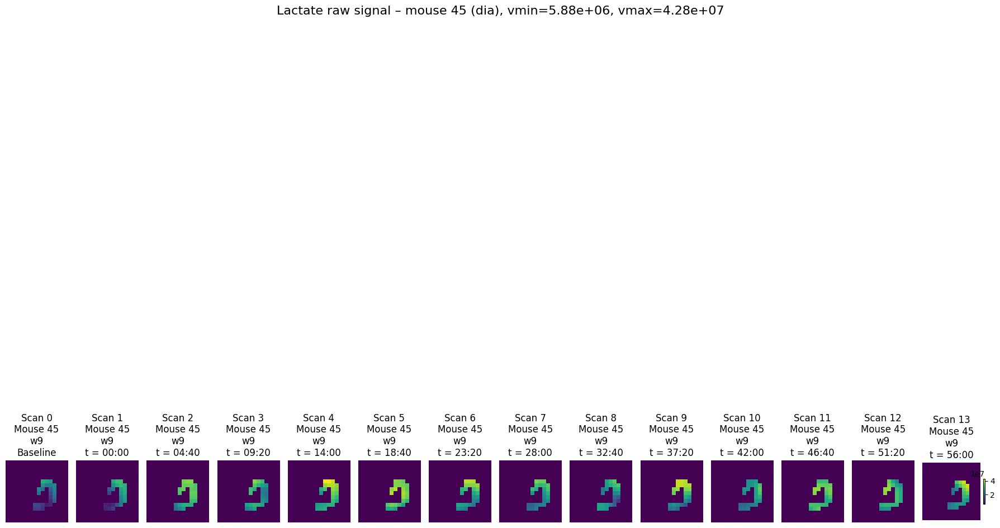

<Figure size 640x480 with 0 Axes>

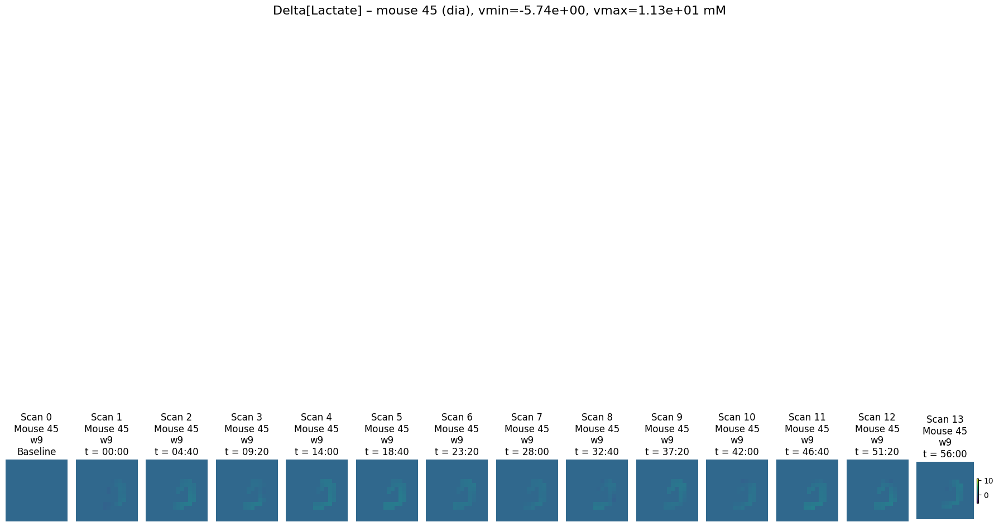

<Figure size 640x480 with 0 Axes>

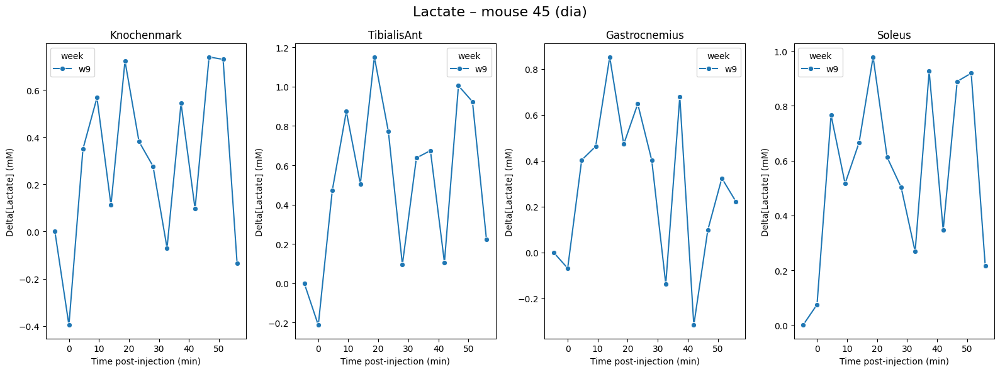

<Figure size 640x480 with 0 Axes>

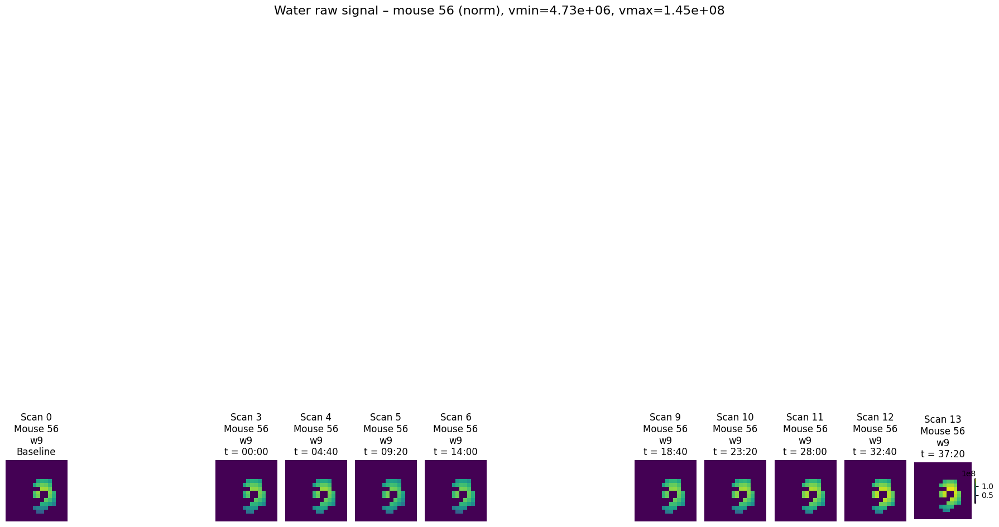

<Figure size 640x480 with 0 Axes>

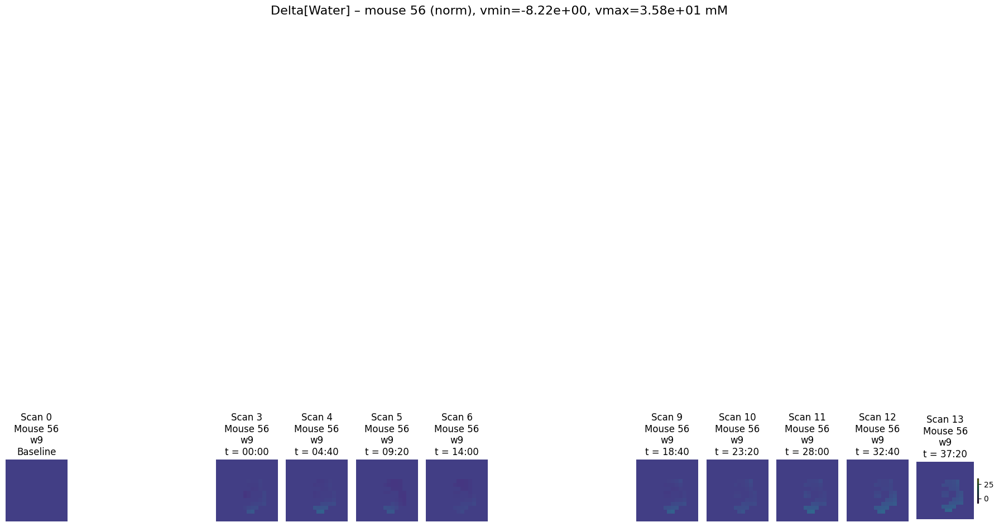

<Figure size 640x480 with 0 Axes>

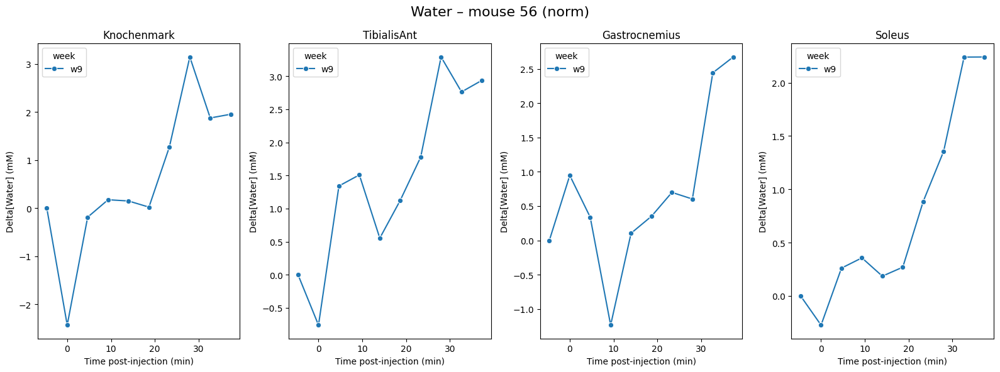

<Figure size 640x480 with 0 Axes>

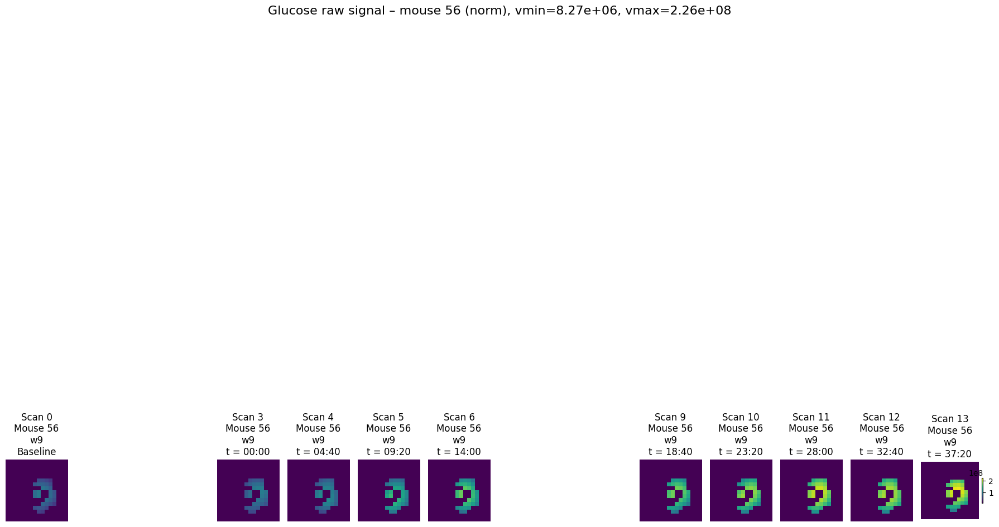

<Figure size 640x480 with 0 Axes>

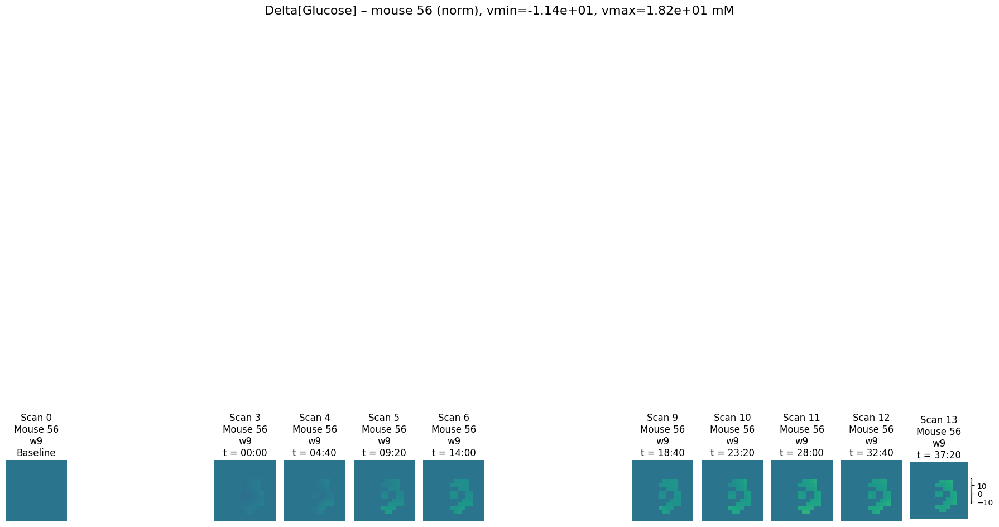

<Figure size 640x480 with 0 Axes>

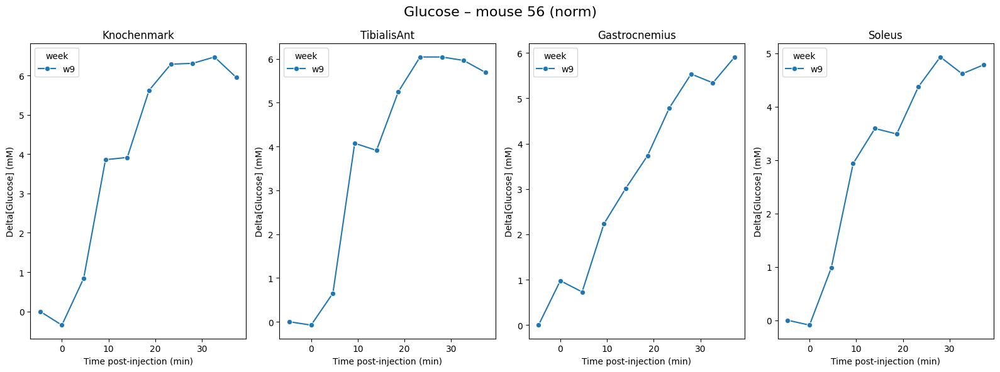

<Figure size 640x480 with 0 Axes>

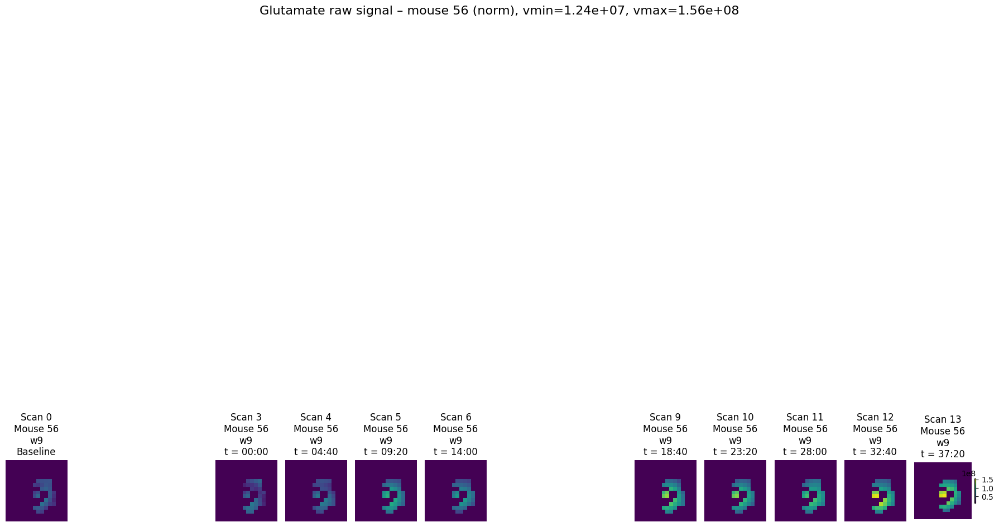

<Figure size 640x480 with 0 Axes>

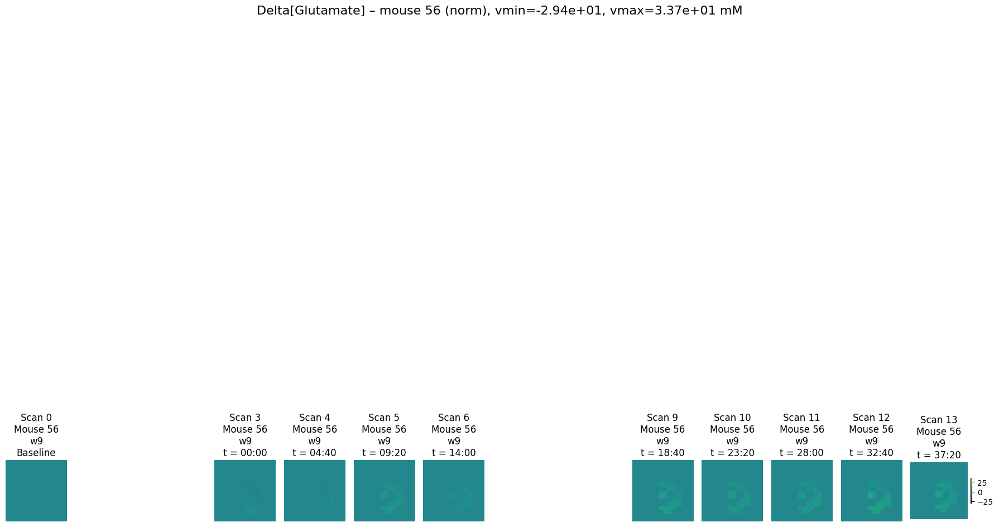

<Figure size 640x480 with 0 Axes>

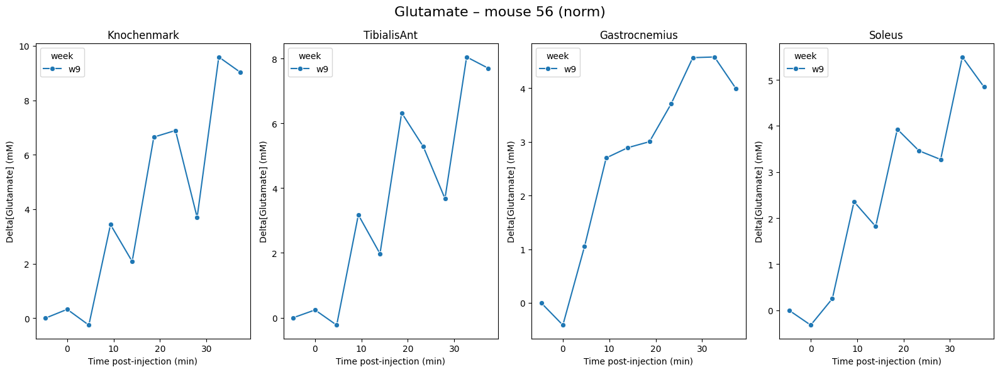

<Figure size 640x480 with 0 Axes>

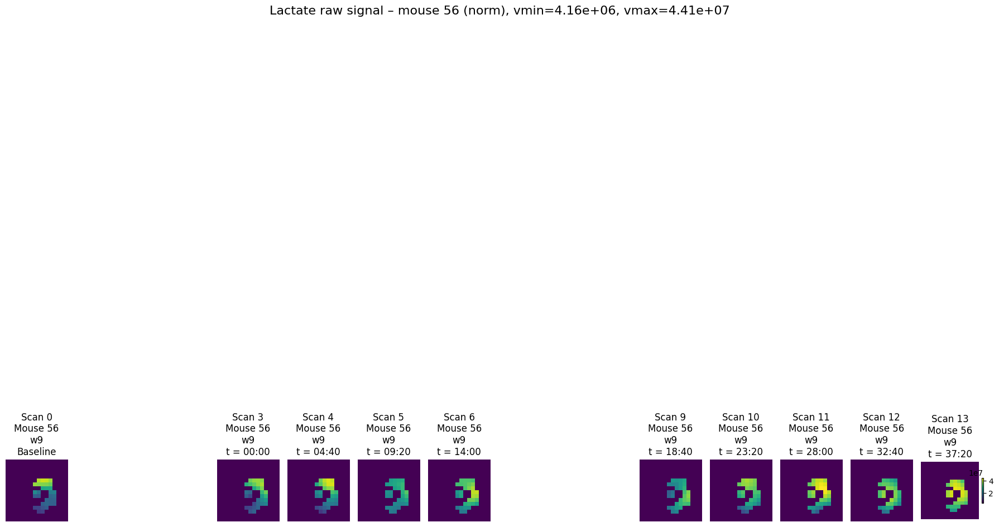

<Figure size 640x480 with 0 Axes>

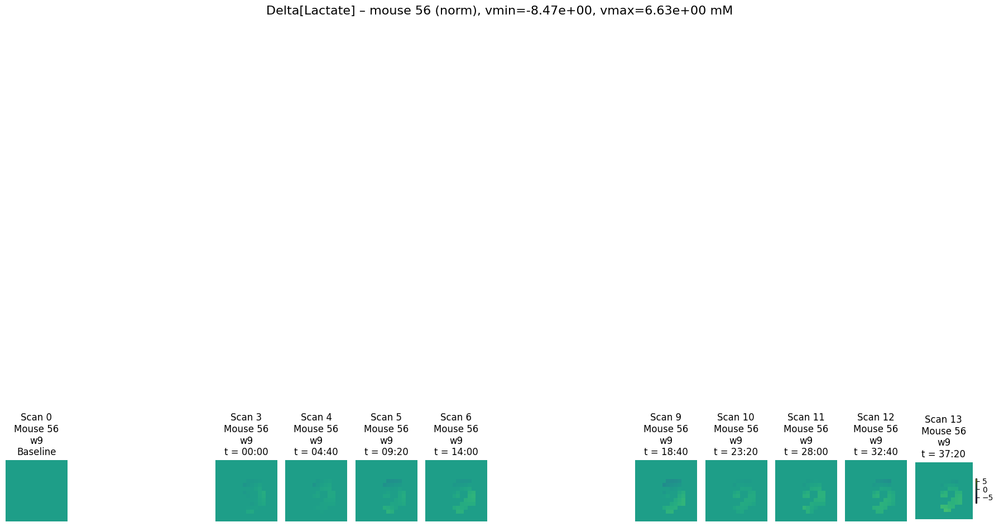

<Figure size 640x480 with 0 Axes>

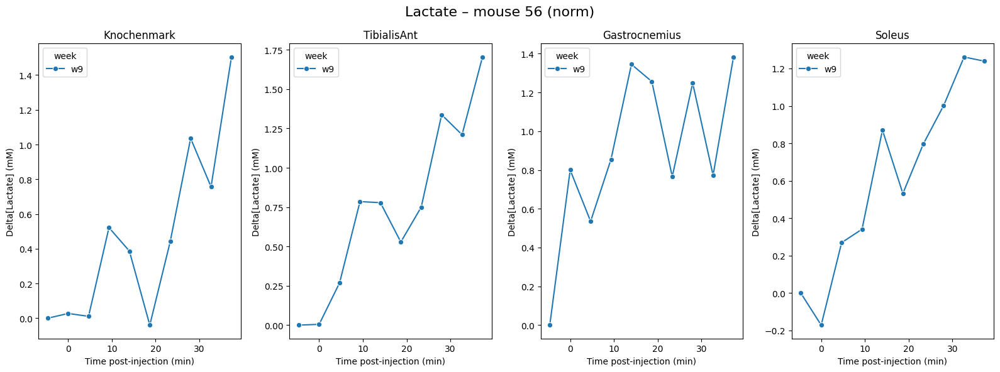

['data_tissue_vals_model_fitting.joblib.xz']

In [14]:
# ============================================================
# Cell 2 – Concentration conversion and visualisation
#
# For each mouse and metabolite:
#
#   Step A – Baseline images
#     Collect all scans labelled 'Baseline' and average them per week to get
#     S_met_baseline(x,y) and S_HDO_baseline(x,y).
#
#   Step B – Δ-concentration maps
#     For every scan t, compute the change in metabolite concentration:
#
#       Δ[Met](x,y,t) = (S_met(x,y,t) − S_met_baseline(x,y))
#                       ─────────────────────────────────────  ×  F_met
#                             S_HDO_baseline(x,y)
#
#     F_met = (SF_HDO / SF_Met) × (17.16 mM / N_D) × voxel_water_fraction
#       SF_X  = saturation factor for species X (Ernst equation, see Cell 0)
#       N_D   = number of equivalent 2H atoms per molecule
#               (1 for HDO, 2 for Glc/Lac, 4/3 for Glx)
#
#     NOTE: this yields a DELTA concentration (change from pre-injection
#     baseline), not an absolute concentration.  The baseline subtraction
#     removes the natural-abundance 2H background so only the infused
#     labelled compound contributes.
#     The reference formula (PMC11922071) computes absolute concentration
#     using S_met directly (without baseline subtraction).
#
#   Step C – Plots
#     1. Raw signal maps (S_met masked to hindlimb region)
#     2. Δ-concentration maps
#     3. Time-course line plots per tissue ROI
# ============================================================
import seaborn as sns
import matplotlib.pyplot as plt

hash_mouseID_2_df_tissue_val      = {}
hash_mouseID_2_week_2_baselineMet = collections.defaultdict(lambda: collections.defaultdict(dict))
arr_tissues    = list(roi_masks.keys())
arr_image_data = []

for mouseID in hash_mouseID2week2mouseMap.keys():

    # ── Step A: compute per-week, per-metabolite baseline images ─────────
    for m_idx, mname in enumerate(metabolites.keys()):
        mouse_group = hash_mouseID2group.get(mouseID, "Unknown")

        # Build scan_num → s_idx mapping so time labels are evenly spaced
        # even when some scans are missing from the data.
        hash_week2scanNum2sIdx = {}
        for w_idx, week in enumerate(WEEKS):
            if week not in hash_mouseID2week2mouseMap[mouseID]:
                continue
            A = hash_mouseID2week2mouseMap[mouseID][week]
            if A is None:
                continue
            arr_scan_nums = [
                scan_num for scan_num in range(min(TARGET_SCANS, A.shape[3]))
                if not np.isnan(A[m_idx, :, :, scan_num]).all()
            ]
            hash_week2scanNum2sIdx[week] = {s: i for i, s in enumerate(sorted(set(arr_scan_nums)))}

        for w_idx, week in enumerate(WEEKS):
            if week not in hash_mouseID2week2mouseMap[mouseID]:
                continue
            A = hash_mouseID2week2mouseMap[mouseID][week]
            if A is None:
                continue

            # Average all scans classified as 'Baseline' for this week
            arr_baseline_image = []
            for scan_num in range(min(TARGET_SCANS, A.shape[3])):
                ax = plt.subplot(len(WEEKS), TARGET_SCANS,
                                 w_idx * TARGET_SCANS + scan_num + 1)
                im = ax.imshow(A[m_idx, :, :, scan_num], origin="lower")
                ax.axis("off")

                if np.isnan(A[m_idx, :, :, scan_num]).all():
                    continue

                s_idx    = hash_week2scanNum2sIdx[week].get(scan_num, None)
                time_str = local_time_label(s_idx, FIRST_POST_INDEX, SCAN_DURATION_SEC)
                if time_str == "Baseline":
                    arr_baseline_image.append(A[m_idx, :, :, scan_num])

            avg_baseline = np.nanmean(arr_baseline_image, axis=0)
            hash_mouseID_2_week_2_baselineMet[mouseID][week][mname] = avg_baseline

    # ── Steps B + C: Δ-concentration maps and plots ───────────────────────
    arr_dfs = []
    for m_idx, mname in enumerate(metabolites.keys()):
        mouse_group = hash_mouseID2group.get(mouseID, "Unknown")

        # Rebuild scan_num → s_idx mapping for this metabolite's valid scans
        hash_week2scanNum2sIdx = {}
        for w_idx, week in enumerate(WEEKS):
            if week not in hash_mouseID2week2mouseMap[mouseID]:
                continue
            A = hash_mouseID2week2mouseMap[mouseID][week]
            if A is None:
                continue
            arr_scan_nums = [
                scan_num for scan_num in range(min(TARGET_SCANS, A.shape[3]))
                if not np.isnan(A[m_idx, :, :, scan_num]).all()
            ]
            hash_week2scanNum2sIdx[week] = {s: i for i, s in enumerate(sorted(set(arr_scan_nums)))}

        # Determine global colour scale for this metabolite across all weeks,
        # separately for raw signal and Δ-concentration images.
        val_min, val_max         = 1e9, -1e9
        val_min_raw, val_max_raw = 1e9, -1e9
        for w_idx, week in enumerate(WEEKS):
            if week not in hash_mouseID2week2mouseMap[mouseID]:
                continue
            A = hash_mouseID2week2mouseMap[mouseID][week]
            if A is None:
                continue
            for scan_num in range(min(TARGET_SCANS, A.shape[3])):
                if np.isnan(A[m_idx, :, :, scan_num]).all():
                    continue
                cur_image0 = A[m_idx, :, :, scan_num]
                cur_image  = (
                    (cur_image0 - hash_mouseID_2_week_2_baselineMet[mouseID][week][mname])
                    / hash_mouseID_2_week_2_baselineMet[mouseID][week]["Water"]
                    * hash_conc_transform_factor[mname]
                )
                val_min     = np.nanmin([val_min,     np.nanmin(cur_image)])
                val_max     = np.nanmax([val_max,     np.nanmax(cur_image)])
                val_min_raw = np.nanmin([val_min_raw, np.nanmin(cur_image0)])
                val_max_raw = np.nanmax([val_max_raw, np.nanmax(cur_image0)])

        # ── Plot 1: raw signal maps ───────────────────────────────────────
        plt.clf()
        plt.figure(figsize=(18, 10))
        arr_tissue_vals = []
        for w_idx, week in enumerate(WEEKS):
            if week not in hash_mouseID2week2mouseMap[mouseID]:
                continue
            A = hash_mouseID2week2mouseMap[mouseID][week]
            if A is None:
                continue
            mask_hindlimb = (
                hash_mouseID2week2maskMap[mouseID].get(week)
                if mouseID in hash_mouseID2week2maskMap else None
            )
            if mask_hindlimb is None:
                mask_hindlimb = np.ones((A.shape[1], A.shape[2]), dtype=bool)

            for scan_num in range(min(TARGET_SCANS, A.shape[3])):
                if np.isnan(A[m_idx, :, :, scan_num]).all():
                    continue
                s_idx    = hash_week2scanNum2sIdx[week].get(scan_num, None)
                time_str = local_time_label(s_idx, FIRST_POST_INDEX, SCAN_DURATION_SEC)
                ttime    = (s_idx - FIRST_POST_INDEX) * SCAN_DURATION_SEC
                cur_image0 = A[m_idx, :, :, scan_num]
                ax = plt.subplot(len(WEEKS), TARGET_SCANS,
                                 w_idx * TARGET_SCANS + scan_num + 1)
                im = ax.imshow(mask_hindlimb * cur_image0, origin="lower",
                               vmin=val_min_raw, vmax=val_max_raw)
                ax.axis("off")
                ax.set_title(f"Scan {scan_num}\nMouse {mouseID}\n{week}\n{time_str}")
        plt.suptitle(
            f"{mname} raw signal – mouse {mouseID} ({mouse_group}), "
            f"vmin={val_min_raw:.2e}, vmax={val_max_raw:.2e}", fontsize=16
        )
        plt.colorbar(im, ax=plt.gca(), fraction=0.02)
        plt.tight_layout()
        plt.show()

        # ── Plot 2: Δ-concentration maps ──────────────────────────────────
        plt.clf()
        plt.figure(figsize=(18, 10))
        arr_tissue_vals = []
        for w_idx, week in enumerate(WEEKS):
            if week not in hash_mouseID2week2mouseMap[mouseID]:
                continue
            A = hash_mouseID2week2mouseMap[mouseID][week]
            if A is None:
                continue

            # Look up tissue ROI pixel coordinates for this mouse/week
            hash_tissue2coords = {}
            for tissue in roi_masks.keys():
                if week in roi_masks[tissue] and mouseID in roi_masks[tissue][week]:
                    mask = roi_masks[tissue][week][mouseID]
                    if mask is not None:
                        ii, jj = np.where(mask)
                        hash_tissue2coords[tissue] = (ii[0], jj[0])

            mask_hindlimb = (
                hash_mouseID2week2maskMap[mouseID].get(week)
                if mouseID in hash_mouseID2week2maskMap else None
            )
            if mask_hindlimb is None:
                mask_hindlimb = np.ones((A.shape[1], A.shape[2]), dtype=bool)

            for scan_num in range(min(TARGET_SCANS, A.shape[3])):
                if np.isnan(A[m_idx, :, :, scan_num]).all():
                    continue
                s_idx    = hash_week2scanNum2sIdx[week].get(scan_num, None)
                time_str = local_time_label(s_idx, FIRST_POST_INDEX, SCAN_DURATION_SEC)
                ttime    = (s_idx - FIRST_POST_INDEX) * SCAN_DURATION_SEC

                cur_image0 = A[m_idx, :, :, scan_num]

                # Apply the Δ-concentration formula (see cell header)
                cur_image = (
                    (cur_image0 - hash_mouseID_2_week_2_baselineMet[mouseID][week][mname])
                    / hash_mouseID_2_week_2_baselineMet[mouseID][week]["Water"]
                    * hash_conc_transform_factor[mname]
                )

                ax = plt.subplot(len(WEEKS), TARGET_SCANS,
                                 w_idx * TARGET_SCANS + scan_num + 1)
                im = ax.imshow(mask_hindlimb * cur_image, origin="lower",
                               vmin=val_min, vmax=val_max)
                ax.axis("off")

                arr_image_data.append(
                    (mouseID, mouse_group, week, scan_num, ttime, mname,
                     mask_hindlimb * cur_image)
                )

                # Extract scalar concentration value for each tissue ROI pixel
                for tissue, (x, y) in hash_tissue2coords.items():
                    tissue_val_raw = cur_image0[x, y]
                    tissue_val     = cur_image[x, y]
                    arr_tissue_vals.append(
                        (week, scan_num, s_idx, ttime,
                         tissue_val_raw, tissue_val, tissue, mname)
                    )
                ax.set_title(f"Scan {scan_num}\nMouse {mouseID}\n{week}\n{time_str}")

        df_tissue_vals = pd.DataFrame(
            arr_tissue_vals,
            columns=["week", "scan_num", "s_idx", "time_sec",
                     "tissue_val_raw", "tissue_val", "tissue", "metabolite"]
        )
        df_tissue_vals["time_minute"] = df_tissue_vals["time_sec"] / 60
        arr_dfs.append(df_tissue_vals)

        plt.suptitle(
            f"Delta[{mname}] – mouse {mouseID} ({mouse_group}), "
            f"vmin={val_min:.2e}, vmax={val_max:.2e} mM", fontsize=16
        )
        plt.colorbar(im, ax=plt.gca(), fraction=0.02)
        plt.tight_layout()
        plt.show()

        # ── Plot 3: time-course per tissue ROI ────────────────────────────
        plt.clf()
        fig, axes = plt.subplots(1, 4, figsize=(16, 6))
        for i_fig, tissue in enumerate(arr_tissues):
            ax = axes[i_fig]
            df_sub = df_tissue_vals[df_tissue_vals["tissue"] == tissue]
            sns.lineplot(data=df_sub, x="time_minute", y="tissue_val",
                         hue="week", marker="o", ax=ax)
            ax.set_title(tissue)
            ax.set_ylabel(f"Delta[{mname}] (mM)")
            ax.set_xlabel("Time post-injection (min)")
        plt.suptitle(f"{mname} – mouse {mouseID} ({mouse_group})", fontsize=16)
        plt.tight_layout()
        plt.show()

    grand_df = pd.concat(arr_dfs, axis=0)
    hash_mouseID_2_df_tissue_val[mouseID] = grand_df

df_image_data = pd.DataFrame(
    arr_image_data,
    columns=["mouseID", "mouse_group", "week", "scan_num", "time", "mname", "cur_image"]
)

import joblib
joblib.dump(
    [hash_mouseID_2_df_tissue_val, hash_mouseID2group, df_image_data,
     hash_mouseID2week2maskMap, hash_mouseID2week2H1anatomical],
    "data_tissue_vals_model_fitting.joblib.xz"
)


In [ ]:
# ============================================================
# create a table of voxel-wise metabolite concentrations for model fitting
# supplementary material for paper, not used for the main analysis
# ============================================================

import joblib
hash_mouseID_2_df_tissue_val, hash_mouseID2group, df_image_data, hash_mouseID2week2maskMap, hash_mouseID2week2H1anatomical = joblib.load("data_tissue_vals_model_fitting.joblib.xz")

tmparr = []
for mouseID, tmp_df in hash_mouseID_2_df_tissue_val.items():
    tmp_df2 = tmp_df.copy().rename(columns={"tissue_val": "delta_conc_mM"}).replace({"tissue": {"TibialisAnt": "Tibialis Anterior", "Knochenmark": "Bone Marrow", "Gastrocnemius": "Gastrocnemius", "Soleus": "Soleus"}})
    tmp_df2['mouse_ID'] = mouseID
    tmp_df2['mouse_group'] = hash_mouseID2group.get(mouseID, "Unknown")
    tmparr.append(tmp_df2)
df_table_voxel_met_conc = pd.concat(tmparr, axis=0)
df_table_voxel_met_conc.to_csv("table_voxel_met_conc.csv.xz", index=False, compression="xz")